In [149]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from statsmodels.tsa.stattools import adfuller
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
from math import sqrt

import warnings
warnings.filterwarnings('ignore')

In [8]:
df = pd.read_csv('Walmart DataSet.csv')

In [9]:
df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')

In [10]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106


In [14]:
df.shape

(6435, 8)

In [15]:
df.dtypes

Store                    int64
Date            datetime64[ns]
Weekly_Sales           float64
Holiday_Flag             int64
Temperature            float64
Fuel_Price             float64
CPI                    float64
Unemployment           float64
dtype: object

In [11]:
df.columns

Index(['Store', 'Date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature',
       'Fuel_Price', 'CPI', 'Unemployment'],
      dtype='object')

In [16]:
# Check for duplicates

df.duplicated().sum()

0

#### Check for Missing values

In [12]:
df.isnull().sum().sum()

0

#### Check for Missing dates

In [17]:
# Calculate the difference in days between consecutive dates
date_diff = df['Date'].diff().dt.days

# Check if any difference is greater than 7 days
missing_weeks = df[date_diff > 7]

# Check if there are missing weeks
if missing_weeks.empty:
    print("There are no missing weeks in the dataset.")
else:
    print("Rows with Difference More Than 7 Days:")
print(missing_weeks)

There are no missing weeks in the dataset.
Empty DataFrame
Columns: [Store, Date, Weekly_Sales, Holiday_Flag, Temperature, Fuel_Price, CPI, Unemployment]
Index: []


#### Outlier analysis

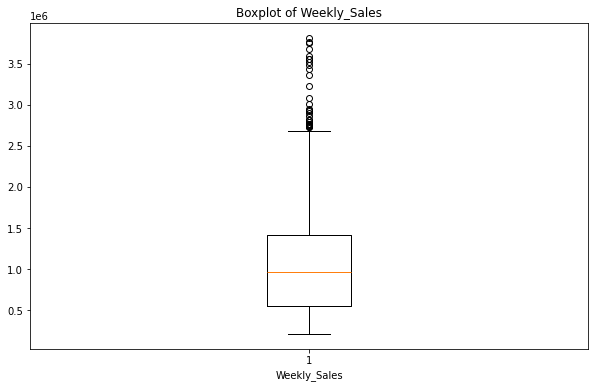

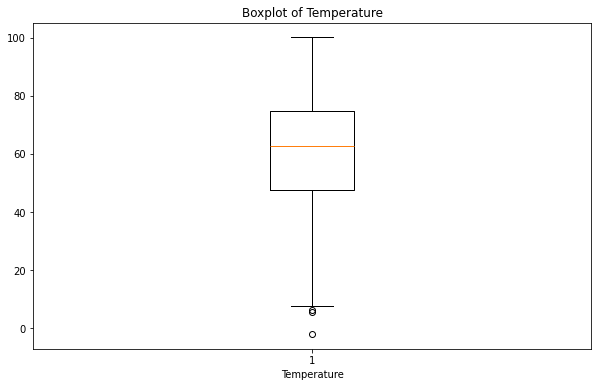

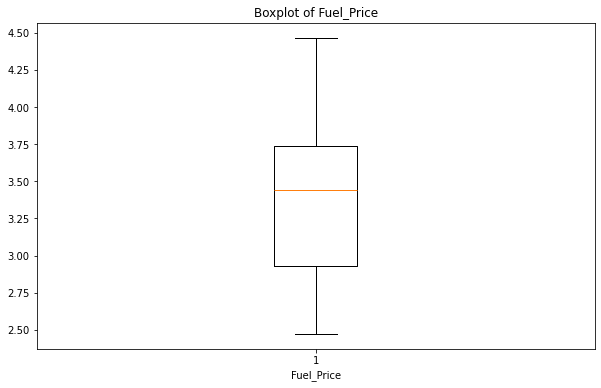

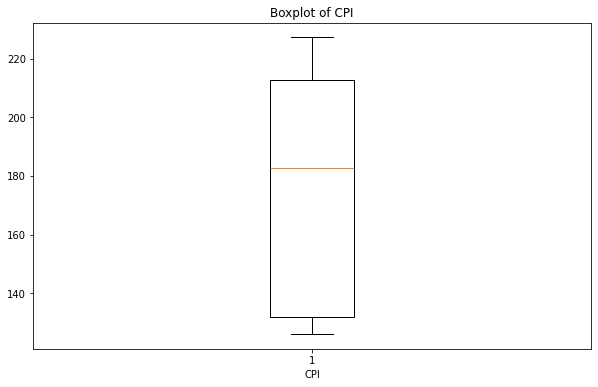

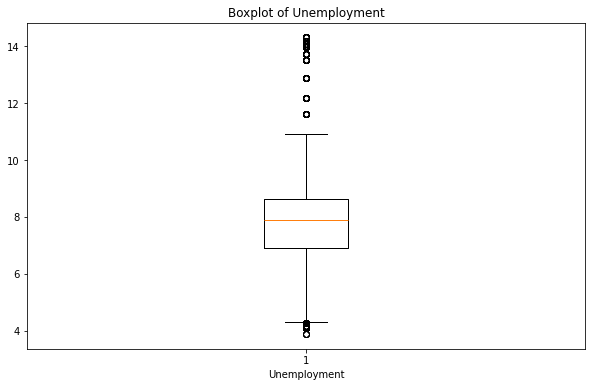

In [18]:
# List of columns for boxplots
columns = ['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']

# Loop through each column and create boxplots
for col in columns:
    plt.figure(figsize=(10, 6))
    plt.boxplot(df[col])
    plt.xlabel(col)
    plt.title(f'Boxplot of {col}')
    plt.show()

Outliers :
- Weekly sales column has outliers on the higher side.
- Temperature column has a few outliers on lower side.
- Fuel price and CPI have no outliers.
- Unemployment rate has outliers on the upper side.


#### Exploratory Data Analysis :

##### a. If the weekly sales are affected by the unemployment rate, if yes - which stores are suffering the most ?

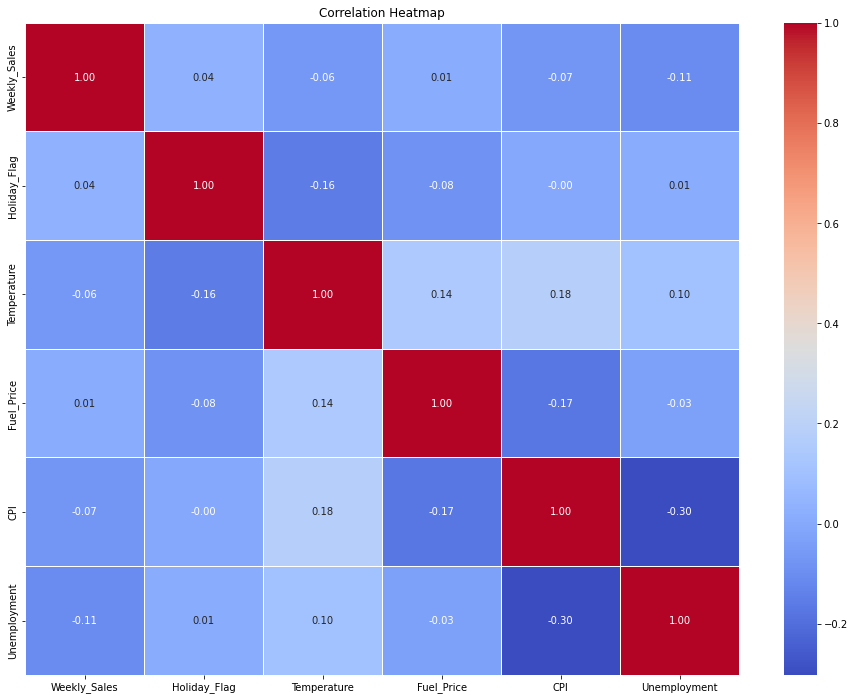

In [21]:
# Select the columns for the heatmap
columns = ['Weekly_Sales', 'Holiday_Flag', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']

# Create a correlation matrix
corr = df[columns].corr()

# Create a heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=1)
plt.title('Correlation Heatmap')
plt.show()

Correlation :
- Weekly sales has only negative 0.11 correlation with unemployment rate, it indicates a very weak correlation, that is there is almost no linear relationship between the two variables.
- From the plot, we can see the other variables also do not have strong correlation with any other variables.

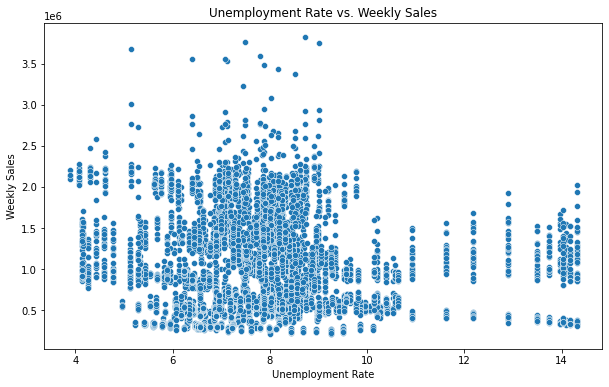

In [22]:
# Scatter plot to visualize the relationship
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Unemployment', y='Weekly_Sales', data=df)
plt.title('Unemployment Rate vs. Weekly Sales')
plt.xlabel('Unemployment Rate')
plt.ylabel('Weekly Sales')
plt.show()

- The scatter plot also shows the non-linear relationship between weekly sales and unemployment rate.

<b>Store Comparison :</b>
- Comparing the average weekly sales for different levels of unemployment across all stores to identify if stores with higher unemployment rates tend to have lower average weekly sales.

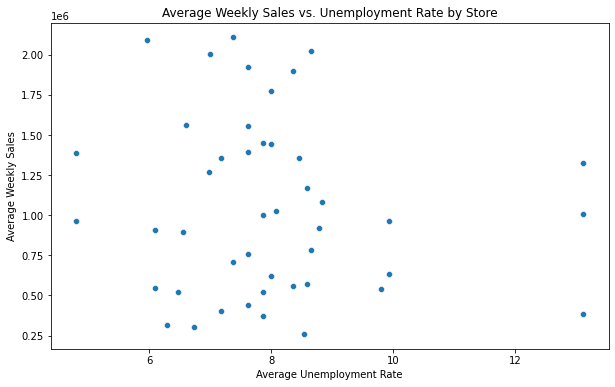

In [23]:
# Group data by store and calculate average weekly sales and unemployment rate
store_sales_unemployment = df.groupby('Store')[['Weekly_Sales', 'Unemployment']].mean().reset_index()

# Scatter plot to compare average sales by unemployment rate
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Unemployment', y='Weekly_Sales', data=store_sales_unemployment)
plt.title('Average Weekly Sales vs. Unemployment Rate by Store')
plt.xlabel('Average Unemployment Rate')
plt.ylabel('Average Weekly Sales')
plt.show()

- There is no linear relationship.
- But more sales has happened when the unemployment rate is low to moderate. At high unemployment rate, at 10 and beyond hardly much sales has taken place.

<b>Scatter plots for each store separately to visualize the relationship between weekly sales and the unemployment rate :

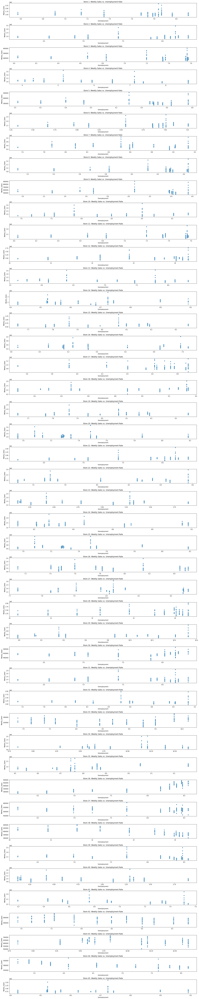

In [57]:
# Get unique stores
stores = df['Store'].unique()

# Set up the matplotlib figure
plt.figure(figsize=(20, 100))

for i, store in enumerate(stores, 1):
    # Filter data for each store
    store_data = df[df['Store'] == store]
    
    # Create subplot for each store
    plt.subplot(len(stores), 1, i)
    sns.scatterplot(x='Unemployment', y='Weekly_Sales', data=store_data)
    
    plt.title(f'Store {store}: Weekly Sales vs. Unemployment Rate')
    plt.tight_layout()

plt.show()


- There is no linear relationship between weekly sales and unemployment rate in any of the stores.

<b>Categorize the stores into high unemployment - high sales, low unemployment - low sales, high unemployment - low sales, low unemployment - high sales :

In [75]:
# Calculate the maximum and minimum weekly sales
max_sales = df['Weekly_Sales'].max()
min_sales = df['Weekly_Sales'].min()

# Calculate the maximum and minimum unemployment rate
max_unemp = df['Unemployment'].max()
min_unemp = df['Unemployment'].min()

# Define custom thresholds based on max and min weekly sales
sales_low = min_sales + (max_sales - min_sales) * 0.2  # 20% above min
sales_high = max_sales - (max_sales - min_sales) * 0.2  # 20% below max

# Define custom thresholds based on max and min unemployment rate
unemployment_low = min_unemp + (max_unemp - min_unemp) * 0.2
unemployment_high = max_unemp - (max_unemp - min_unemp) * 0.2

# Function to categorize stores based on unemployment rate and weekly sales
def categorize_stores(row):
    if row['Unemployment'] > unemployment_high and row['Weekly_Sales'] < sales_low:
        return 'High Unemployment, Low Sales'
    elif row['Unemployment'] < unemployment_low and row['Weekly_Sales'] < sales_low:
        return 'Low Unemployment, Low Sales'
    elif row['Unemployment'] > unemployment_high and row['Weekly_Sales'] > sales_high:
        return 'High Unemployment, High Sales'
    elif row['Unemployment'] < unemployment_low and row['Weekly_Sales'] > sales_high:
        return 'Low Unemployment, High Sales'
    else:
        return 'Other'

# Apply the categorization function to the DataFrame
df['Category'] = df.apply(categorize_stores, axis=1)

# Print the stores in each category without repeating
print("High Unemployment, Low Sales:")
print(df[df['Category'] == 'High Unemployment, Low Sales']['Store'].unique().tolist())
print()

print("Low Unemployment, Low Sales:")
print(df[df['Category'] == 'Low Unemployment, Low Sales']['Store'].unique().tolist())
print()

print("High Unemployment, High Sales:")
print(df[df['Category'] == 'High Unemployment, High Sales']['Store'].unique().tolist())
print()

print("Low Unemployment, High Sales:")
print(df[df['Category'] == 'Low Unemployment, High Sales']['Store'].unique().tolist())
print()


High Unemployment, Low Sales:
[12, 38]

Low Unemployment, Low Sales:
[5, 8, 9, 16, 17, 40, 44]

High Unemployment, High Sales:
[]

Low Unemployment, High Sales:
[4]



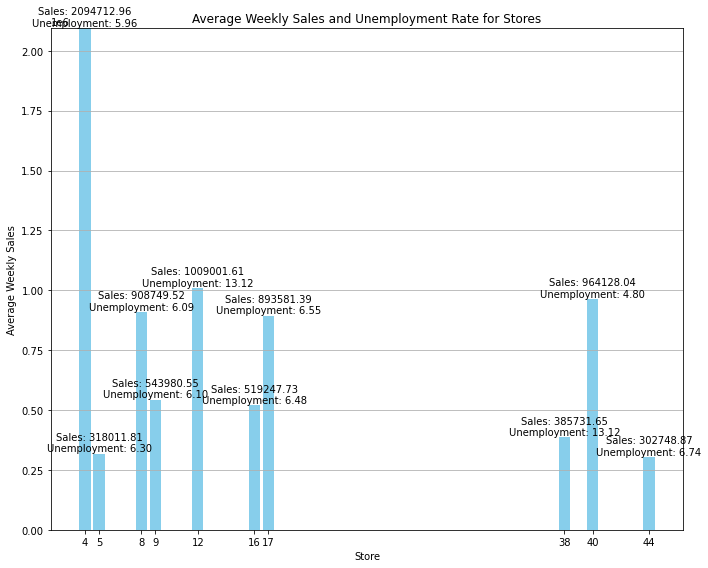

In [90]:
# Filter the DataFrame for Stores 
filtered_df = df[df['Store'].isin([5, 8, 9, 16, 17, 40, 44,4, 12, 38])]

# Group by Store and calculate average Weekly Sales and Unemployment Rate
grouped_df = filtered_df.groupby('Store').mean().reset_index()

# Plot the bar plot for Stores 12 and 38
plt.figure(figsize=(10, 8))
bars = plt.bar(grouped_df['Store'], grouped_df['Weekly_Sales'], color='skyblue')

# Add labels for each bar
for bar, avg_sales, avg_unemployment in zip(bars, grouped_df['Weekly_Sales'], grouped_df['Unemployment']):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 200, f"Sales: {avg_sales:.2f}\nUnemployment: {avg_unemployment:.2f}",
             ha='center', va='bottom')

plt.xlabel('Store')
plt.ylabel('Average Weekly Sales')
plt.title('Average Weekly Sales and Unemployment Rate for Stores')
plt.xticks(grouped_df['Store'])
plt.ylim(0, max(grouped_df['Weekly_Sales']) + 1000)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

Conclusion :
- Store 38 seems to be suffering the most as it falls under the high unemployment rate and low weekly sales category. Next is Store 12 that falls under high unemployment rate and low weekly sales category but the sales are higher compared to Store 38.
- Store 44 has the second lowest weekly sales overall eventhough it falls under the low unemployment rate category. 
- Stores 5, 8, 9, 16, 17, 40, 44 have low unemployment rate and also low weekly sales.
- Store 4 falls in high weekly sales category and also the unemployment rate is low.


##### b. If the weekly sales show seasonal trend, when and what could be the reason ?

- Aggregating the weekly sales across all stores to see the overall trend, that can help identify broader patterns that might not be apparent when looking at individual stores.

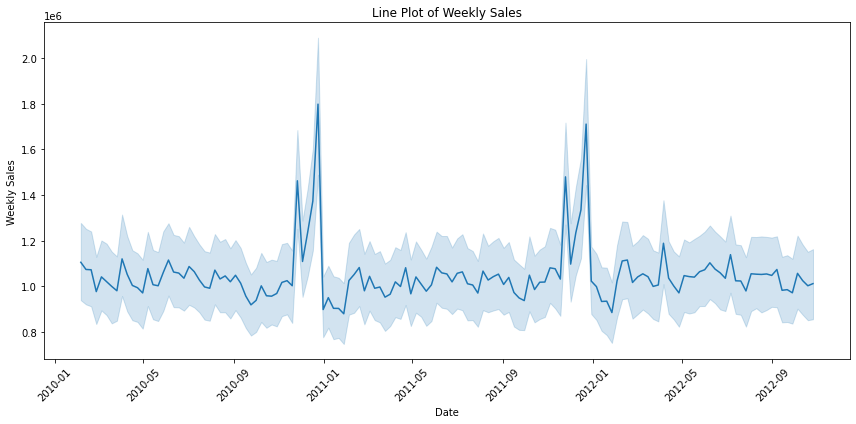

In [91]:
# Line plot of Weekly Sales

plt.figure(figsize=(12, 6))
sns.lineplot(x='Date', y='Weekly_Sales', data=df)
plt.xlabel('Date')
plt.ylabel('Weekly Sales')
plt.title('Line Plot of Weekly Sales')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [93]:
pd.set_option('display.float_format', '{:.2f}'.format)

In [95]:
dfc = df.copy()

In [96]:
dfc.set_index('Date',inplace=True)

In [97]:
# Downsampling the data to reduce granularity

df_m = dfc['Weekly_Sales'].resample('M').mean()

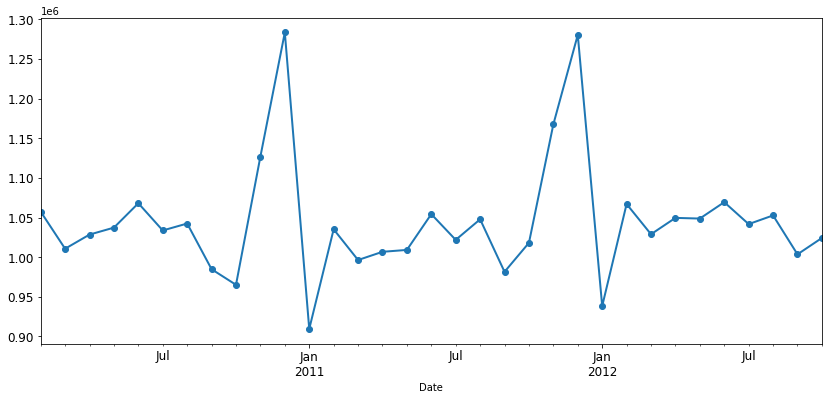

In [99]:
df_m.plot(figsize=(14,6), linewidth=2,marker='o', fontsize=12);

- There is a seasonal pattern in the weekly sales. 
- We can see there is year end increase in sales starting from <b>November</b> and ending by <b>December</b> end.

The reasons for increased sales during November and December can be :

- <b>Holiday Shopping Season</b>: December is widely recognized for the holiday season, which includes major holidays such as Christmas and New Year. This period is traditionally associated with gift-giving, leading to a significant increase in consumer purchasing behavior. Retailers often see a substantial uptick in sales as customers buy gifts, decorations, and supplies for celebrations.

- <b>Early Holiday Shopping</b>: The trend of increased sales in November could indicate that consumers are starting their holiday shopping earlier. Some shoppers prefer to avoid the last-minute rush and take advantage of early holiday promotions and discounts.

- <b>Black Friday and Cyber Monday</b>: November is home to major shopping events such as Black Friday and Cyber Monday. These days are known for significant discounts and deals both in-store and online. The anticipation of these events can lead to a surge in sales as consumers plan their purchases.

- <b>End-of-Year Promotions</b>: Many retailers and businesses offer end-of-year sales and promotions to attract customers and boost sales. These promotions can include significant discounts, special offers, and limited-time deals that encourage consumers to make purchases during this time.

- <b>Seasonal Products and Services</b>: December sales spikes can also be attributed to the demand for seasonal products and services. Items such as winter clothing, holiday decorations, and seasonal foods see increased demand, contributing to the overall rise in sales.

- <b>Marketing and Advertising Campaigns</b>: Retailers invest heavily in marketing and advertising during the holiday season. These campaigns are designed to capture the attention of consumers and drive sales, contributing to the spike observed in December.

##### c. Does temperature affect the weekly sales in any manner ?

- From the heatmap we have already plotted, there is only a negative 0.06 correlation between weekly sales and temperature which means there is no linear relationship between temperature and weekly sales.

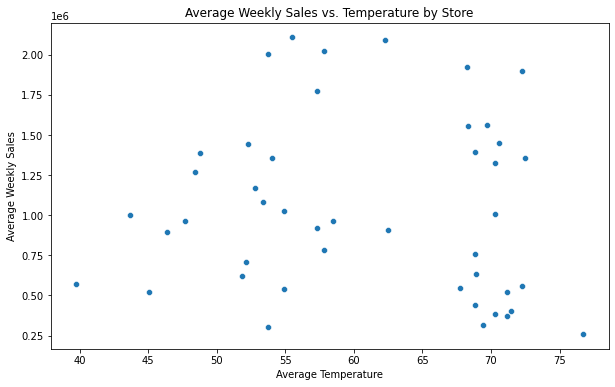

In [109]:
# Group data by store and calculate average weekly sales and temperature
store_sales_temp = df.groupby('Store')[['Weekly_Sales', 'Temperature']].mean().reset_index()

# Scatter plot to compare average sales by unemployment rate
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Temperature', y='Weekly_Sales', data=store_sales_temp)
plt.title('Average Weekly Sales vs. Temperature by Store')
plt.xlabel('Average Temperature')
plt.ylabel('Average Weekly Sales')
plt.show()

- Mostly the sales has happened when the temperature is moderate to high. But we already noticed November and December months regarding peak sales despite low temperature. So we can conclude temperature as such do not affect weekly sales in any manner.

##### d. How is the Consumer Price Index affecting the weekly sales of various stores ?

- From the heatmap we have already plotted, there is only a negative 0.07 correlation between CPI and weekly sales, which means there is no linear relation between the two variables.

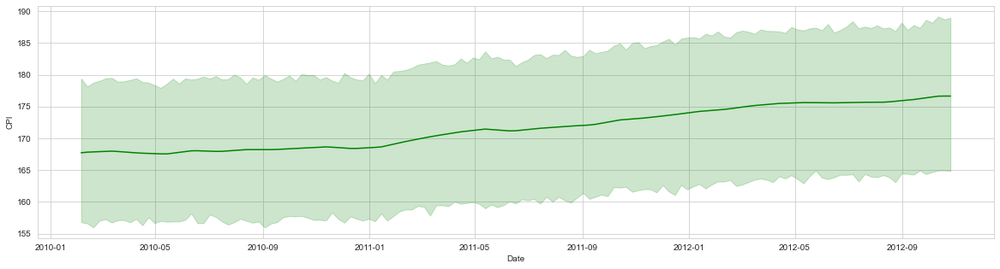

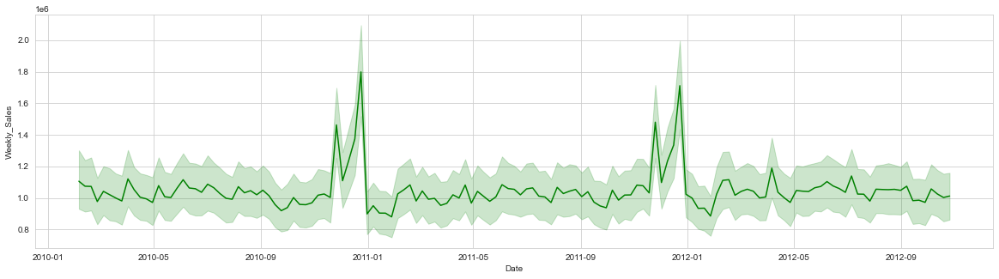

In [114]:
plt.figure(figsize=(20,5))
sns.lineplot(data=df,x='Date',y='CPI',color='green')

plt.figure(figsize=(20,5))
sns.lineplot(data=df,x='Date',y='Weekly_Sales',color='green');

- CPI shows a slight raising trend but that do not seem to have affected the weekly sales of various stoes.

##### e. Top performing stores according to the historical data.

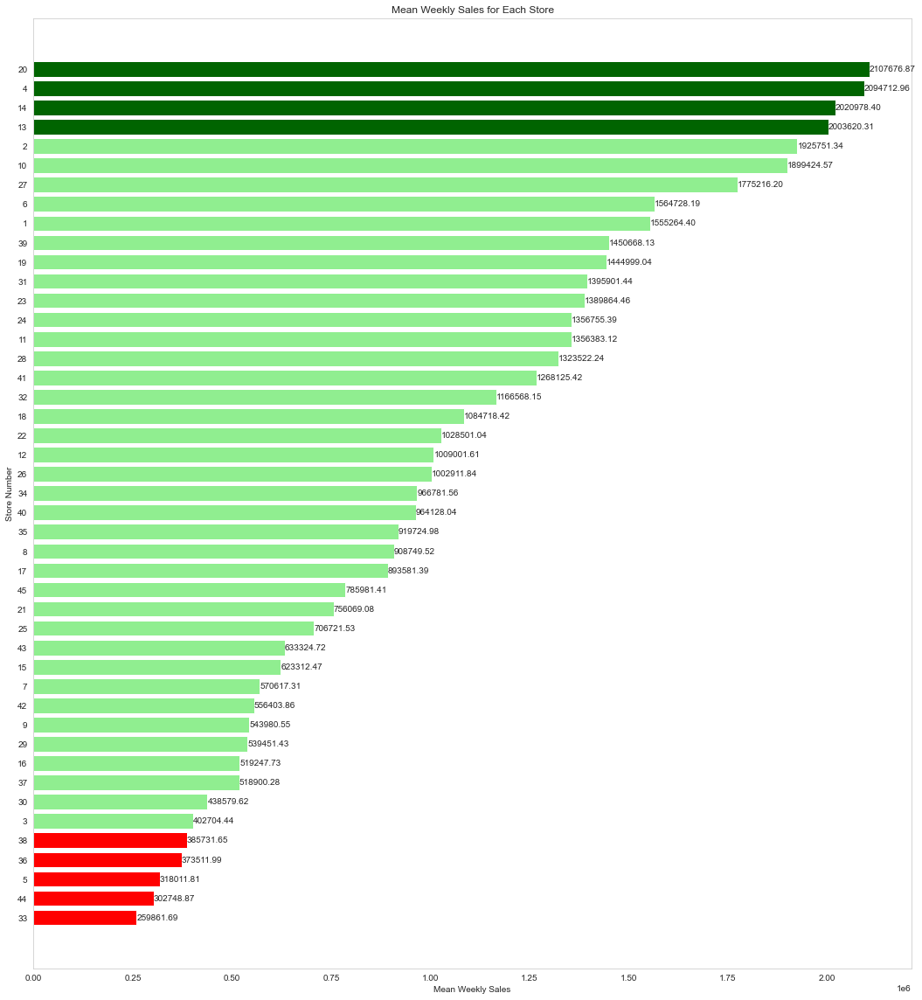

In [122]:
# Calculate mean weekly sales for each store
mean_sales = df.groupby('Store')['Weekly_Sales'].mean().reset_index()

# Sort stores by mean weekly sales in descending order
mean_sales = mean_sales.sort_values(by='Weekly_Sales', ascending=False)

# Define threshold for highlighting top and worst performing stores
top_threshold = 2000000
worst_threshold = 400000

# Create a list to store colors based on the condition
colors = []
for sales in mean_sales['Weekly_Sales']:
    if sales >= top_threshold:
        colors.append('darkgreen')  # Top performing stores
    elif sales <= worst_threshold:
        colors.append('red')  # Worst performing store
    else:
        colors.append('lightgreen')  # Others

# Create horizontal bar plot
plt.figure(figsize=(18, 20))
bars = plt.barh(range(len(mean_sales)), mean_sales['Weekly_Sales'], color=colors)
plt.yticks(range(len(mean_sales)), mean_sales['Store'])
plt.xlabel('Mean Weekly Sales')
plt.ylabel('Store Number')
plt.title('Mean Weekly Sales for Each Store')

# Add mean values as labels on the bars
for bar, mean_value in zip(bars, mean_sales['Weekly_Sales']):
    plt.text(bar.get_width() + 10, bar.get_y() + bar.get_height() / 2,
             f'{mean_value:.2f}', va='center', ha='left')

# Remove grid lines
plt.grid(False)

plt.gca().invert_yaxis()  
plt.show()

- <b>Stores 20, 4, 14, 13</b> have crossed 2 million dollar average weekly sales mark. So they can be considered as top performing stores.

##### f. The worst performing store,and  how significant is the difference between the highest and lowest performing stores ?

- From the above bar plot, the worst performing store is <b>Store 33</b> with least weekly sales.

- For the second question, taking stores with more than 2 million dollar avearage weekly sales as highest performing stores and stores with less than 400000 dollar average weekly sales as lowest performing stores.

In [125]:
# Calculate Mean Weekly Sales for Each Store
mean_sales = df.groupby('Store')['Weekly_Sales'].mean().reset_index()

# Filter stores with more than 2 million dollar sales
high_sales_stores = mean_sales[mean_sales['Weekly_Sales'] > 2000000]

# Filter stores with less than 400,000 dollar sales
low_sales_stores = mean_sales[mean_sales['Weekly_Sales'] < 400000]

# Calculate the mean weekly sales for high sales stores
mean_high_sales = high_sales_stores['Weekly_Sales'].mean()

# Calculate the mean weekly sales for low sales stores
mean_low_sales = low_sales_stores['Weekly_Sales'].mean()

# Calculate the difference
difference = mean_high_sales - mean_low_sales

# Calculate the percentage
percentage = (mean_low_sales / mean_high_sales) * 100

print("Mean Weekly Sales for highest and lowest performing stores:")
print(f"Mean Weekly Sales for Stores > $2,000,000: ${mean_high_sales:.2f}")
print(f"Mean Weekly Sales for Stores < $400,000: ${mean_low_sales:.2f}")
print(f"Difference: ${difference:.2f}")
print(f"Percentage of Low Performing Stores compared to High Performing Stores: {percentage:.2f}%")

Mean Weekly Sales for highest and lowest performing stores:
Mean Weekly Sales for Stores > $2,000,000: $2056747.13
Mean Weekly Sales for Stores < $400,000: $327973.20
Difference: $1728773.93
Percentage of Low Performing Stores compared to High Performing Stores: 15.95%


Conclusion :
- So the lowest performing stores account for only 16% of sales done by highest performing stores on average.

#### 2. Use predictive modeling techniques to forecast the sales for each store for the next 12 weeks.

- <b>Group the data by Store number and check the start date and end date of all stores :

In [126]:
# Group the data by 'Store' number
grouped_by_store = df.groupby('Store')

# Iterate through each group
for store, data in grouped_by_store:
    # Sort the data by 'Date'
    data = data.sort_values(by='Date')

    # Get the start and end dates for each store
    start_date = data['Date'].min()
    end_date = data['Date'].max()

    # Print the store number, start date, and end date
    print(f"Store Number: {store}")
    print(f"Start Date: {start_date}")
    print(f"End Date: {end_date}")
    print(data[['Date', 'Weekly_Sales']])
    print("\n")

Store Number: 1
Start Date: 2010-02-05 00:00:00
End Date: 2012-10-26 00:00:00
          Date  Weekly_Sales
0   2010-02-05    1643690.90
1   2010-02-12    1641957.44
2   2010-02-19    1611968.17
3   2010-02-26    1409727.59
4   2010-03-05    1554806.68
..         ...           ...
138 2012-09-28    1437059.26
139 2012-10-05    1670785.97
140 2012-10-12    1573072.81
141 2012-10-19    1508068.77
142 2012-10-26    1493659.74

[143 rows x 2 columns]


Store Number: 2
Start Date: 2010-02-05 00:00:00
End Date: 2012-10-26 00:00:00
          Date  Weekly_Sales
143 2010-02-05    2136989.46
144 2010-02-12    2137809.50
145 2010-02-19    2124451.54
146 2010-02-26    1865097.27
147 2010-03-05    1991013.13
..         ...           ...
281 2012-09-28    1746470.56
282 2012-10-05    1998321.04
283 2012-10-12    1900745.13
284 2012-10-19    1847990.41
285 2012-10-26    1834458.35

[143 rows x 2 columns]


Store Number: 3
Start Date: 2010-02-05 00:00:00
End Date: 2012-10-26 00:00:00
          Date  We

- <b>Line plot :

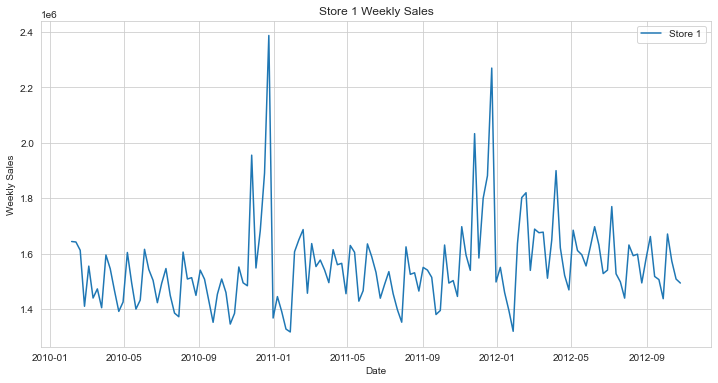

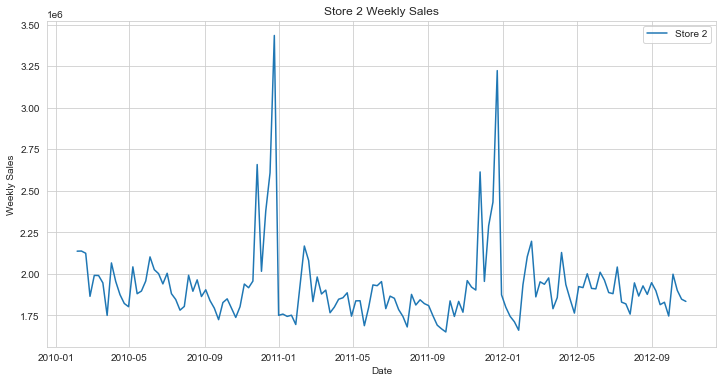

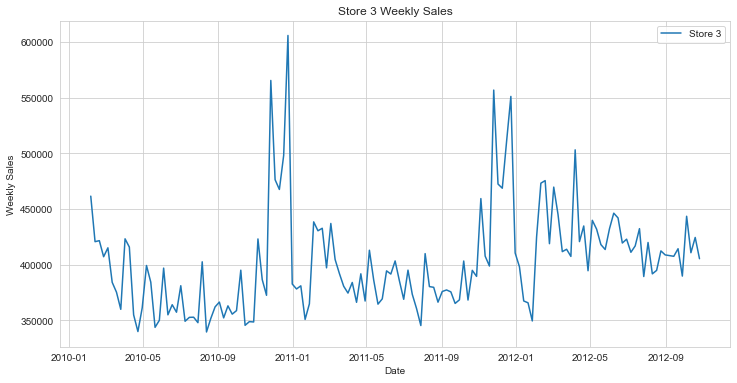

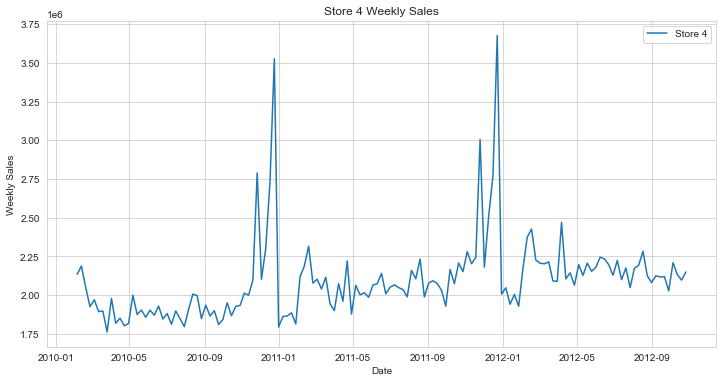

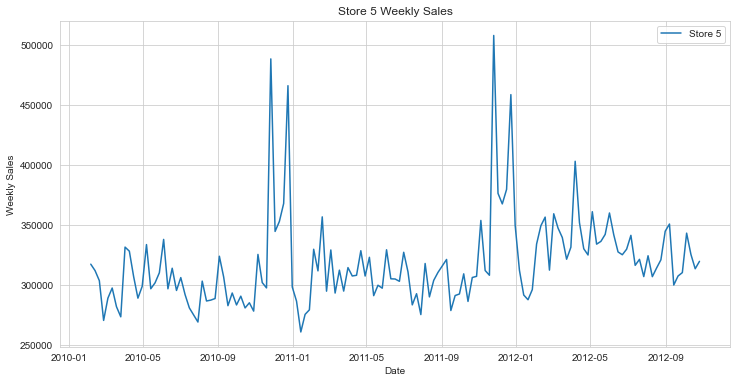

...

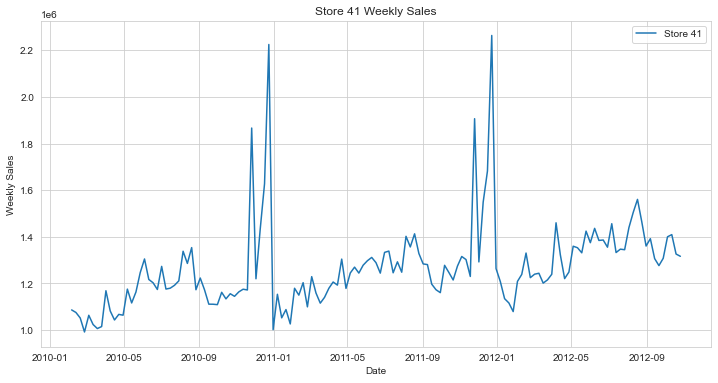

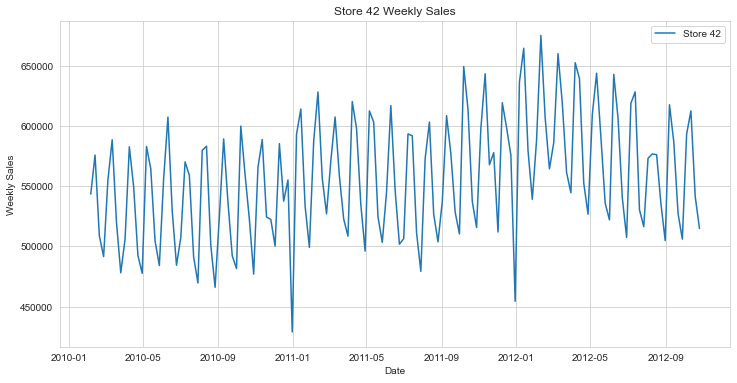

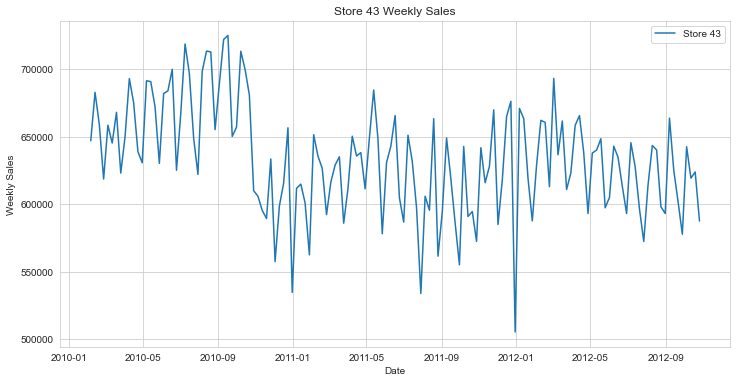

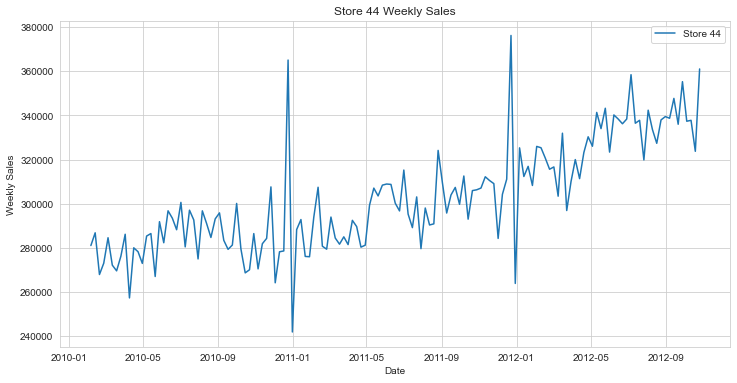

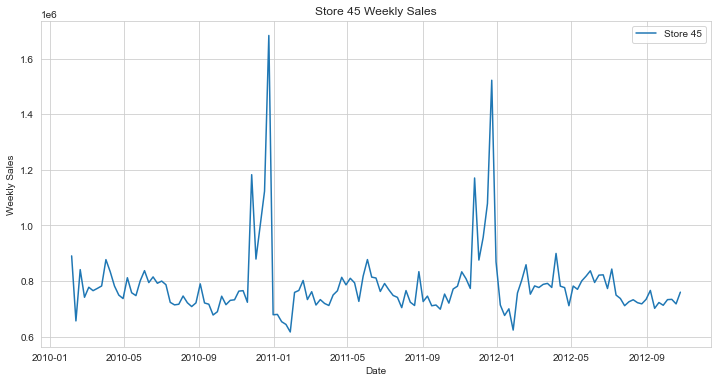

In [127]:
# Plot line plot for each store
for store, data in grouped_by_store:
    # Sort the data by 'Date' if not already sorted
    data = data.sort_values(by='Date')

    # Create a new figure for each store
    plt.figure(figsize=(12, 6))

    # Plot the line plot for weekly sales
    plt.plot(data['Date'], data['Weekly_Sales'], label=f'Store {store}')
    plt.xlabel('Date')
    plt.ylabel('Weekly Sales')
    plt.title(f'Store {store} Weekly Sales')
    plt.legend()
    plt.grid(True)

    # Show the plot for the current store
    plt.show()

In [153]:
# Create a MinMaxScaler object
scaler = MinMaxScaler()

# Scale the 'Weekly_Sales' column
df['Scaled_Weekly_Sales'] = scaler.fit_transform(df[['Weekly_Sales']].values)

- <b>Check Stationarity of each series with ADF test :

In [131]:
# Function to perform ADF test and print results
def adf_test(data):
    result = adfuller(data)
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'   {key}: {value}')
    
    # Interpretation of p-value
    if result[1] < 0.05:
        print("Result: Reject the null hypothesis. The data is stationary.")
    else:
        print("Result: Fail to reject the null hypothesis. The data is not stationary.")

# Perform ADF test for each store
for store, data in grouped_by_store:
    # Sort the data by 'Date' if not already sorted
    data = data.sort_values(by='Date')
    
    # Perform ADF test on the 'Scaled_Weekly_Sales' column
    print(f'ADF Test Results for Store {store}:')
    adf_test(data['Scaled_Weekly_Sales'])
    print()

ADF Test Results for Store 1:
ADF Statistic: -5.102186145192276
p-value: 1.3877788330760183e-05
Critical Values:
   1%: -3.47864788917503
   5%: -2.882721765644168
   10%: -2.578065326612056
Result: Reject the null hypothesis. The data is stationary.

ADF Test Results for Store 2:
ADF Statistic: -3.7088625726189175
p-value: 0.003990207089066248
Critical Values:
   1%: -3.4793722137854926
   5%: -2.8830370378332995
   10%: -2.578233635380623
Result: Reject the null hypothesis. The data is stationary.

ADF Test Results for Store 3:
ADF Statistic: -2.963867745511265
p-value: 0.03840926179831842
Critical Values:
   1%: -3.4793722137854926
   5%: -2.8830370378332995
   10%: -2.578233635380623
Result: Reject the null hypothesis. The data is stationary.

ADF Test Results for Store 4:
ADF Statistic: -2.8793819840147257
p-value: 0.04779866223669671
Critical Values:
   1%: -3.4793722137854926
   5%: -2.8830370378332995
   10%: -2.578233635380623
Result: Reject the null hypothesis. The data is st

- <b>Differencing the Non-stationary series :

ADF Test Results after Differencing for Store 14:
ADF Statistic: -7.278370619751883
p-value: 1.5231906987871954e-10
Critical Values:
   1%: -3.479007355368944
   5%: -2.8828782366015093
   10%: -2.5781488587564603
Result: Reject the null hypothesis. The data is stationary.


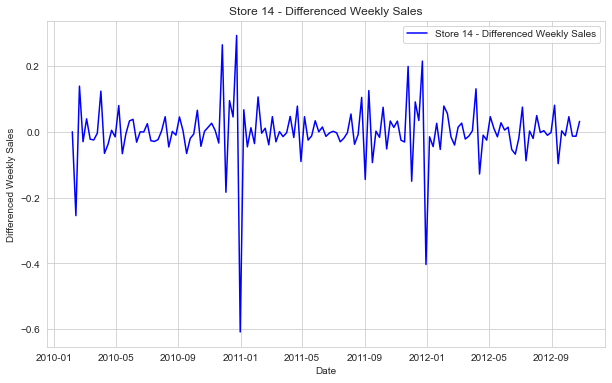


ADF Test Results after Differencing for Store 30:
ADF Statistic: -7.178363898303882
p-value: 2.6900235170971944e-10
Critical Values:
   1%: -3.479007355368944
   5%: -2.8828782366015093
   10%: -2.5781488587564603
Result: Reject the null hypothesis. The data is stationary.


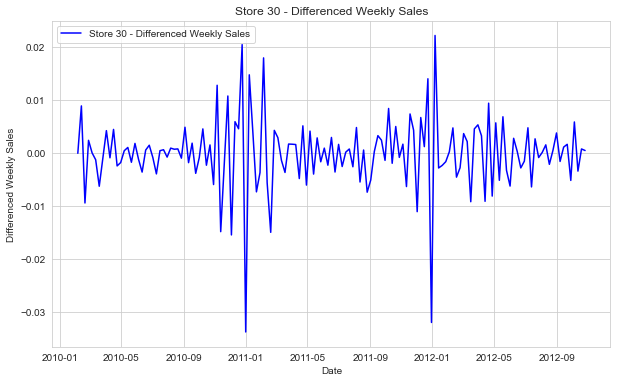


ADF Test Results after Differencing for Store 36:
ADF Statistic: -6.598384974693703
p-value: 6.833456332863927e-09
Critical Values:
   1%: -3.479742586699182
   5%: -2.88319822181578
   10%: -2.578319684499314
Result: Reject the null hypothesis. The data is stationary.


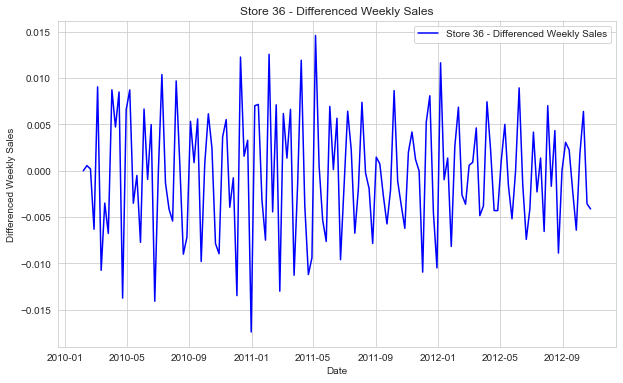


ADF Test Results after Differencing for Store 38:
ADF Statistic: -4.725227530814994
p-value: 7.54340102973524e-05
Critical Values:
   1%: -3.481281802271349
   5%: -2.883867891664528
   10%: -2.5786771965503177
Result: Reject the null hypothesis. The data is stationary.


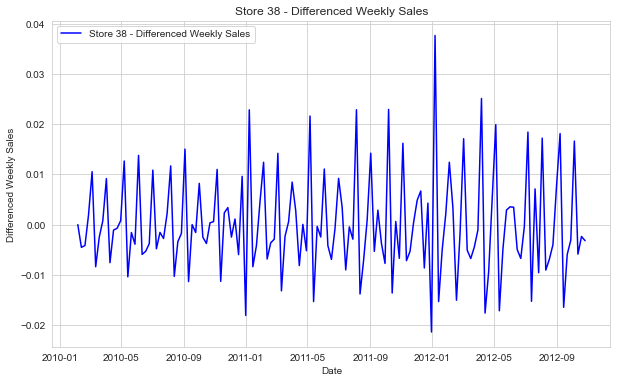


ADF Test Results after Differencing for Store 42:
ADF Statistic: -4.042023055911221
p-value: 0.0012057660922033448
Critical Values:
   1%: -3.481281802271349
   5%: -2.883867891664528
   10%: -2.5786771965503177
Result: Reject the null hypothesis. The data is stationary.


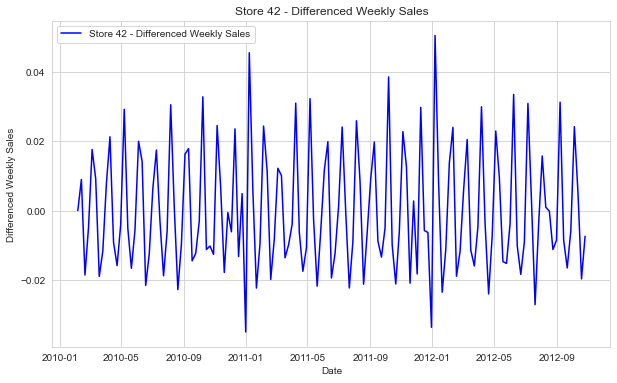


ADF Test Results after Differencing for Store 43:
ADF Statistic: -3.8158118869139916
p-value: 0.0027496191314978777
Critical Values:
   1%: -3.4816817173418295
   5%: -2.8840418343195267
   10%: -2.578770059171598
Result: Reject the null hypothesis. The data is stationary.


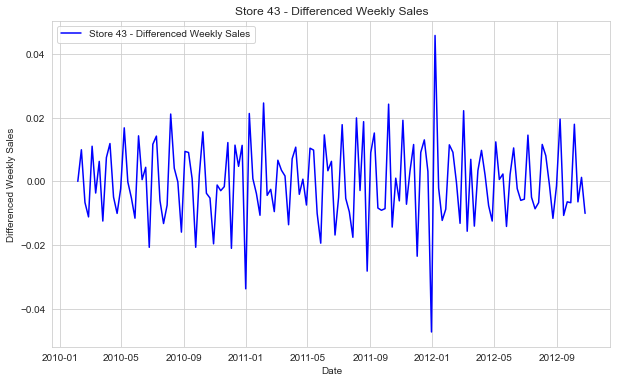


ADF Test Results after Differencing for Store 44:
ADF Statistic: -10.347219107253613
p-value: 2.5920886914241935e-18
Critical Values:
   1%: -3.4782936965183815
   5%: -2.882567574015525
   10%: -2.5779830117488745
Result: Reject the null hypothesis. The data is stationary.


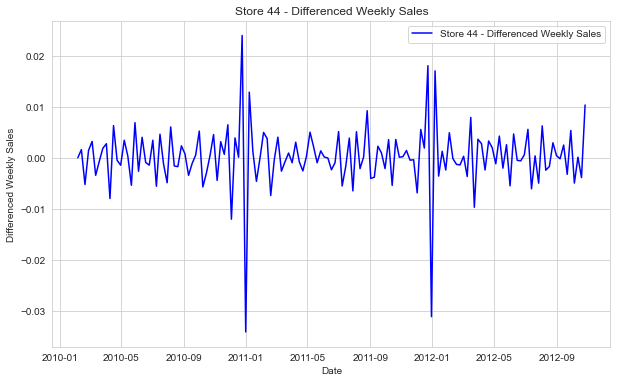

In [132]:
# List of store numbers with non-stationary data
stores_to_detrend = [14, 30, 36, 38, 42, 43, 44]

# Function to perform ADF test and print results
def adf_test(data):
    result = adfuller(data)
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'   {key}: {value}')
    
    # Interpretation of p-value
    if result[1] < 0.05:
        print("Result: Reject the null hypothesis. The data is stationary.")
    else:
        print("Result: Fail to reject the null hypothesis. The data is not stationary.")

# Create a new column for Combined Weekly Sales in the original DataFrame
df['Stationary_Weekly_Sales'] = df['Scaled_Weekly_Sales']

# Iterate through specified stores for differencing and combining
for store_num in stores_to_detrend:
    # Filter data for the store
    store_data = df[df['Store'] == store_num].copy()
    store_data = store_data.sort_values(by='Date')
    
    # Apply differencing to 'Scaled_Weekly_Sales'
    store_data['Differenced_Weekly_Sales'] = store_data['Scaled_Weekly_Sales'].diff()
    
    # Fill NaN values with 0 after differencing
    store_data['Differenced_Weekly_Sales'].fillna(0, inplace=True)
    
    # Perform ADF test on the differenced data
    print(f'ADF Test Results after Differencing for Store {store_num}:')
    adf_test(store_data['Differenced_Weekly_Sales'])
    
    # Update the Combined_Weekly_Sales column in the original DataFrame
    df.loc[df['Store'] == store_num, 'Stationary_Weekly_Sales'] = store_data['Differenced_Weekly_Sales']
    
    # Plot line plot of weekly sales after differencing
    plt.figure(figsize=(10, 6))
    plt.plot(store_data['Date'], store_data['Differenced_Weekly_Sales'], label=f'Store {store_num} - Differenced Weekly Sales', color='blue')
    plt.xlabel('Date')
    plt.ylabel('Differenced Weekly Sales')
    plt.title(f'Store {store_num} - Differenced Weekly Sales')
    plt.legend()
    plt.show()
    print()

- <b>Seasonal Decomposition and find periodicity of seasonality using fourier transform :

Store 1:


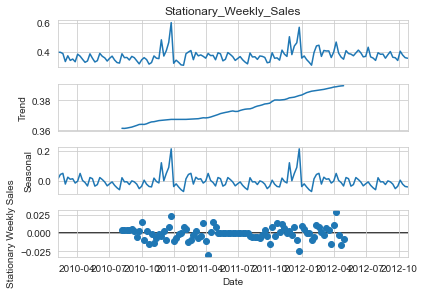

Dominant Period of Seasonality: 13.0

Store 2:


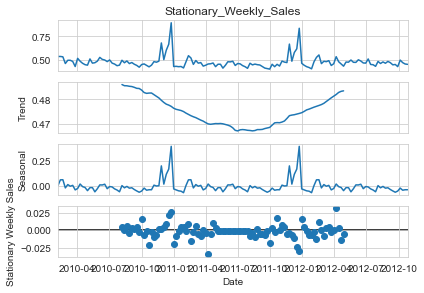

Dominant Period of Seasonality: 47.67

Store 3:


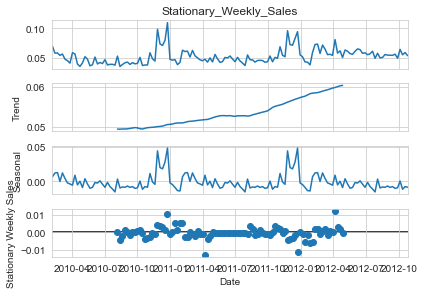

Dominant Period of Seasonality: 47.67

Store 4:


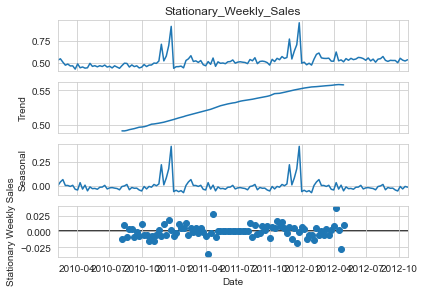

Dominant Period of Seasonality: 47.67

Store 5:


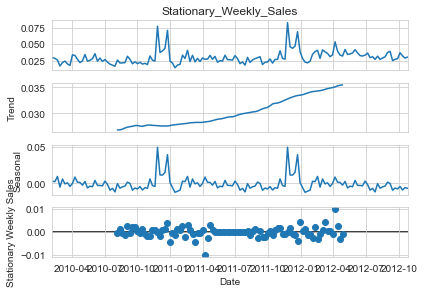

Dominant Period of Seasonality: 13.0

Store 6:


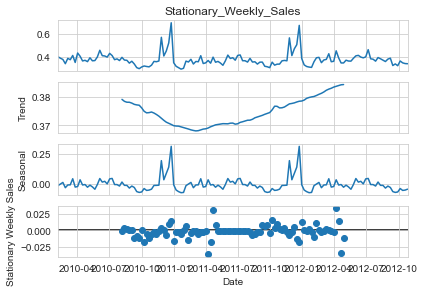

Dominant Period of Seasonality: 17.88

Store 7:


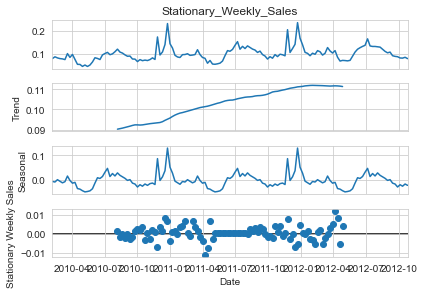

Dominant Period of Seasonality: 23.83

Store 8:


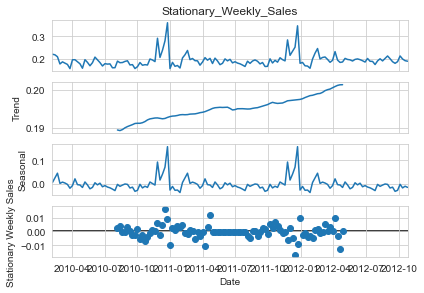

Dominant Period of Seasonality: 47.67

Store 9:


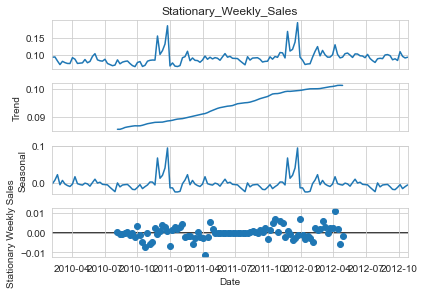

Dominant Period of Seasonality: 13.0

Store 10:


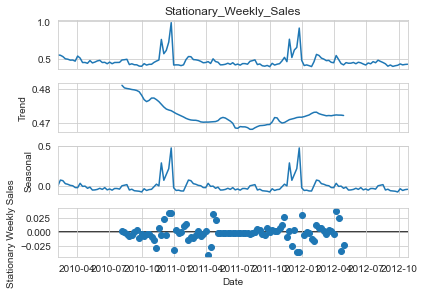

Dominant Period of Seasonality: 47.67

Store 11:


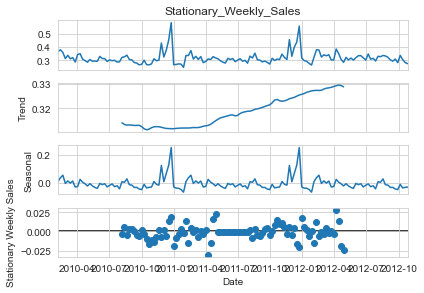

Dominant Period of Seasonality: 17.88

Store 12:


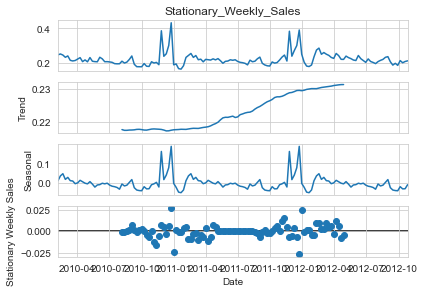

Dominant Period of Seasonality: 13.0

Store 13:


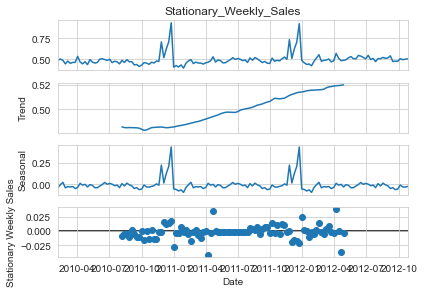

Dominant Period of Seasonality: 17.88

Store 14:


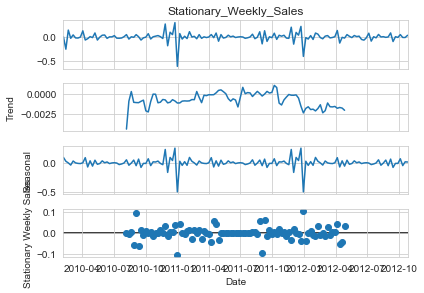

Dominant Period of Seasonality: 2.17

Store 15:


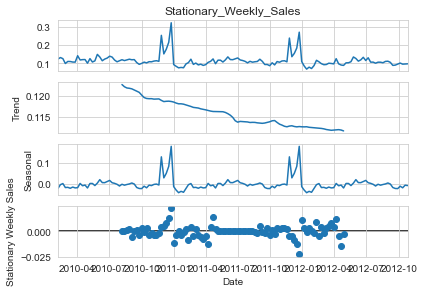

Dominant Period of Seasonality: 28.6

Store 16:


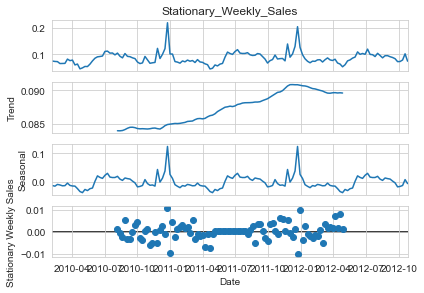

Dominant Period of Seasonality: 28.6

Store 17:


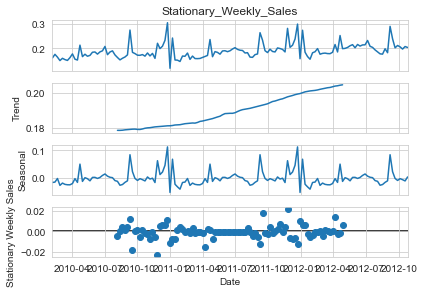

Dominant Period of Seasonality: 2.17

Store 18:


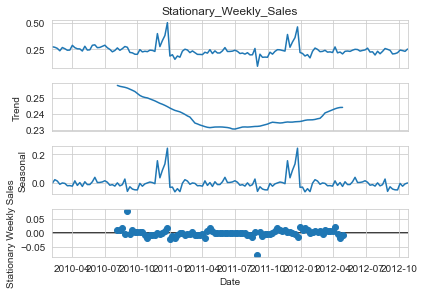

Dominant Period of Seasonality: 23.83

Store 19:


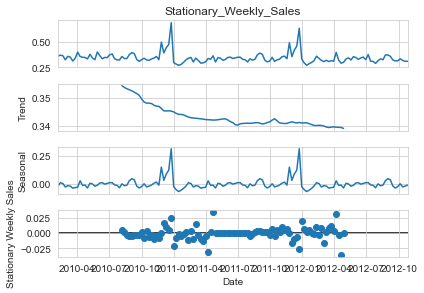

Dominant Period of Seasonality: 13.0

Store 20:


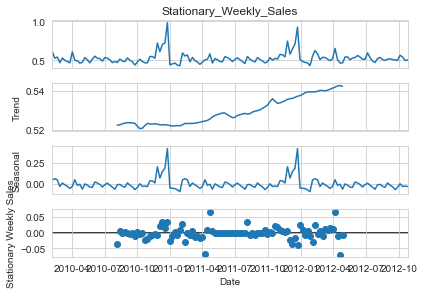

Dominant Period of Seasonality: 47.67

Store 21:


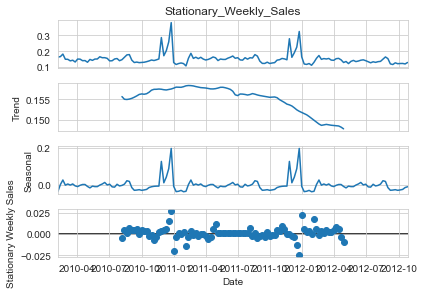

Dominant Period of Seasonality: 17.88

Store 22:


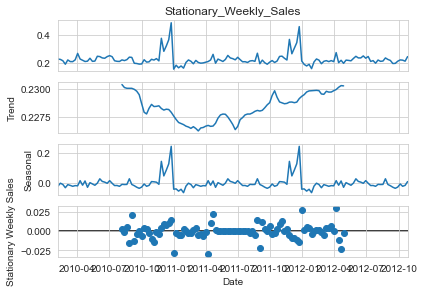

Dominant Period of Seasonality: 28.6

Store 23:


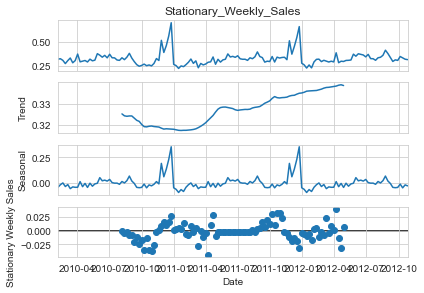

Dominant Period of Seasonality: 13.0

Store 24:


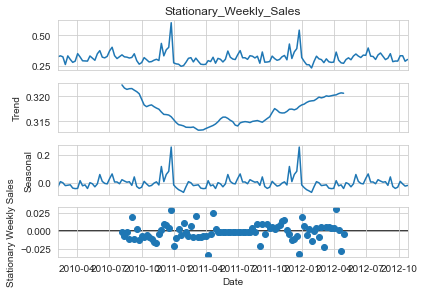

Dominant Period of Seasonality: 28.6

Store 25:


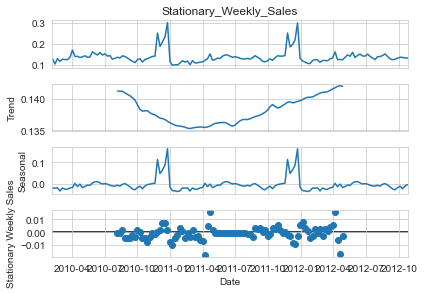

Dominant Period of Seasonality: 28.6

Store 26:


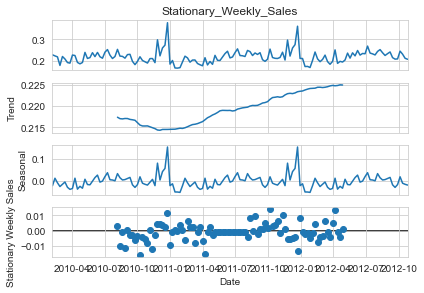

Dominant Period of Seasonality: 47.67

Store 27:


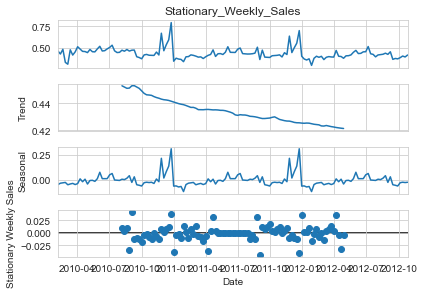

Dominant Period of Seasonality: 28.6

Store 28:


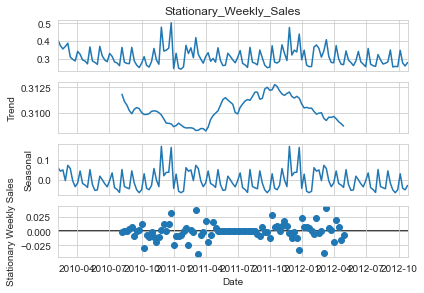

Dominant Period of Seasonality: 4.33

Store 29:


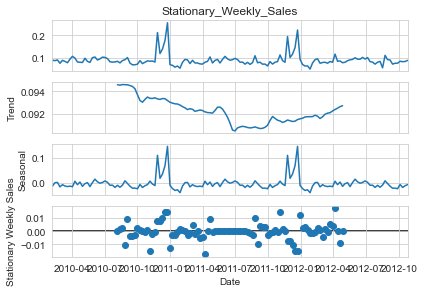

Dominant Period of Seasonality: 28.6

Store 30:


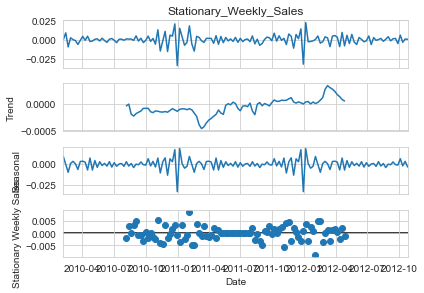

Dominant Period of Seasonality: 2.17

Store 31:


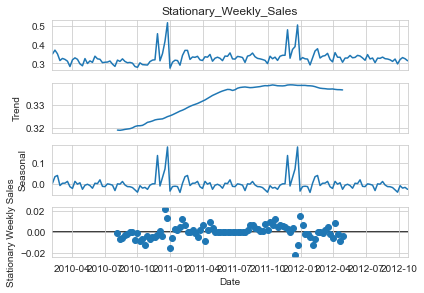

Dominant Period of Seasonality: 13.0

Store 32:


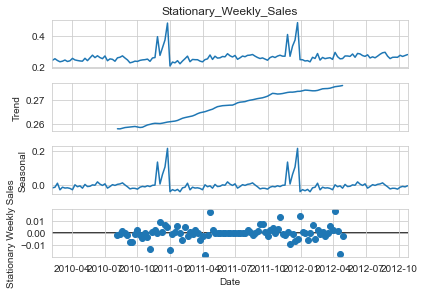

Dominant Period of Seasonality: 28.6

Store 33:


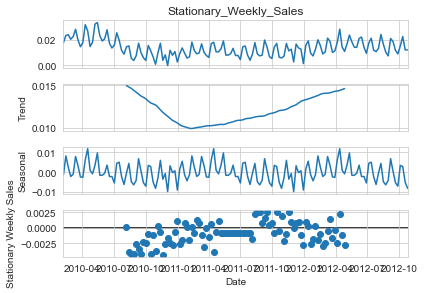

Dominant Period of Seasonality: 4.33

Store 34:


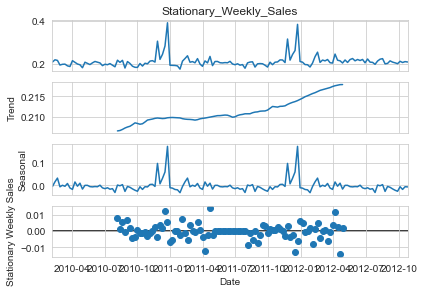

Dominant Period of Seasonality: 47.67

Store 35:


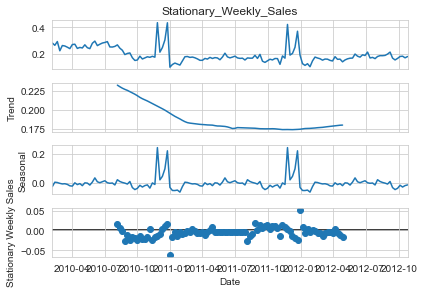

Dominant Period of Seasonality: 13.0

Store 36:


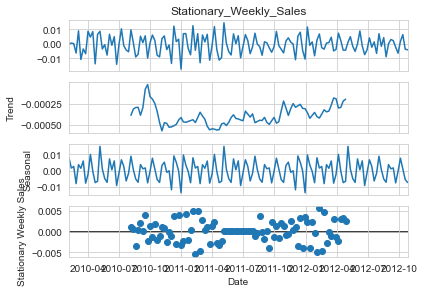

Dominant Period of Seasonality: 4.33

Store 37:


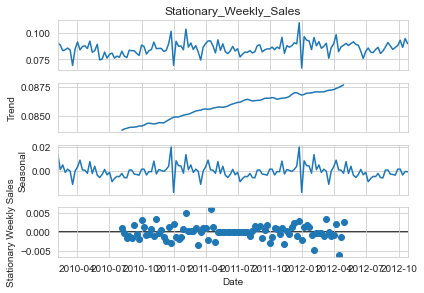

Dominant Period of Seasonality: 47.67

Store 38:


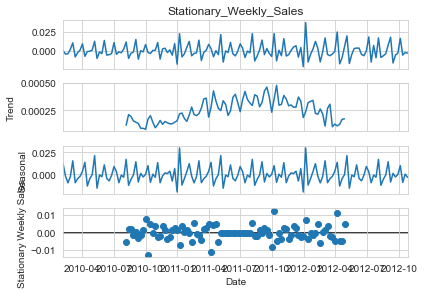

Dominant Period of Seasonality: 4.33

Store 39:


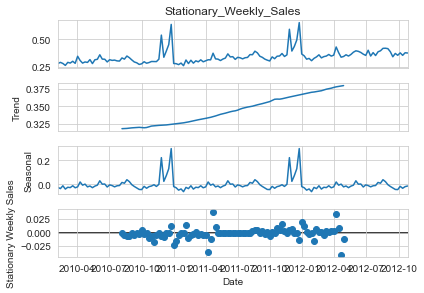

Dominant Period of Seasonality: 17.88

Store 40:


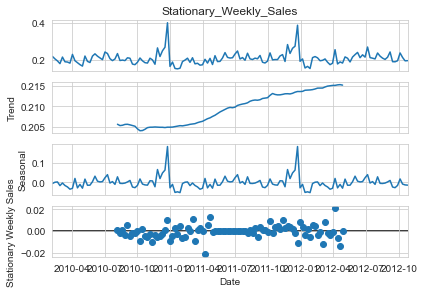

Dominant Period of Seasonality: 23.83

Store 41:


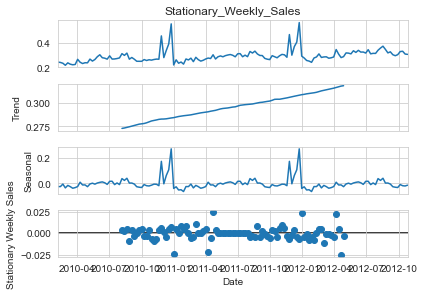

Dominant Period of Seasonality: 17.88

Store 42:


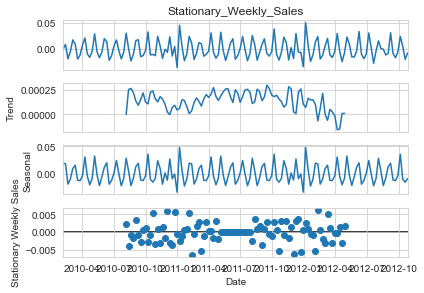

Dominant Period of Seasonality: 4.33

Store 43:


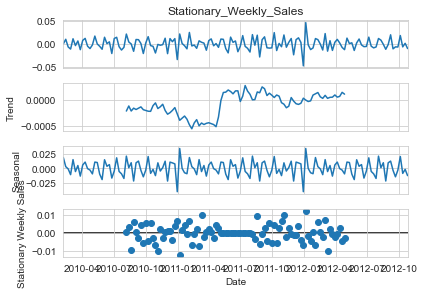

Dominant Period of Seasonality: 4.33

Store 44:


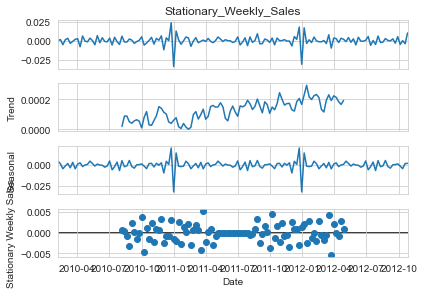

Dominant Period of Seasonality: 2.47

Store 45:


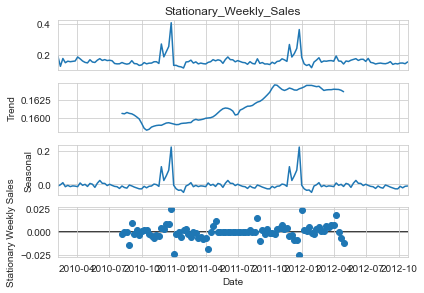

Dominant Period of Seasonality: 28.6



In [142]:
# Function to find seasonality and periodicity for each store
def find_seasonality(store_data):
    # Perform seasonal decomposition
    result = seasonal_decompose(store_data, model='additive', period=52)  # Assuming weekly data with annual seasonality
    
    # Plot the seasonal decomposition
    result.plot()
    
    plt.xlabel('Date')
    plt.ylabel('Stationary Weekly Sales')
    
    plt.show()

    # Get the periodogram of the seasonal component
    seasonal_freq = pd.Series(result.seasonal).to_numpy()
    periodogram = np.abs(np.fft.fft(seasonal_freq))**2
    frequencies = np.fft.fftfreq(len(periodogram))

    # Find the dominant frequency (period)
    dominant_frequency = frequencies[periodogram[1:].argmax() + 1]
    periodicity = 1 / np.abs(dominant_frequency)  # Take absolute value before calculating period

    print("Dominant Period of Seasonality:", round(periodicity, 2))
    print()

# Iterate through each store
unique_stores = df['Store'].unique()
for store_num in unique_stores:
    # Filter data for the store
    store_data = df[df['Store'] == store_num]['Stationary_Weekly_Sales']
    
    print(f"Store {store_num}:")
    find_seasonality(store_data)

- <b>Split into train-test, build SARIMAX model, predict test values and calculate RMSE :

Store 1 - Period of Seasonality: 13.0


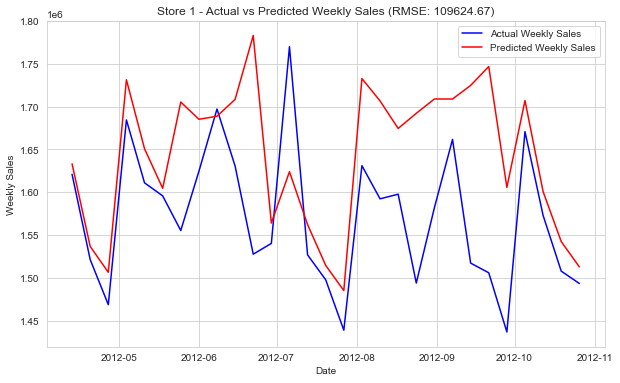

Actual Weekly Sales:
[1621031.7  1521577.87 1468928.37 1684519.99 1611096.05 1595901.87
 1555444.55 1624477.58 1697230.96 1630607.   1527845.81 1540421.49
 1769854.16 1527014.04 1497954.76 1439123.71 1631135.79 1592409.97
 1597868.05 1494122.38 1582083.4  1661767.33 1517428.87 1506126.06
 1437059.26 1670785.97 1573072.81 1508068.77 1493659.74]

Predicted Weekly Sales:
[1633239.39557984 1536888.09001733 1506714.83937644 1731357.88303009
 1650885.13020255 1604721.15912166 1705398.28746    1685261.09798356
 1688794.39967497 1708527.20674804 1783057.76664907 1564165.25468093
 1624067.28306003 1562393.49835536 1514754.62282038 1485362.54711467
 1732781.89509768 1706687.71664272 1674534.25878593 1692241.64739641
 1708958.49646195 1708895.98895759 1724776.53287766 1746834.2763944
 1605785.83209982 1707104.80290334 1600835.79422667 1542587.90096765
 1513025.69433558]
Store 2 - Period of Seasonality: 47.67


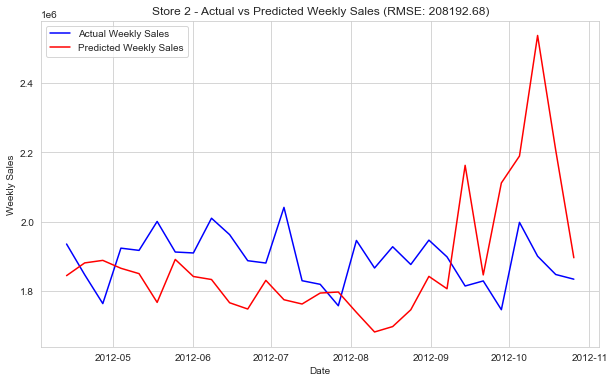

Actual Weekly Sales:
[1935869.1  1847344.45 1764133.09 1923957.09 1917520.99 2000940.67
 1912791.09 1910092.37 2010216.49 1962924.3  1887733.21 1881046.12
 2041507.4  1830075.13 1819666.46 1757923.88 1946104.64 1866719.96
 1928016.01 1876788.15 1947083.3  1898777.07 1814806.63 1829415.67
 1746470.56 1998321.04 1900745.13 1847990.41 1834458.35]

Predicted Weekly Sales:
[1844701.63965245 1881379.89655967 1888711.40840372 1865892.3113626
 1850457.51139989 1767542.90687885 1891444.58755115 1842218.27688707
 1833527.59271883 1766507.32311707 1748445.64589633 1831034.2460213
 1775213.96944537 1762873.20004335 1794501.03389251 1797445.81612156
 1738735.43103124 1682240.76585099 1697814.54708187 1746232.45905733
 1842559.59959012 1806834.40905568 2162729.46119506 1846802.89660164
 2111972.35430651 2189595.33229073 2537232.3998766  2206243.27966183
 1896260.83862873]
Store 3 - Period of Seasonality: 47.67


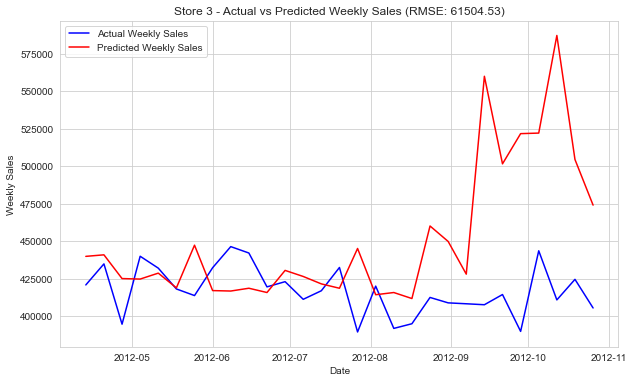

Actual Weekly Sales:
[420789.74 434822.13 394616.11 439913.57 431985.36 418112.76 413701.29
 432268.53 446336.8  442074.79 419497.95 422965.33 411206.5  416913.1
 432424.85 389427.9  419990.29 391811.6  394918.83 412449.67 408838.73
 408229.73 407589.16 414392.09 389813.02 443557.65 410804.39 424513.08
 405432.7 ]

Predicted Weekly Sales:
[439838.20054179 440864.10631064 425036.09099131 424704.8075071
 428657.27605091 418831.67671099 447296.75135389 417023.06546931
 416723.94340345 418589.59690565 415737.27477808 430478.39129604
 426436.94408053 421489.19539946 418582.24550205 445095.69829686
 414265.63768056 415729.46915238 411723.40980469 460092.99460073
 449785.30097794 427992.01780702 559910.17647679 501521.3300101
 521662.77345159 522029.26912996 587116.75070302 504409.53253084
 473997.10333834]
Store 4 - Period of Seasonality: 47.67


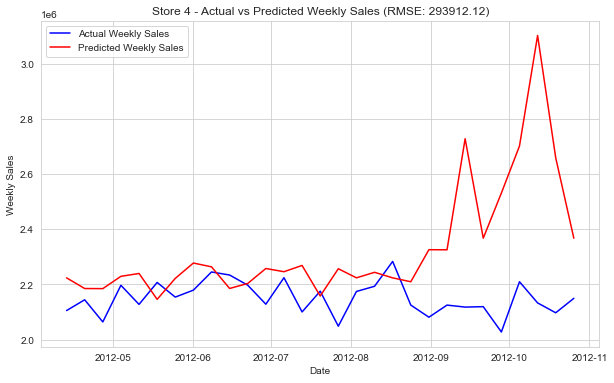

Actual Weekly Sales:
[2105301.39 2144336.89 2064065.66 2196968.33 2127661.17 2207214.81
 2154137.67 2179360.94 2245257.18 2234190.93 2197299.65 2128362.92
 2224499.28 2100252.61 2175563.69 2048613.65 2174514.13 2193367.69
 2283540.3  2125241.68 2081181.35 2125104.72 2117854.6  2119438.53
 2027620.23 2209835.43 2133026.07 2097266.85 2149594.46]

Predicted Weekly Sales:
[2223981.27205314 2185189.14868121 2184822.22161624 2229416.78674346
 2239774.87996654 2146004.77751693 2221927.41588932 2277689.45147153
 2263876.13726214 2185409.43109925 2203561.2832322  2257854.2008643
 2246212.34031652 2268896.29569036 2158024.98437736 2257005.77128773
 2223984.37197541 2244002.4419047  2223923.51063229 2209741.50520654
 2325999.85222186 2325653.80193361 2728510.82252193 2367808.69176809
 2531362.63516933 2702177.61004895 3103030.39784635 2659379.41664178
 2367561.72349758]
Store 5 - Period of Seasonality: 13.0


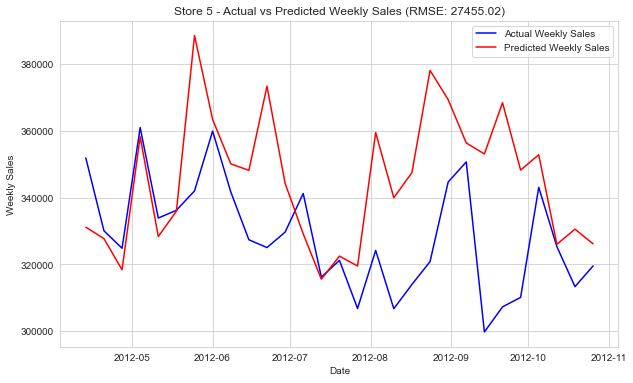

Actual Weekly Sales:
[351832.03 330063.06 324839.74 360932.69 333870.52 336189.66 341994.48
 359867.8  341704.59 327383.64 325041.68 329658.1  341214.43 316203.64
 321205.12 306827.36 324195.17 306759.7  314014.18 320831.36 344642.01
 350648.91 299800.67 307306.76 310141.68 343048.29 325345.41 313358.15
 319550.77]

Predicted Weekly Sales:
[331132.22673729 327717.68554118 318404.6472703  358214.94780873
 328341.10330533 335927.27633491 388471.96371605 363349.68974276
 350078.69640991 348135.63017004 373306.57295671 344274.36483559
 329138.04758605 315597.87432799 322479.37586702 319525.59252127
 359436.9674849  339940.79134013 347462.32093009 378029.87722958
 369292.4160361  356330.79943439 353033.63797314 368374.7768851
 348215.26560658 352801.36333668 326011.93324963 330554.09000661
 326155.43212477]
Store 6 - Period of Seasonality: 17.88


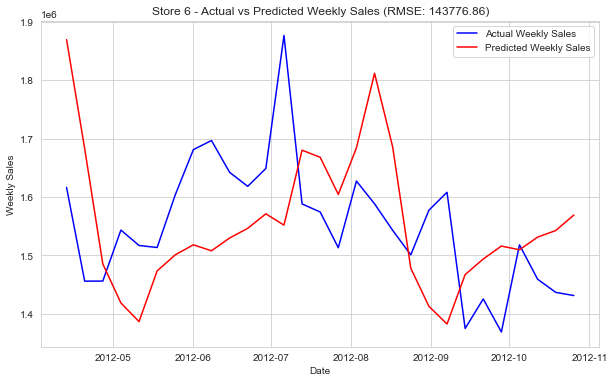

Actual Weekly Sales:
[1616394.45 1456073.24 1456221.1  1543461.12 1517075.67 1513635.64
 1603793.42 1681121.38 1696619.52 1642247.48 1618272.25 1648863.46
 1876359.39 1588142.26 1574361.97 1513229.16 1627274.93 1588380.73
 1543049.52 1501095.49 1577439.81 1608077.01 1375166.86 1425603.65
 1369131.46 1518177.71 1459396.84 1436883.99 1431426.34]

Predicted Weekly Sales:
[1869169.75637431 1682809.39478007 1485606.00728536 1418764.23458275
 1386862.14918621 1473596.08474902 1501056.77963235 1518275.69236983
 1507997.75710483 1529873.58765242 1546472.74432622 1571261.11614456
 1551901.82831077 1680124.24690547 1667976.26742069 1604449.41702655
 1684106.8173706  1811702.41101786 1685683.10749698 1478206.93165995
 1413027.67454035 1382751.31722141 1467286.42939818 1493968.20267225
 1516073.87119849 1509763.00985224 1531371.14667296 1542621.30054644
 1569170.96806445]
Store 7 - Period of Seasonality: 23.83


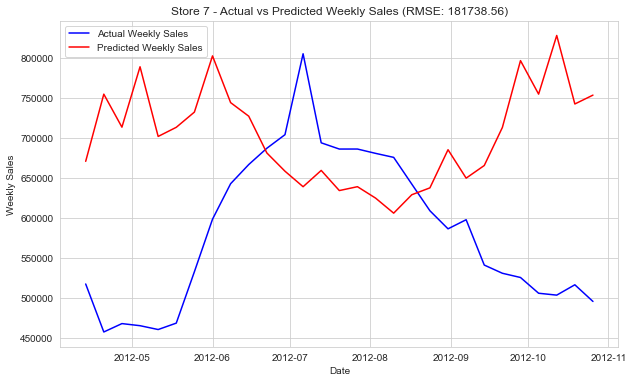

Actual Weekly Sales:
[517420.23 457340.06 467827.75 465198.89 460397.41 468428.3  532739.77
 598495.02 642963.75 666942.02 687344.68 704335.41 805642.61 694150.89
 686345.69 686365.4  680954.81 675926.3  642450.4  609099.37 586467.16
 597876.55 541120.2  530842.25 525545.76 505830.56 503463.93 516424.83
 495543.28]

Predicted Weekly Sales:
[670967.43416856 755065.42553362 713745.61086013 789357.31912014
 702125.48661339 713567.44501046 732597.75817826 802968.78615898
 744463.6375334  727476.39507442 681443.63702695 658611.67155579
 639193.65580194 659599.20084445 634371.11393181 639224.68660567
 624952.70662002 606094.198433   629141.9665254  637755.58286875
 685528.69872598 649926.73411941 665746.81124817 713372.22574948
 797041.74641045 755104.88774774 828546.01865839 742773.4528148
 753867.30933779]
Store 8 - Period of Seasonality: 47.67


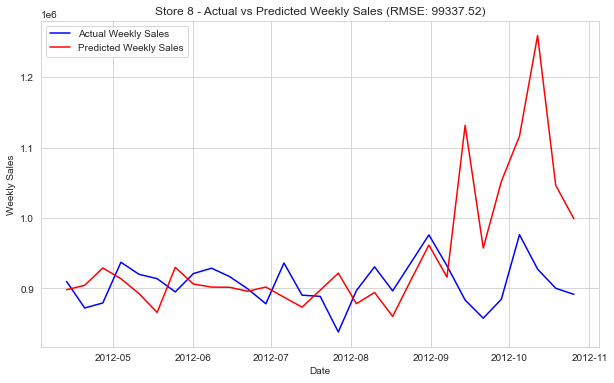

Actual Weekly Sales:
[909989.45 872288.46 879448.25 937232.09 920128.89 913922.01 895157.44
 921161.2  928820.   916918.7  899449.65 878298.22 936205.5  890488.01
 888834.07 838227.52 897076.73 930745.69 896613.19 936373.65 976137.73
 932160.37 883569.38 857796.45 884724.41 976436.02 927511.99 900309.75
 891671.44]

Predicted Weekly Sales:
[ 898179.59246894  904528.66751924  929112.8463704   913904.64327151
  892690.34296186  865978.80579869  930015.43124322  906339.65171006
  901969.51744557  901731.66760555  896040.69931493  902070.1625726
  887666.68373948  873442.88284395  897609.26327926  921765.70145664
  878335.45455963  894343.400521    860334.24751398  911623.78369987
  961703.6369925   916099.70856541 1131695.93104918  957469.63271873
 1052122.47177671 1116346.56261196 1259396.22244521 1046589.01007905
  999138.91694689]
Store 9 - Period of Seasonality: 13.0


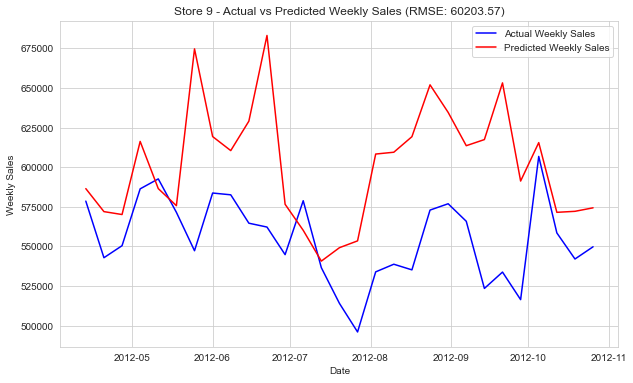

Actual Weekly Sales:
[578539.86 542819.03 550414.99 586289.08 592572.3  571463.93 547226.
 583648.59 582525.42 564606.1  562173.12 544770.7  578790.36 536537.64
 513991.57 495951.   533887.54 538713.47 535153.47 572887.78 576879.15
 565812.29 523427.35 533756.88 516361.06 606755.3  558464.8  542009.46
 549731.49]

Predicted Weekly Sales:
[586426.53853574 571918.46555086 570078.55286251 616219.90663581
 586426.89632986 575667.11626902 674636.65952013 619288.03690127
 610431.16196812 629013.13224545 683100.00540804 576552.91266311
 560119.25041115 540682.54943984 549153.34739821 553455.21820145
 608256.42981443 609401.48671722 619213.19431759 651941.51558456
 634544.72315111 613522.03908357 617385.91389005 653172.01307301
 591207.33188685 615466.32650467 571470.08675091 572105.15946536
 574312.70077898]
Store 10 - Period of Seasonality: 47.67


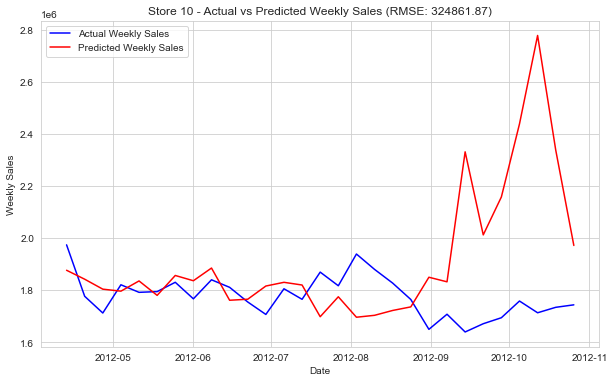

Actual Weekly Sales:
[1974687.51 1777166.53 1712987.56 1821364.42 1792345.3  1795152.73
 1830939.1  1767471.48 1840491.41 1811562.88 1755334.18 1707481.9
 1805999.79 1765571.91 1869967.03 1817603.66 1939440.09 1880436.94
 1827797.4  1764984.15 1650285.54 1708283.28 1640168.99 1671857.57
 1694862.41 1758971.38 1713889.11 1734834.82 1744349.05]

Predicted Weekly Sales:
[1877118.07442455 1842737.8024463  1804517.76923655 1796845.78784387
 1836077.52514029 1780679.42221049 1857071.53246279 1836857.49416648
 1885586.93601402 1761947.48906978 1765876.83066838 1816526.47071775
 1830809.67584193 1820444.81518521 1698771.84998537 1775301.51305824
 1696775.85973719 1704124.79740888 1722774.9242417  1736463.81197667
 1850290.08600841 1832734.05161009 2331716.08951734 2012856.78100466
 2158458.68563564 2438805.23705921 2778457.53256696 2338743.7744323
 1972280.91499589]
Store 11 - Period of Seasonality: 17.88


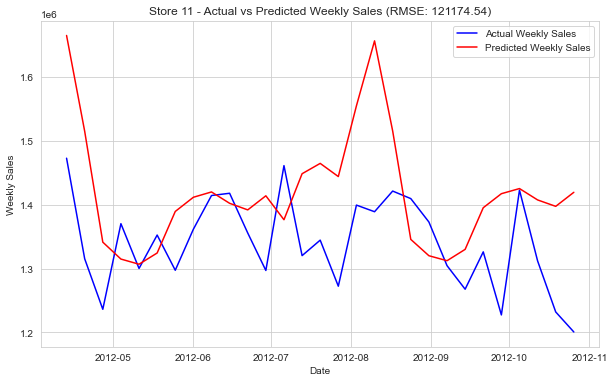

Actual Weekly Sales:
[1472752.01 1315356.99 1236238.29 1370251.22 1300147.07 1352442.31
 1297335.87 1361595.33 1414343.53 1417875.42 1355680.3  1297028.6
 1461129.94 1320239.51 1344483.81 1272395.02 1399341.07 1388973.65
 1421307.2  1409515.73 1372872.35 1304584.4  1267675.05 1326132.98
 1227430.73 1422794.26 1311965.09 1232073.18 1200729.45]

Predicted Weekly Sales:
[1664893.38746952 1514933.0066204  1341334.77722227 1314866.88261943
 1306796.80048011 1324361.24860091 1389384.23098098 1411611.16786091
 1419932.03588481 1402156.9362647  1391837.26641867 1413896.4292902
 1376433.93080238 1448449.96314116 1464638.95073606 1444021.99760255
 1554777.38070517 1656436.58779566 1515371.2338724  1345653.63587578
 1320088.94369128 1312282.45693282 1330030.31358599 1395236.5959972
 1417186.4530256  1425229.64691368 1407435.74544627 1397381.83679685
 1419386.61395913]
Store 12 - Period of Seasonality: 13.0


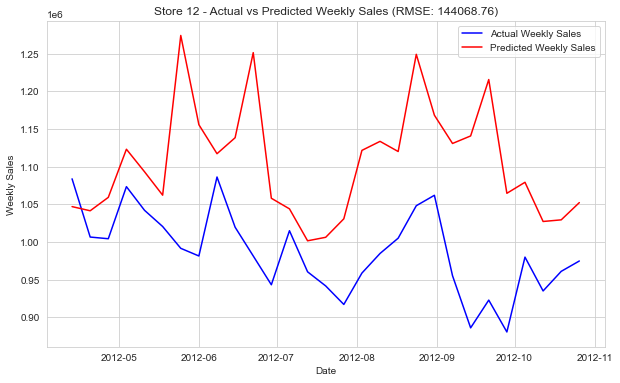

Actual Weekly Sales:
[1083811.19 1006486.96 1004252.38 1073433.69 1041995.22 1020486.05
  991514.21  981345.2  1086231.47 1019555.51  981386.25  943124.74
 1014898.78  960312.75  941550.34  916967.92  958667.23  984689.9
 1005003.12 1048101.39 1061943.49  955146.04  885892.37  922735.37
  880415.67  979825.92  934917.47  960945.43  974697.6 ]

Predicted Weekly Sales:
[1046928.40005657 1041387.81061926 1059191.81263904 1123125.31865284
 1093196.15107019 1062105.33582731 1274217.1251127  1155699.62616549
 1117182.19100636 1138405.76003426 1251412.66707257 1057997.92344173
 1043941.67852764 1001501.83394164 1006169.26462704 1030714.0737741
 1121605.97064061 1133575.17293385 1120095.91450256 1249168.5889881
 1168294.22081154 1130777.12911505 1140783.94966965 1215674.00111475
 1064598.9944423  1079222.2281769  1027161.29671503 1029335.87046583
 1052234.53556735]
Store 13 - Period of Seasonality: 17.88


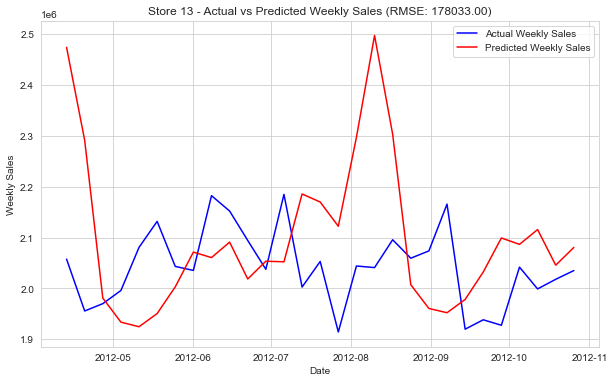

Actual Weekly Sales:
[2057637.86 1955689.12 1970121.65 1995994.51 2080764.17 2131900.55
 2043349.41 2035431.39 2182437.9  2152229.11 2094373.   2037663.71
 2184980.35 2002750.99 2053089.32 1914430.53 2044148.23 2041019.92
 2095769.18 2059458.25 2073855.42 2165796.31 1919917.03 1938379.66
 1927664.11 2041918.74 1999079.44 2018010.15 2035189.66]

Predicted Weekly Sales:
[2474098.59157764 2291230.36309086 1981057.47100879 1933733.26642865
 1924710.59346964 1950650.32563603 2003173.23398263 2071516.1892308
 2060669.14645987 2091096.61783894 2018628.97836216 2053585.90747873
 2052393.85051702 2185805.38747328 2169922.22826631 2122271.83943992
 2297157.70326032 2497418.32144941 2303043.4250997  2007334.94968045
 1960618.50128885 1952290.96415316 1978333.95729861 2032339.96787884
 2099252.248512   2086668.03342664 2115786.93635326 2045739.25886405
 2080638.97323602]
Store 14 - Period of Seasonality: 2.17


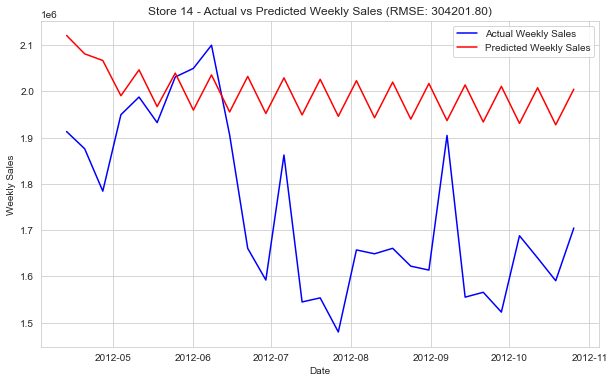

Actual Weekly Sales:
[1912909.69 1875686.44 1784029.95 1949354.29 1987531.05 1932233.17
 2030869.61 2049485.49 2099615.88 1905733.68 1660228.88 1591835.02
 1862128.95 1544422.35 1553250.16 1479514.66 1656886.46 1648570.03
 1660433.3  1621841.33 1613342.19 1904512.34 1554794.22 1565352.46
 1522512.2  1687592.16 1639585.61 1590274.72 1704357.62]

Predicted Weekly Sales:
[2120660.42898484 2080922.75978186 2066509.64416551 1990329.26622037
 2046365.57129858 1966848.25395806 2039246.67822842 1959286.72652421
 2035292.91352476 1955254.36758479 2032045.04714813 1951990.5557745
 2028951.1573786  1948893.28210215 2025890.64856698 1945832.04542407
 2022837.36396792 1942778.60365369 2019785.6420453  1939726.84775475
 2016734.25809967 1936675.45646201 2013682.94724908 1933624.14402254
 2010631.65220676 1930572.84863659 2007580.36058328 1927521.5569388
 2004529.06969919]
Store 15 - Period of Seasonality: 28.6


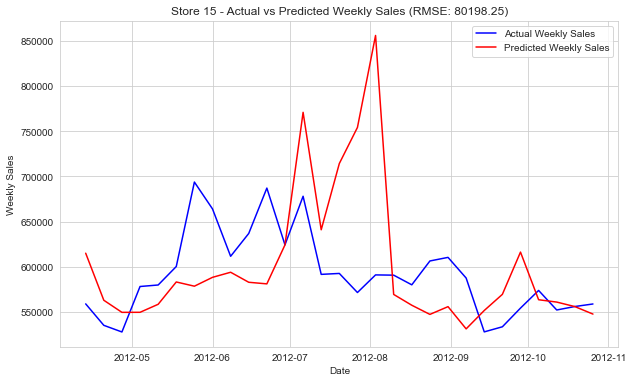

Actual Weekly Sales:
[558585.13 534780.57 527402.62 577868.38 579539.95 600050.98 693780.42
 663971.26 611390.67 636737.65 687085.6  624099.48 678024.75 591335.5
 592369.22 571190.83 590739.62 590453.63 579738.2  606210.77 610185.32
 587259.82 527509.76 533161.64 553901.97 573498.64 551799.63 555652.77
 558473.6 ]

Predicted Weekly Sales:
[614827.30229289 562608.05029501 549186.02546675 549237.01101884
 558120.42963586 582896.01394478 578218.0297203  588035.25961765
 593681.39196925 582563.17414267 580789.69031572 624061.63571511
 771160.45408943 640828.8550246  714348.43632892 754391.52641573
 856466.80576344 569071.35190492 557070.62797403 546911.26631416
 555506.58736509 530844.81177539 551257.74427528 569152.79558159
 616053.86885313 563170.51323879 560580.1933405  555571.39862482
 547257.75132312]
Store 16 - Period of Seasonality: 28.6


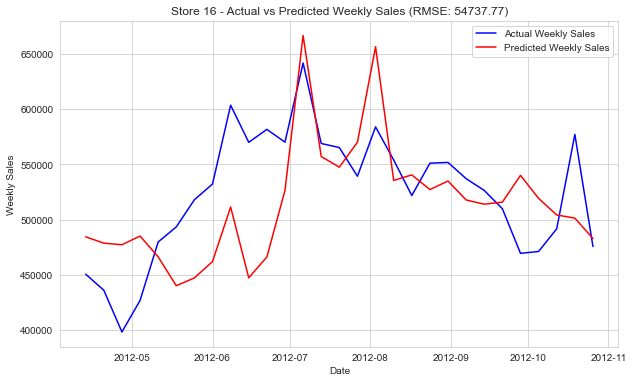

Actual Weekly Sales:
[450756.71 436221.26 398445.15 426959.62 479855.   493506.47 518045.09
 532311.93 603618.89 570045.79 581745.72 570162.28 641763.53 569005.06
 565297.54 539337.87 584000.71 554036.84 521896.6  551152.15 551837.31
 537138.58 526525.16 509942.56 469607.73 471281.68 491817.19 577198.97
 475770.14]

Predicted Weekly Sales:
[484530.51193517 478818.4731729  477365.57777434 485249.20277031
 466427.7671105  440273.24305639 447349.71405039 462144.84745171
 511515.43338146 447446.98780705 466266.39387782 526465.61818392
 666716.80239829 557182.20261147 547537.43426293 570157.90872443
 656539.64371014 535551.30673864 540553.56116188 527319.50511558
 535017.64287693 517872.1107867  514057.00599796 515906.52780912
 540141.07827179 519305.47230969 504297.62499335 501477.62793891
 482994.33705617]
Store 17 - Period of Seasonality: 2.17


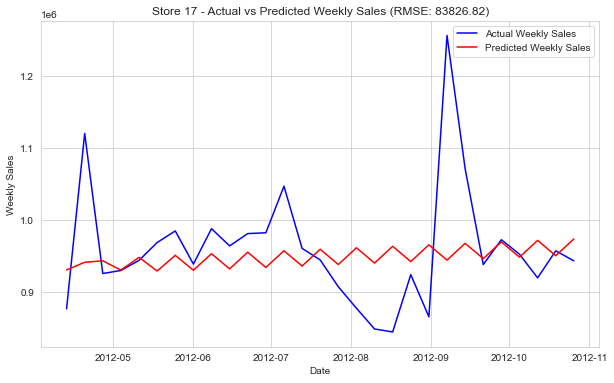

Actual Weekly Sales:
[ 877055.32 1119979.98  925916.65  930121.14  944100.3   968816.33
  984881.59  938914.28  987990.24  964169.67  981210.57  982322.24
 1046782.52  960746.04  944698.7   907493.24  877813.33  849074.04
  844928.17  924299.78  865924.2  1255633.29 1071040.22  938303.28
  972716.24  952609.17  919878.34  957356.84  943465.29]

Predicted Weekly Sales:
[930851.9300605  941451.99299975 943476.93375736 930682.20182127
 948310.909811   929330.80963522 951093.14912245 930474.73448989
 953331.96868678 932279.60661473 955426.85037288 934259.54674233
 957483.60660306 936285.85789853 959530.26437677 938324.45155216
 961574.24732808 940366.29852467 963617.52178746 942409.007218
 965660.60858549 944451.94415909 967703.64567684 946494.94155717
 969746.66960216 948537.95496876 971789.69004013 950580.97262192
 973832.7095544 ]
Store 18 - Period of Seasonality: 23.83


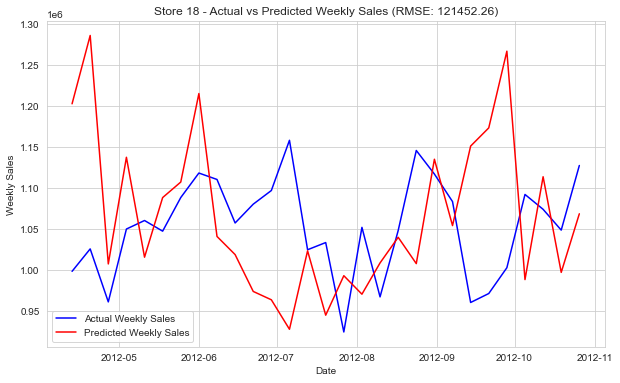

Actual Weekly Sales:
[ 998443.5  1025813.8   961186.23 1050027.89 1060433.1  1047444.59
 1088446.58 1118313.7  1110479.94 1057425.83 1080357.89 1097006.3
 1158247.31 1024784.92 1033543.56  924506.26 1052066.58  967304.07
 1048134.24 1145840.91 1117097.23 1083521.24  960476.1   971386.65
 1002856.2  1092204.79 1074079.   1048706.75 1127516.25]

Predicted Weekly Sales:
[1202749.9335414  1286078.66236184 1007474.09095026 1137541.2296686
 1015693.69025629 1088401.55863532 1107346.5678673  1215244.25395545
 1040993.46162769 1018873.2335651   973936.31971992  963757.944625
  927813.72327279 1023477.98456159  944977.97116167  993131.39631756
  970578.155915   1008709.41087768 1039966.07159866 1007871.28049983
 1135126.2959148  1054236.31087885 1151197.08066077 1173366.64296777
 1266901.04171706  988387.14250482 1113796.13969642  997177.00407633
 1068640.59161781]
Store 19 - Period of Seasonality: 13.0


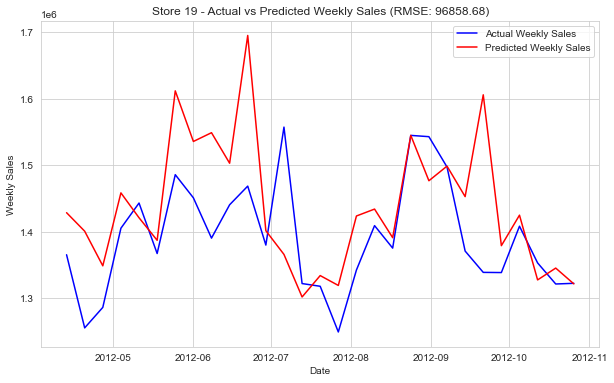

Actual Weekly Sales:
[1365098.46 1255087.26 1285897.24 1405007.44 1442873.22 1366937.1
 1485540.28 1450733.29 1390122.11 1440263.15 1468350.36 1379652.65
 1557120.44 1321741.35 1317672.92 1248915.43 1342123.78 1408907.89
 1375101.26 1544653.37 1542719.87 1497073.82 1370653.41 1338572.29
 1338299.02 1408016.1  1352809.5  1321102.35 1322117.96]

Predicted Weekly Sales:
[1428356.59222925 1400516.22108971 1348428.44935262 1458181.82797856
 1420735.25533778 1386811.18538117 1611643.75372301 1535515.41787897
 1548702.98803746 1502797.52055503 1694979.35119021 1401255.47512201
 1365582.14834364 1301578.40379266 1333759.27688169 1318917.7777095
 1423390.38327043 1433793.07579767 1390770.78486809 1544643.66444621
 1476429.30955512 1498435.47603881 1452527.1634873  1605695.50796812
 1378756.28037446 1424647.34074229 1327234.76754325 1345028.50005778
 1321259.01998449]
Store 20 - Period of Seasonality: 47.67


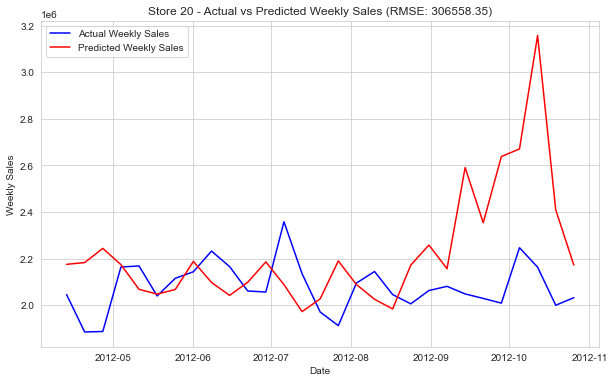

Actual Weekly Sales:
[2045396.06 1884427.84 1886503.93 2163510.89 2168097.11 2039222.26
 2114989.   2143126.59 2231962.13 2165160.29 2060588.69 2055952.61
 2358055.3  2134680.12 1970170.29 1911559.1  2094515.71 2144245.39
 2045061.22 2005341.43 2062481.56 2080529.06 2047949.98 2028587.24
 2008350.58 2246411.89 2162951.36 1999363.49 2031650.55]

Predicted Weekly Sales:
[2175083.9427876  2182573.70845647 2243702.88069259 2173783.38015726
 2067703.38538269 2047130.03023979 2066962.60646293 2187707.54565158
 2097254.76021308 2041626.44531214 2098003.56804209 2185613.22803062
 2087717.4503341  1971857.03005813 2026898.10667542 2189754.66566607
 2088249.35508673 2024953.21178382 1983417.49442525 2171684.98078237
 2258025.10579969 2156166.60811166 2590913.38305394 2353825.24856137
 2638223.46847508 2670748.37275869 3158402.56875714 2409229.68035176
 2171990.95446658]
Store 21 - Period of Seasonality: 17.88


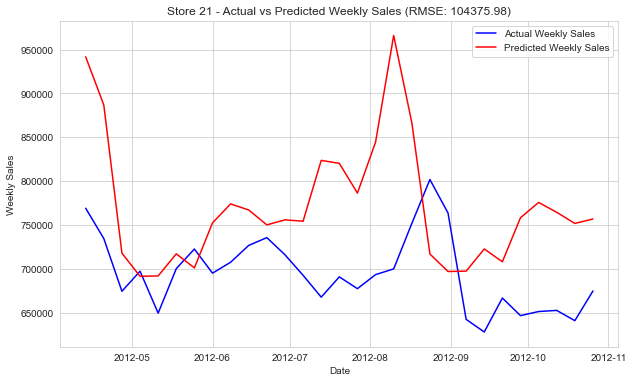

Actual Weekly Sales:
[769319.04 734858.91 674829.58 697645.32 649945.54 700554.16 722891.24
 695439.83 707895.72 727049.04 735870.   716341.39 693013.59 668132.36
 691200.33 677789.14 693785.85 700272.01 751963.81 802003.61 763867.59
 642827.29 628494.63 667151.46 647097.65 651768.91 653043.44 641368.14
 675202.87]

Predicted Weekly Sales:
[941635.60095264 886820.49954949 718223.4235854  691845.5664379
 692281.91710999 717415.58504602 701423.69144864 752697.96344345
 774243.08480778 767324.76321618 750379.64124931 756127.86186388
 754564.964448   823801.03272205 820412.52055447 786568.58180135
 844550.4264349  965980.41991802 866860.9114232  717229.43232101
 697324.71365168 697735.78701567 722993.40277484 708397.05106449
 758546.62115265 775928.32962379 764695.76653305 752043.63499143
 757090.17051577]
Store 22 - Period of Seasonality: 28.6


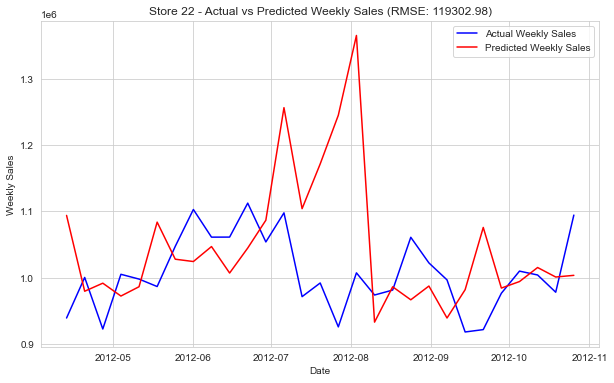

Actual Weekly Sales:
[ 939118.24 1000342.87  922539.94 1005083.31  997868.63  986612.02
 1047297.38 1102857.37 1061134.37 1061219.19 1112449.3  1053881.78
 1097786.14  971361.38  991969.37  925731.21 1007257.83  973812.79
  981273.26 1060906.75 1022270.86  996628.8   918049.28  921612.53
  976479.51 1009887.36 1004039.84  978027.95 1094422.69]

Predicted Weekly Sales:
[1093929.15149104  979521.71374028  991671.51655331  972264.06427706
  986318.429045   1083808.29503824 1027851.7212051  1024339.66921646
 1046941.36826398 1006992.12787284 1044715.29554227 1086683.21678338
 1256506.58168613 1104108.04335172 1171631.20381319 1245096.0522138
 1365453.79489391  932902.19795888  986204.33834263  966598.12431328
  987337.54778642  939121.1866413   981850.10198029 1075777.28918568
  984286.43806097  994123.08418567 1015311.26011338 1000971.04177389
 1003500.5101201 ]
Store 23 - Period of Seasonality: 13.0


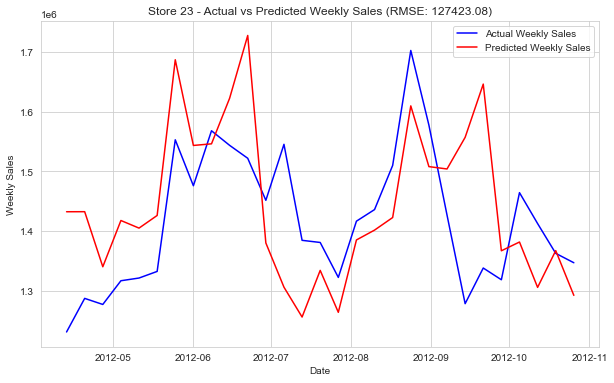

Actual Weekly Sales:
[1231752.54 1287899.41 1277758.76 1317379.68 1321914.34 1332952.47
 1552934.64 1476144.34 1568048.54 1543667.68 1522042.57 1451782.16
 1545370.16 1384921.63 1381339.23 1322932.36 1416926.31 1436311.76
 1510131.45 1702220.96 1577468.78 1427162.26 1279041.64 1338627.55
 1319035.06 1464616.59 1412925.25 1363155.77 1347454.59]

Predicted Weekly Sales:
[1432689.3829455  1432778.90288922 1340737.61626056 1418052.13890876
 1405343.42893137 1426480.91638908 1686698.17821812 1543483.93118081
 1546203.31181426 1622395.80988245 1727303.7923645  1380520.94171423
 1306607.48159131 1256720.79047465 1334691.48185335 1264605.87995642
 1385542.4501106  1402011.10036078 1423026.7066075  1609617.97872262
 1508120.5957751  1504176.29039    1557020.41270571 1646033.29869506
 1367439.38589541 1382096.16223122 1306276.05828954 1367694.35528641
 1292943.21502013]
Store 24 - Period of Seasonality: 17.88


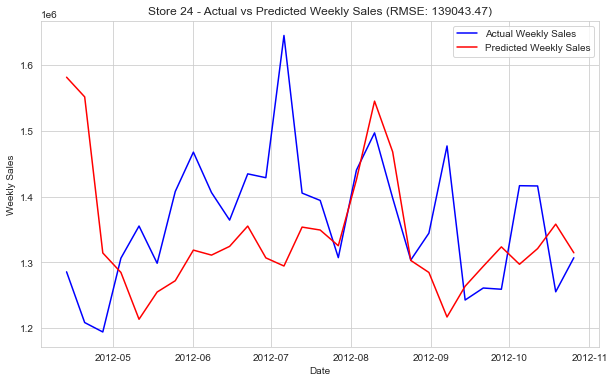

Actual Weekly Sales:
[1285783.87 1208654.4  1194334.65 1306551.71 1355391.79 1298809.8
 1407897.57 1467722.19 1406313.13 1364445.98 1434709.63 1428869.9
 1645097.75 1405475.78 1394299.   1307339.14 1440374.13 1497054.81
 1397970.54 1303726.54 1344558.92 1477134.75 1242909.53 1261158.47
 1259278.36 1416720.54 1416301.17 1255414.84 1307182.29]

Predicted Weekly Sales:
[1581632.92675583 1551715.9257081  1314464.66373984 1284821.07097881
 1213687.11141388 1255073.79311502 1272247.92846819 1318792.64101855
 1311187.23789509 1324484.42260987 1355316.654862   1306992.05605901
 1294617.36547267 1353770.53706633 1349322.6783911  1325413.06379871
 1425751.72336398 1545246.02256705 1468189.53860202 1303060.77133452
 1284818.74976384 1217101.17654614 1263895.35570104 1294185.17099828
 1323701.82496507 1297247.26578836 1321105.80280859 1358243.69441764
 1314699.27387887]
Store 25 - Period of Seasonality: 17.88


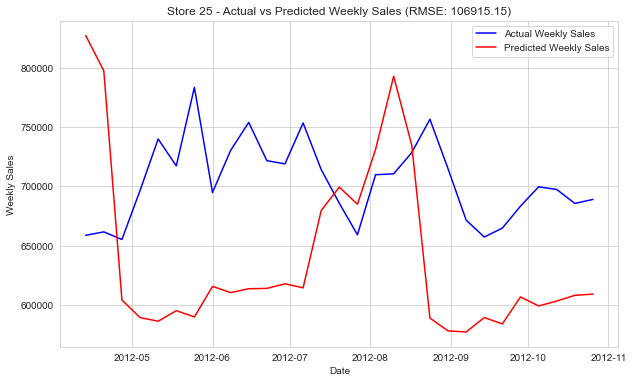

Actual Weekly Sales:
[658691.56 661566.48 655157.32 696421.72 739866.16 717207.19 783371.02
 694765.95 730254.19 753860.89 721601.9  718890.81 753385.55 714093.95
 685676.58 659109.53 709724.6  710496.97 728467.72 756527.64 714828.73
 671482.9  657241.63 664745.2  683300.84 699536.73 697317.41 685531.85
 688940.94]

Predicted Weekly Sales:
[827132.86095413 797292.75766392 604160.8426686  589330.10314012
 586260.8195148  595164.7163014  589849.71511313 615621.80212506
 610376.27207551 613640.9159557  613924.86881668 617785.82798845
 614412.46986602 679557.12699788 699300.10490703 684845.77039778
 731025.36527236 792769.4636219  734445.64077576 588931.32361126
 578104.92545623 577193.63673773 589328.19896673 584004.80474781
 606733.76525756 599109.18947048 603279.01838784 608095.86566574
 609096.10302832]
Store 26 - Period of Seasonality: 47.67


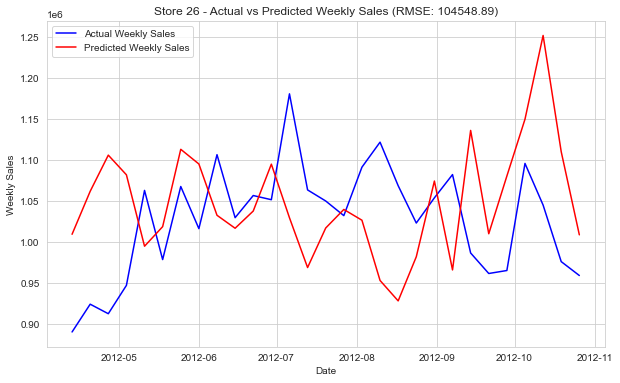

Actual Weekly Sales:
[ 889670.29  923600.02  911969.    946573.29 1062548.73  978082.84
 1067310.74 1015853.03 1106176.83 1029248.22 1056282.91 1051190.44
 1180470.8  1063149.78 1049625.9  1031745.14 1090915.09 1121476.51
 1068292.56 1022704.2  1053495.51 1081874.03  986131.94  961084.08
  964726.37 1095504.26 1044639.69  975578.02  958619.8 ]

Predicted Weekly Sales:
[1008974.1856566  1061451.49665702 1105625.03696531 1081589.80424622
  994382.66889453 1018301.07057468 1112729.31442974 1094803.31491811
 1032167.64493247 1016335.98056285 1037346.30743233 1094600.67677899
 1029142.64445243  968352.55850689 1016610.90663874 1039289.1712004
 1026147.53690907  952571.34806     927628.75883     981507.61713635
 1073981.94786895  965445.86881485 1135798.04444898 1009615.7834716
 1080076.40289918 1149480.58043909 1251757.01553351 1109781.50268674
 1008311.51448637]
Store 27 - Period of Seasonality: 17.88


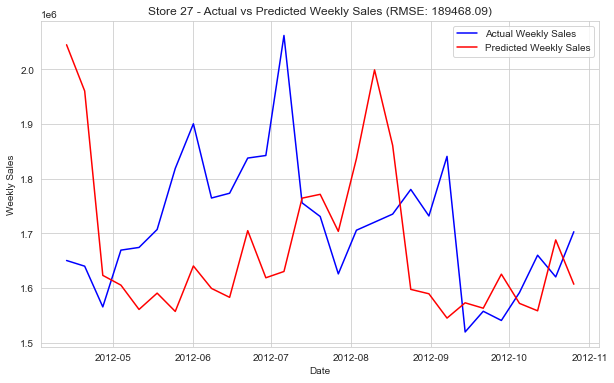

Actual Weekly Sales:
[1650405.21 1639999.47 1565498.84 1669388.45 1674306.31 1707158.82
 1818906.73 1900638.6  1764756.31 1773500.56 1837884.79 1842555.32
 2062224.92 1755889.53 1730913.66 1625883.71 1705810.84 1720537.26
 1735339.59 1780443.36 1731935.43 1840955.23 1519604.5  1557485.75
 1540687.63 1591816.88 1660081.29 1620374.24 1703047.74]

Predicted Weekly Sales:
[2045218.7167699  1960601.92045925 1623188.37867969 1605324.8791959
 1560837.74376652 1590667.4970359  1557197.99111016 1640408.66411041
 1599307.83424536 1582971.72913322 1705019.58511081 1618801.86395908
 1630303.81618252 1764513.97635895 1771509.75111979 1703722.61620303
 1836868.6645144  1999271.79362912 1860931.6866737  1597535.9660578
 1589528.59970914 1545018.65786387 1572967.51298688 1563131.92576671
 1625384.54350195 1571904.55125167 1558368.07569298 1688093.69354321
 1606989.6579285 ]
Store 28 - Period of Seasonality: 28.6


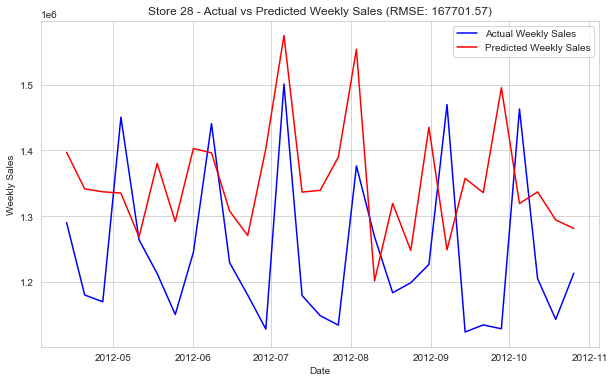

Actual Weekly Sales:
[1290684.95 1180797.2  1170456.16 1450628.85 1264575.18 1213310.45
 1151214.41 1245480.95 1440687.69 1229760.97 1180671.55 1129031.98
 1500863.54 1179915.04 1149427.48 1135035.09 1376520.1  1269113.41
 1184198.41 1199309.59 1227118.75 1469693.99 1124660.77 1135340.19
 1129508.61 1462941.03 1205536.71 1143724.48 1213860.61]

Predicted Weekly Sales:
[1397221.86354314 1341808.50671364 1337328.66967559 1335379.99530613
 1268819.16803601 1380424.80067574 1292176.38710134 1402975.24760529
 1396388.28314456 1308218.09894221 1270919.72527338 1402949.45527417
 1574514.85085951 1336908.64657388 1339517.5945196  1389983.69396751
 1553436.52224101 1202048.9985854  1319685.21251783 1248335.61433649
 1435217.51736448 1249302.35545733 1357657.40177006 1336023.64200436
 1495283.70703993 1319495.99313561 1337225.47976882 1294593.14974709
 1281697.98937861]
Store 29 - Period of Seasonality: 17.88


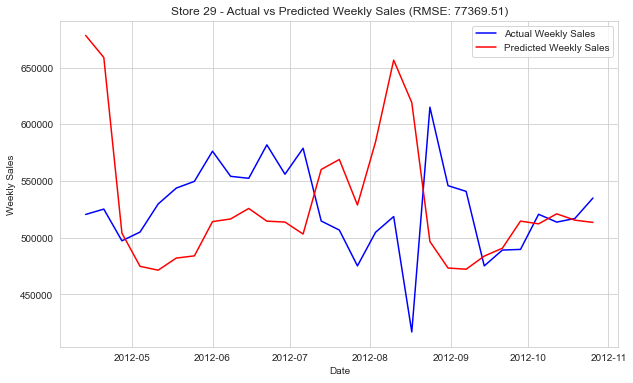

Actual Weekly Sales:
[520493.83 525200.59 497250.22 504963.84 529707.87 543706.04 549665.67
 576252.35 554093.15 552338.76 581854.5  555954.13 578832.41 514709.76
 506705.36 475158.24 504754.74 518628.42 416881.66 615026.15 545844.91
 540811.85 475127.18 489079.23 489674.23 520632.8  513737.   516909.24
 534970.68]

Predicted Weekly Sales:
[678263.26622775 658864.05764495 504023.7297527  474752.16485627
 471352.9905069  482023.0143513  483962.10934038 514162.11419439
 516503.40955563 525764.33269581 514565.94758253 513783.11129176
 503212.14612477 560134.73194079 568940.08026288 528812.04987951
 584475.42931066 656532.82975103 619069.54775055 496609.23134005
 473266.85915194 472200.87016638 483768.82305615 490719.8519283
 514607.820905   512200.93656841 521037.40570796 515466.43772565
 513475.49826247]
Store 30 - Period of Seasonality: 2.17


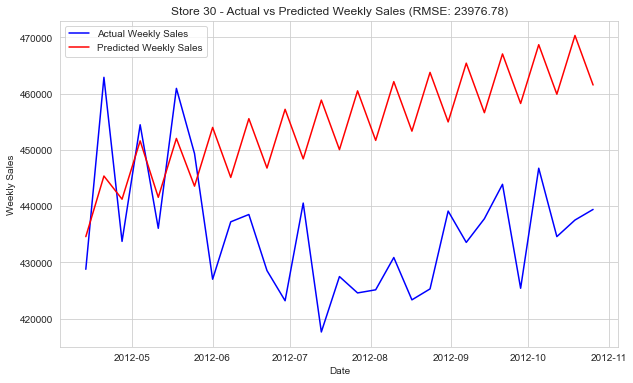

Actual Weekly Sales:
[428784.7  462909.41 433744.83 454477.54 436070.45 460945.14 449355.91
 427021.18 437222.94 438523.24 428554.63 423192.4  440553.42 417640.34
 427491.04 424581.17 425136.55 430878.28 423351.15 425296.65 439132.5
 433565.77 437773.31 443891.64 425410.04 446751.45 434593.26 437537.29
 439424.5 ]

Predicted Weekly Sales:
[434588.69830459 445362.34381597 441246.87861343 451611.09105418
 441579.40212717 452047.58327139 443562.81825877 454003.80474128
 445114.61708268 455562.71320446 446779.2566925  457225.49408951
 448414.39551777 458861.11885467 450057.24694691 460503.84324102
 451698.08201413 462144.71152197 453339.44423346 463786.06505799
 454980.6686356  465427.29173027 456621.92906828 467068.55156945
 458263.18008124 468709.80273757 459904.43355687 470351.05617263
 461545.68638866]
Store 31 - Period of Seasonality: 13.0


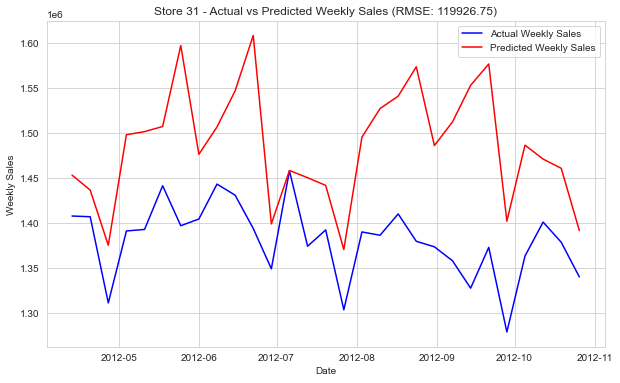

Actual Weekly Sales:
[1407842.91 1407036.59 1311352.25 1391257.28 1392938.06 1441473.82
 1397094.26 1404516.29 1443285.79 1431003.43 1394065.76 1349202.25
 1458059.42 1374301.34 1392395.2  1303732.36 1390174.63 1386472.59
 1410181.7  1379783.21 1373651.49 1358111.62 1327705.44 1373064.87
 1279080.58 1363365.05 1401113.42 1378730.45 1340232.55]

Predicted Weekly Sales:
[1453236.75274948 1436685.90880886 1375387.14168035 1498130.57509529
 1501532.72607559 1507279.07445815 1597164.75342838 1476374.14350395
 1506778.60966772 1546796.13397982 1608341.7078637  1399076.62530595
 1458406.65723449 1450389.85100557 1441854.73007447 1370609.77749897
 1495410.31848428 1527196.42929183 1540928.20559208 1573568.78523076
 1486108.80621727 1512403.62272447 1552992.37370277 1576656.03489044
 1402037.69122686 1486555.3852373  1471084.62664098 1460838.30202202
 1391716.66997667]
Store 32 - Period of Seasonality: 17.88


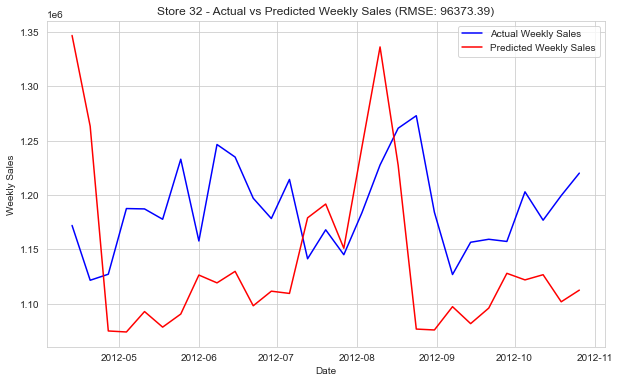

Actual Weekly Sales:
[1171834.47 1121405.91 1126962.44 1187384.53 1187051.07 1177539.71
 1232784.22 1157557.79 1246322.44 1234759.54 1196880.11 1178211.81
 1214183.97 1141184.66 1167829.33 1144901.52 1183571.35 1227469.2
 1261306.37 1272809.11 1183979.27 1126685.95 1156377.47 1159119.6
 1157111.15 1202775.24 1176681.31 1199292.06 1219979.29]

Predicted Weekly Sales:
[1346651.59720338 1263132.99836554 1074743.26262703 1073819.98413393
 1092608.41653784 1078280.26596798 1090315.86892857 1126191.81926441
 1119006.23567149 1129594.93972431 1097934.21275303 1111357.29584591
 1109289.56442238 1178852.97378078 1191534.71234508 1150859.65978794
 1244086.10396171 1336103.38108263 1227192.12641061 1076488.39103651
 1075668.01429973 1097100.70559458 1081497.58428857 1095786.29075624
 1127788.56475295 1121736.60865313 1126505.12986078 1101591.32672542
 1112318.13936717]
Store 33 - Period of Seasonality: 4.33


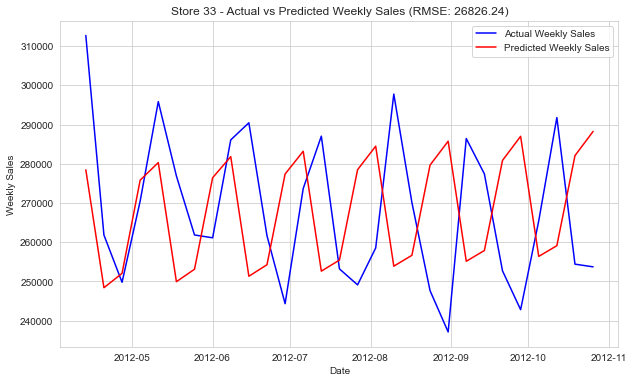

Actual Weekly Sales:
[312698.67 261837.2  249798.75 270497.51 295841.84 276899.95 261851.74
 261131.09 286082.76 290444.31 261666.29 244338.31 273690.37 287033.64
 253205.89 249134.32 258533.12 297753.49 270097.76 247672.56 237129.81
 286428.78 277417.53 252709.58 242813.51 265444.9  291781.15 254412.34
 253731.13]

Predicted Weekly Sales:
[278464.04022459 248407.7607449  252070.62327708 275822.13981064
 280297.84497839 249950.15517196 253117.94167494 276440.24943688
 281817.24626507 251330.23548473 254263.74996414 277383.18171079
 283186.02414349 252633.18063282 255456.00055384 278479.57296603
 284483.6279651  253899.67839707 256670.19499445 279648.47374669
 285747.60194377 255148.95472337 257894.75793262 280851.63537189
 286995.68577811 256390.09389793 259124.2199993  282070.98529049
 288236.26149868]
Store 34 - Period of Seasonality: 47.67


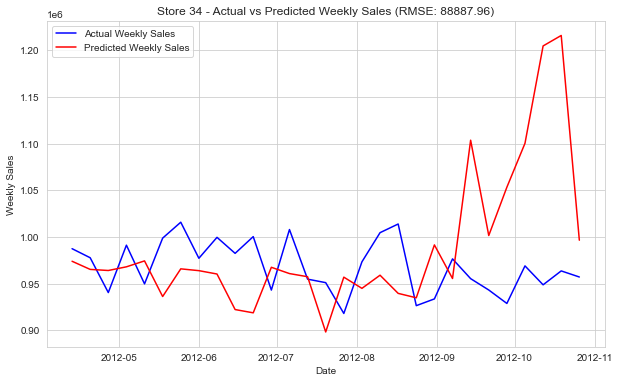

Actual Weekly Sales:
[ 987353.65  977628.78  940299.87  991104.4   949625.52  998672.85
 1015737.61  977062.44  999511.29  982345.51 1000285.1   942970.63
 1007867.68  954677.75  950929.59  917883.79  973250.41 1004523.59
 1013820.86  926250.21  933487.71  976415.56  955211.7   943047.78
  928629.31  968896.68  948613.39  963516.28  956987.81]

Predicted Weekly Sales:
[ 973863.8545545   965131.83039286  963961.68872191  967901.33788763
  974244.8646268   936047.67323454  965727.65751017  963789.78065423
  960190.35485247  922075.37896407  918562.58898544  967395.68821827
  960656.39458523  957290.16351263  898031.39267916  956819.75418912
  944809.90265108  958906.86470099  939423.663262    934699.32347
  991398.04403549  955368.446825   1103688.99906065 1001458.21674633
 1053257.72728226 1100360.22304031 1204768.39399883 1216001.2410233
  996443.62414909]
Store 35 - Period of Seasonality: 13.0


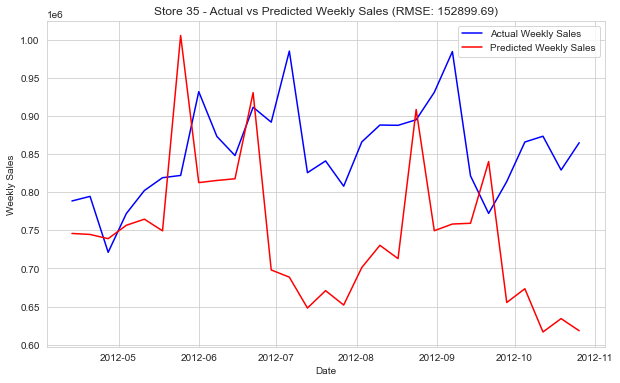

Actual Weekly Sales:
[788633.42 794660.24 721212.45 772036.6  802383.63 819196.68 822167.17
 932195.52 873415.01 848289.41 911696.   892133.41 985479.64 825763.48
 841224.74 808030.15 866216.36 888368.8  887979.47 895274.72 931278.97
 984833.35 821568.64 772302.94 814099.86 866064.4  873643.14 829284.67
 865137.6 ]

Predicted Weekly Sales:
[ 745955.28168542  744679.77953489  739129.74134785  756675.33977286
  764719.38461111  749423.99615753 1005995.01935851  812747.67725927
  815571.24549276  817798.32554497  930897.02976605  698049.04601406
  688575.93957614  648031.89948294  670858.80398757  651994.34613337
  701280.16185173  730383.54949764  712950.30586409  908762.18170832
  749585.29044037  758342.39836784  759351.93748909  840433.16597532
  655279.65191103  673371.03856612  616585.51346073  634107.67576176
  618173.61265877]
Store 36 - Period of Seasonality: 4.33


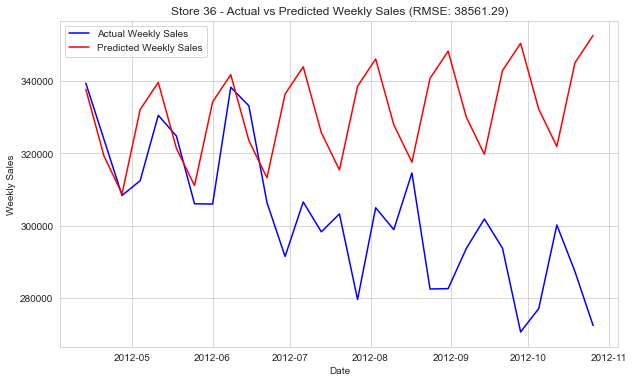

Actual Weekly Sales:
[339407.94 323915.32 308389.82 312467.52 330518.34 324801.13 306098.17
 306005.53 338273.38 333146.88 306411.01 291530.43 306578.89 298337.41
 303289.55 279643.43 304989.97 298947.51 314607.22 282545.55 282647.48
 293728.57 301893.63 293804.45 270677.98 277137.86 300236.85 287360.05
 272489.41]

Predicted Weekly Sales:
[337709.82316334 319325.53579451 308825.39360192 332116.84098083
 339614.79676752 321407.91093518 311102.40386946 334225.87232991
 341764.49273535 323566.41459389 313270.39696233 336385.70869734
 343926.30594966 325728.65593748 315433.09942969 338548.01482967
 346088.70813884 327891.07892981 317595.5448283  340710.44097016
 348251.13894678 330053.51074859 319757.97773581 342872.8729419
 350413.57114531 332215.94299624 321920.41003637 345035.30519699
 352576.00341142]
Store 37 - Period of Seasonality: 47.67


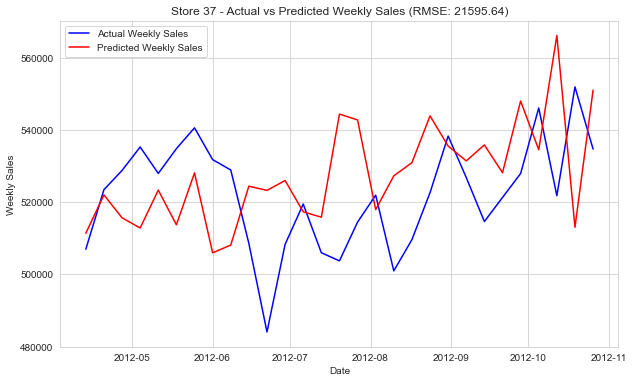

Actual Weekly Sales:
[506973.17 523483.19 528807.45 535311.64 527983.04 534847.96 540625.79
 531811.85 528940.78 508573.16 484032.75 508309.81 519498.32 506005.47
 503744.56 514489.17 521959.28 500964.59 509633.71 522665.04 538344.1
 526838.14 514651.74 521320.98 527953.14 546122.37 521810.75 551969.1
 534738.43]

Predicted Weekly Sales:
[511402.09120839 522025.0058806  515685.93164233 512858.70907443
 523360.32193404 513753.54576073 528128.45028501 505975.27845709
 508122.78748953 524450.46711627 523280.91749743 526019.73878969
 517342.76181326 515851.59747472 544432.00436924 542811.25875372
 517960.20833673 527320.10445164 530972.06992578 543928.774885
 535575.65980834 531450.20176493 535888.83492576 528183.56034457
 548064.66518992 534536.6240478  566228.63608181 513052.95968198
 551069.21761187]
Store 38 - Period of Seasonality: 4.33


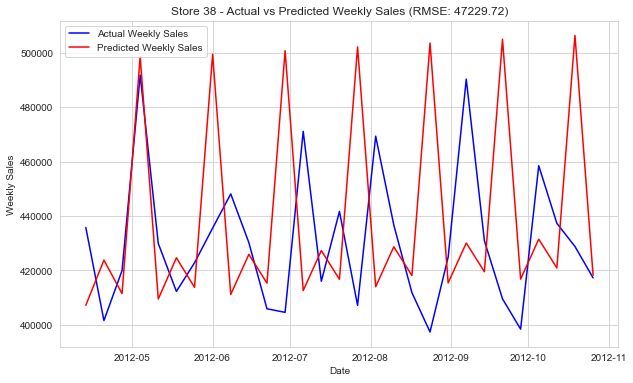

Actual Weekly Sales:
[435790.74 401615.8  419964.77 491755.69 429914.6  412314.71 422810.12
 435579.7  448110.25 430222.07 405938.35 404634.36 471086.22 416036.75
 441683.74 407186.47 469311.17 436690.13 411866.46 397428.22 424904.95
 490274.82 430944.39 409600.98 398468.08 458479.01 437320.66 428806.46
 417290.38]

Predicted Weekly Sales:
[407223.59179171 423814.4034987  411509.83646924 498576.15611532
 409530.46531906 424675.32317755 413810.34833188 499393.01936366
 411196.80361277 425932.32156354 415341.48423743 500710.25849662
 412631.03733852 427310.18485068 416754.47207476 502097.84951354
 414032.30792422 428704.86458577 418153.15223071 503493.72458784
 415429.68396986 430101.51747162 419550.23897868 504890.51139254
 416826.63076958 431498.38718723 420947.15468349 506287.39552346
 418223.53171641]
Store 39 - Period of Seasonality: 28.6


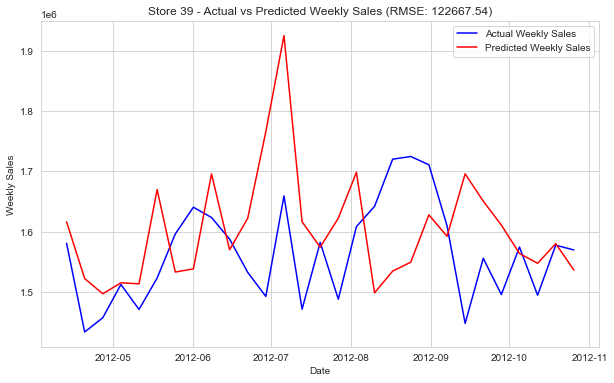

Actual Weekly Sales:
[1580732.73 1433391.04 1456997.2  1512227.34 1470792.41 1522978.54
 1596036.66 1640476.77 1623442.24 1587499.82 1532316.79 1492388.98
 1659221.99 1471261.76 1582168.27 1487797.54 1608277.74 1641867.92
 1720221.91 1724669.75 1710923.94 1609811.75 1447614.08 1555672.51
 1495607.07 1574408.67 1494417.07 1577486.33 1569502.  ]

Predicted Weekly Sales:
[1616250.67499142 1522037.39832848 1496851.92168881 1514970.77743872
 1513371.42984038 1669647.94299551 1532880.74884228 1538087.01893041
 1695821.51465869 1569865.18006487 1622241.14048032 1766082.26736201
 1925565.19179808 1616306.98560764 1574176.13333029 1622342.48504495
 1698436.71848063 1498370.32753839 1534441.08842879 1549283.00973927
 1627765.18152219 1592191.10613572 1695929.09250006 1650525.35723225
 1610777.18426435 1563668.28527277 1547378.40027289 1580049.66843626
 1536291.7917529 ]
Store 40 - Period of Seasonality: 17.88


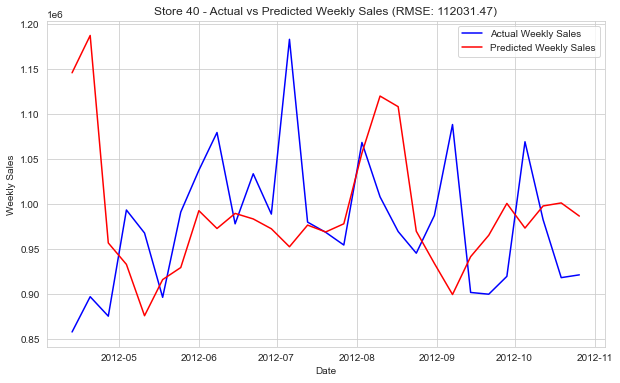

Actual Weekly Sales:
[ 857811.17  896979.93  875372.91  993311.59  967729.35  896295.41
  991054.49 1037464.27 1079386.88  977950.28 1033552.18  988764.84
 1182901.56  979848.71  968502.38  954396.85 1068346.76 1007906.43
  969387.48  945318.47  987264.67 1088248.4   901709.82  899768.4
  919595.44 1069112.    982523.26  918170.5   921264.52]

Predicted Weekly Sales:
[1145711.24467538 1187186.1362347   956716.62814754  932897.54776364
  875863.99952775  916004.74171609  929394.62667833  992548.11519198
  972762.77608491  989523.68756314  983373.46993652  972454.579808
  952476.88575291  976532.75176985  968914.99250733  977989.76552268
 1056542.71298611 1119882.89499106 1108072.59108625  969728.86318629
  933914.11398136  899433.52678107  941452.40112479  965240.05808456
 1000622.70542098  973238.03108554  997796.08922816 1001152.75855363
  986558.57678643]
Store 41 - Period of Seasonality: 23.83


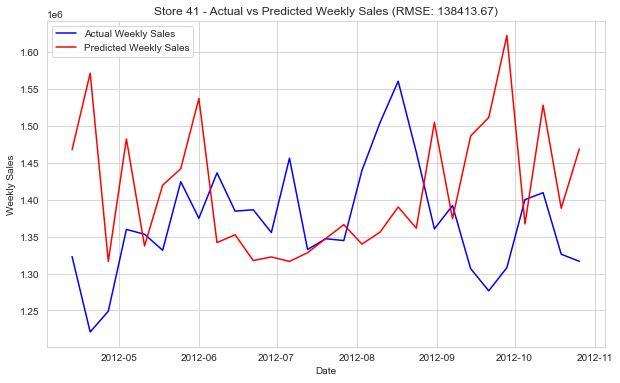

Actual Weekly Sales:
[1323004.73 1220815.33 1248950.65 1359770.73 1353285.1  1331514.44
 1424500.47 1374891.36 1436383.84 1384584.59 1386407.17 1355600.01
 1456300.89 1332594.07 1347175.93 1344723.97 1439607.35 1504545.94
 1560590.05 1464462.85 1360517.52 1392143.82 1306644.25 1276609.36
 1307928.01 1400160.95 1409544.97 1326197.24 1316542.59]

Predicted Weekly Sales:
[1467688.02176524 1571636.23888284 1316374.19094266 1482467.84452069
 1337279.78342067 1419595.01903289 1442152.56046789 1537251.81935213
 1341920.44063031 1352531.32603268 1317603.92653015 1322485.39267654
 1316413.62976225 1328221.95001833 1347355.38071262 1366193.90075586
 1339918.51097125 1356065.38404689 1390248.5732537  1361463.98734118
 1504846.77127448 1374460.11440218 1486371.07125504 1511422.60200772
 1622613.97906547 1367215.64412284 1528143.24438512 1388499.14479695
 1468905.90190463]
Store 42 - Period of Seasonality: 4.33


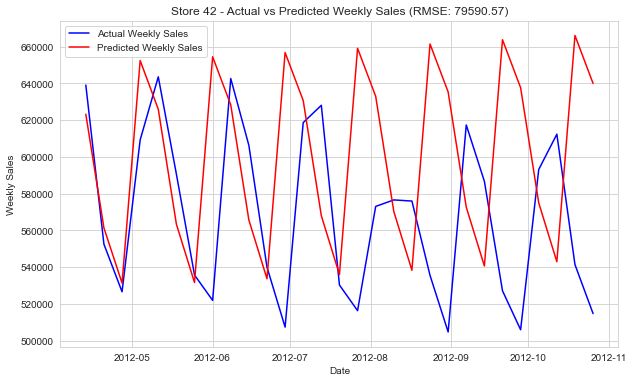

Actual Weekly Sales:
[639123.45 552529.23 526625.49 609274.89 643603.69 590636.38 535764.58
 521953.78 642671.48 606309.13 540031.29 507403.77 618702.09 628099.08
 530318.39 516352.21 573084.71 576620.31 575997.78 535537.03 504760.57
 617405.35 586737.66 527165.7  505978.46 593162.53 612379.9  541406.98
 514756.08]

Predicted Weekly Sales:
[623244.35865404 561370.23026689 531361.32962421 652467.9038364
 625963.58506971 563396.39836954 531656.64634941 654508.49967553
 628343.61308648 565684.68878423 533715.90049886 656798.7021572
 630678.73188928 568007.66815712 536008.57203523 659121.93455012
 633007.90795472 570335.23783997 538332.13115244 661449.53771452
 635336.29763151 572663.41494788 540659.77755151 663777.71925297
 637664.58324732 574991.67243494 542987.9648111  666105.97732631
 639992.85509297]
Store 43 - Period of Seasonality: 2.17


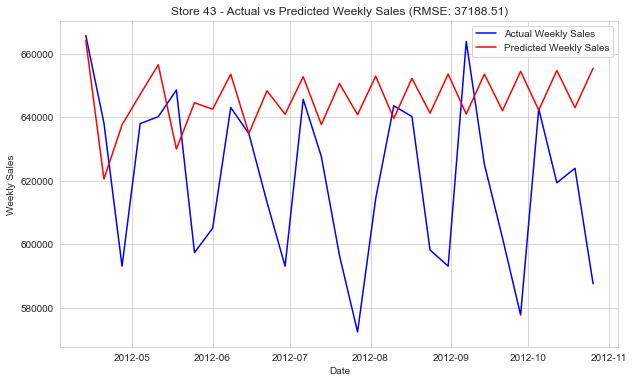

Actual Weekly Sales:
[665687.92 638144.98 593138.59 637964.2  640159.04 648541.81 597406.39
 605078.62 643032.51 634815.1  613270.79 593128.13 645618.59 627634.04
 596554.05 572447.52 614378.94 643558.78 640210.85 598234.64 593141.29
 663814.18 625196.94 601990.02 577792.32 642614.89 619369.72 623919.23
 587603.55]

Predicted Weekly Sales:
[664134.80962097 620545.54119065 637578.4559324  647141.52835275
 656476.18922537 629968.77833403 644527.59390018 642498.01608924
 653511.66174512 634871.15179165 648290.58952118 640922.44447354
 652709.28471191 637691.58637732 650586.32558889 640759.69993326
 652902.60647238 639553.26065945 652206.36928472 641247.58089106
 653554.46065683 640973.41317939 653515.24773347 642035.08347
 654417.47506884 642190.23910583 654680.83048285 642960.56575636
 655377.73155004]
Store 44 - Period of Seasonality: 2.47


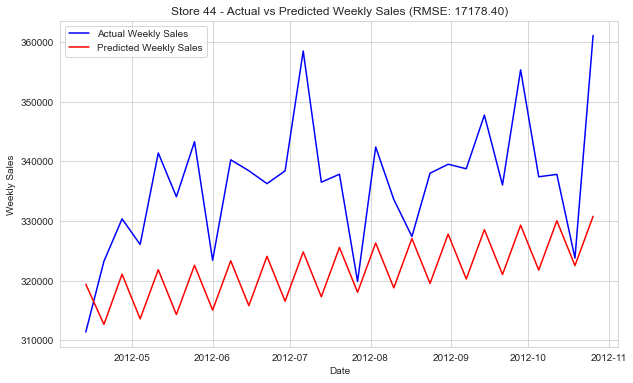

Actual Weekly Sales:
[311390.22 323233.8  330338.36 326053.28 341381.08 334042.43 343268.29
 323410.94 340238.38 338400.82 336241.   338386.08 358461.58 336479.49
 337819.16 319855.26 342385.38 333594.81 327389.51 337985.74 339490.69
 338737.33 347726.67 336017.6  355307.94 337390.44 337796.13 323766.77
 361067.07]

Predicted Weekly Sales:
[319390.76763597 312662.8516399  321063.61612286 313585.11845302
 321819.22429348 314306.33455385 322567.2255162  315052.80209466
 323312.85845572 315798.36415458 324058.50484163 316544.00741536
 324804.1446378  317289.64706494 325549.78456487 318035.28698568
 326295.42447227 318780.92689277 327041.0643803  319526.56680079
 327786.70428827 320272.20670875 328532.34419624 321017.84661673
 329277.98410421 321763.4865247  330023.62401218 322509.12643267
 330769.26392015]
Store 45 - Period of Seasonality: 28.6


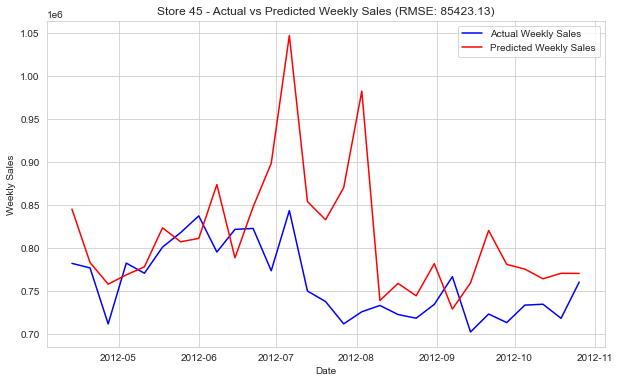

Actual Weekly Sales:
[781970.6  776661.74 711571.88 782300.68 770487.37 800842.28 817741.17
 837144.63 795133.   821498.18 822569.16 773367.71 843361.1  749817.08
 737613.65 711671.58 725729.51 733037.32 722496.93 718232.26 734297.87
 766512.66 702238.27 723086.2  713173.95 733455.07 734464.36 718125.53
 760281.43]

Predicted Weekly Sales:
[ 845090.66300808  782901.43238872  757826.17212097  768601.7823695
  777949.19570769  823270.87092444  807039.71597176  810983.17157403
  873576.97363929  788376.19032161  847585.9816611   898248.58128863
 1046846.61758303  853750.68180615  832725.73074522  869890.69350475
  982156.61799538  738775.30798787  758719.43677979  744279.42920569
  781608.84961513  728872.64381227  759234.94070362  820193.7188533
  780785.92357291  775334.89167668  764035.86039953  770435.60522158
  770312.83722055]
Average RMSE of all stores: 118814.16


In [150]:
# Function to calculate RMSE
def calculate_rmse(y_true, y_pred):
    return sqrt(mean_squared_error(y_true, y_pred))

# Function to get period for store
def get_period_for_store(store_num):
    periods_grouped = {
        13.0: [1, 5, 9, 12, 19, 23, 31, 35],
        47.67: [2, 3, 4, 8, 10, 20, 26, 34, 37],
        17.88: [6, 11, 13, 21, 24, 25, 27, 29, 32, 40],
        23.83: [7, 18, 41],
        28.6: [15, 16, 22, 28, 39, 45],
        4.33: [28, 33, 36, 38, 42],
        2.17: [14, 17, 30, 43],
        2.47: [44]
    }
    
    for period, stores in periods_grouped.items():
        if store_num in stores:
            return period
    
    return 1  # Default period if store not found in any group

# Function to build SARIMA model for each store
def build_sarima_model(df, store_num, period):
    # Filter data for the store
    store_data = df[df['Store'] == store_num]['Scaled_Weekly_Sales']
    
    # Convert to NumPy array and reshape
    store_data = np.array(store_data).reshape(-1, 1)
    
    # Split data into train and test sets
    train_size = int(len(store_data) * 0.8)
    train_data, test_data = store_data[:train_size], store_data[train_size:]
    
    # Build SARIMA model
    model = SARIMAX(train_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, period))
    fitted_model = model.fit()
    
    # Make predictions
    predictions = fitted_model.forecast(steps=len(test_data))
    
    # Reverse MinMax scaling for predictions and test data
    scaler = MinMaxScaler()
    scaler.fit(df['Weekly_Sales'].values.reshape(-1, 1))  # Using the original 'Weekly_Sales' for scaling
    predictions = scaler.inverse_transform(predictions.reshape(-1, 1)).flatten()
    test_data = scaler.inverse_transform(test_data.reshape(-1, 1)).flatten()
    
    # Calculate RMSE
    rmse = calculate_rmse(test_data, predictions)
    
    # Plot actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.plot(df.index[train_size:train_size+len(test_data)], test_data, label='Actual Weekly Sales', color='blue')
    plt.plot(df.index[train_size:train_size+len(predictions)], predictions, label='Predicted Weekly Sales', color='red')
    plt.xlabel('Date')
    plt.ylabel('Weekly Sales')
    plt.title(f'Store {store_num} - Actual vs Predicted Weekly Sales (RMSE: {rmse:.2f})')
    plt.legend()
    plt.show()
    
    # Print actual and predicted values
    print("Actual Weekly Sales:")
    print(test_data)
    print()
    print("Predicted Weekly Sales:")
    print(predictions)
    print("="*50)
    
    return rmse

# Iterate through each store
unique_stores = df['Store'].unique()
store_rmses = []

for store_num in unique_stores:
    period = get_period_for_store(store_num)
    print(f"Store {store_num} - Period of Seasonality: {period}")
    
    # Build SARIMA model for the store
    rmse = build_sarima_model(df, store_num, int(period))
    store_rmses.append(rmse)

# Print RMSE values for each store
#for store_num, rmse in zip(unique_stores, store_rmses):
 #   print(f"Store {store_num} - RMSE: {rmse:.2f}")

# Calculate and print average RMSE
average_rmse = np.mean(store_rmses)
print(f"Average RMSE of all stores: {average_rmse:.2f}")

- <b>Forecasting Weekly Sales for each Store for the next 12 weeks :

Store 1 - Period of Seasonality: 13.0


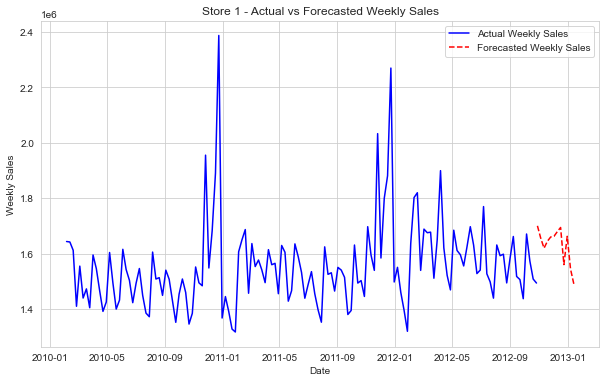

Forecasted Weekly Sales for Store 1:
         Date  Forecasted_Sales
0  2012-10-28        1700310.54
1  2012-11-04        1655678.27
2  2012-11-11        1619585.47
3  2012-11-18        1644389.67
4  2012-11-25        1659954.25
5  2012-12-02        1662441.75
6  2012-12-09        1679272.82
7  2012-12-16        1694337.80
8  2012-12-23        1560243.65
9  2012-12-30        1662423.48
10 2013-01-06        1544301.75
11 2013-01-13        1490095.98
Store 2 - Period of Seasonality: 47.67


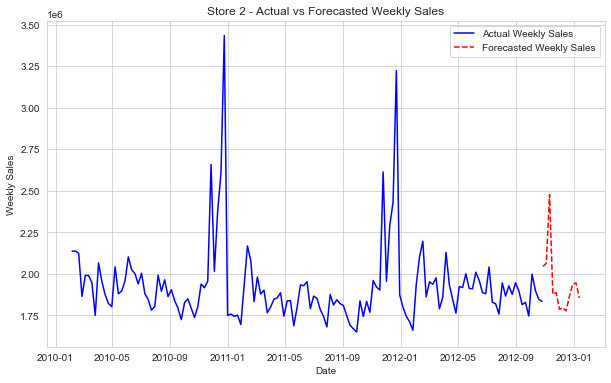

Forecasted Weekly Sales for Store 2:
         Date  Forecasted_Sales
0  2012-10-28        2044495.52
1  2012-11-04        2064275.30
2  2012-11-11        2477705.29
3  2012-11-18        1877221.89
4  2012-11-25        1887321.16
5  2012-12-02        1786917.85
6  2012-12-09        1796295.70
7  2012-12-16        1777257.63
8  2012-12-23        1864935.72
9  2012-12-30        1938367.28
10 2013-01-06        1945678.44
11 2013-01-13        1855168.46
Store 3 - Period of Seasonality: 47.67


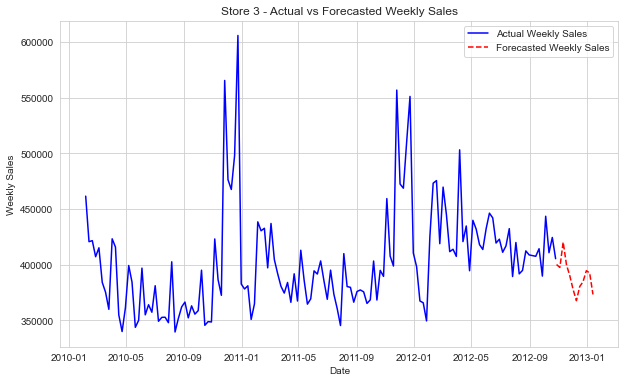

Forecasted Weekly Sales for Store 3:
         Date  Forecasted_Sales
0  2012-10-28         400185.43
1  2012-11-04         397595.13
2  2012-11-11         420312.67
3  2012-11-18         399920.69
4  2012-11-25         390139.95
5  2012-12-02         377728.12
6  2012-12-09         367746.20
7  2012-12-16         380415.45
8  2012-12-23         384755.98
9  2012-12-30         394652.66
10 2013-01-06         392623.76
11 2013-01-13         373309.08
Store 4 - Period of Seasonality: 47.67


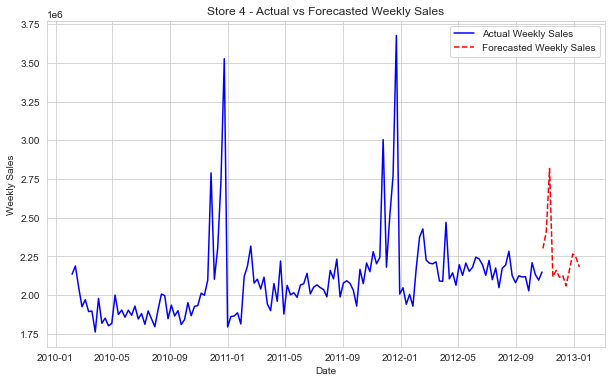

Forecasted Weekly Sales for Store 4:
         Date  Forecasted_Sales
0  2012-10-28        2301830.56
1  2012-11-04        2407919.38
2  2012-11-11        2817638.90
3  2012-11-18        2119330.20
4  2012-11-25        2159368.95
5  2012-12-02        2115827.17
6  2012-12-09        2127069.26
7  2012-12-16        2060350.30
8  2012-12-23        2162463.67
9  2012-12-30        2266234.12
10 2013-01-06        2243221.61
11 2013-01-13        2181887.02
Store 5 - Period of Seasonality: 13.0


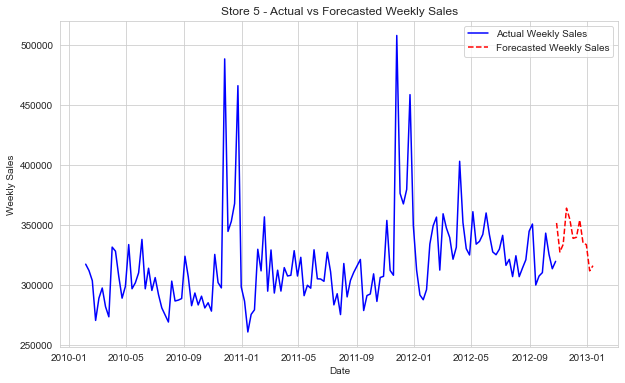

Forecasted Weekly Sales for Store 5:
         Date  Forecasted_Sales
0  2012-10-28         351536.25
1  2012-11-04         327354.58
2  2012-11-11         333660.75
3  2012-11-18         363902.32
4  2012-11-25         354657.25
5  2012-12-02         338718.14
6  2012-12-09         339590.43
7  2012-12-16         353942.34
8  2012-12-23         334836.03
9  2012-12-30         333508.25
10 2013-01-06         311624.41
11 2013-01-13         315922.17
Store 6 - Period of Seasonality: 17.88


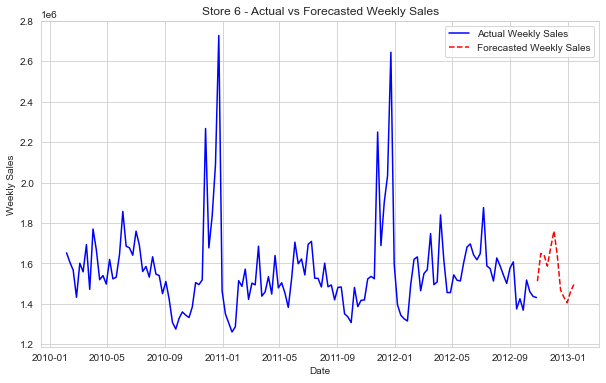

Forecasted Weekly Sales for Store 6:
         Date  Forecasted_Sales
0  2012-10-28        1512271.98
1  2012-11-04        1649341.96
2  2012-11-11        1642659.79
3  2012-11-18        1586850.75
4  2012-11-25        1678323.98
5  2012-12-02        1760480.13
6  2012-12-09        1639899.88
7  2012-12-16        1468736.62
8  2012-12-23        1432439.04
9  2012-12-30        1406052.82
10 2013-01-06        1460386.30
11 2013-01-13        1496006.94
Store 7 - Period of Seasonality: 23.83


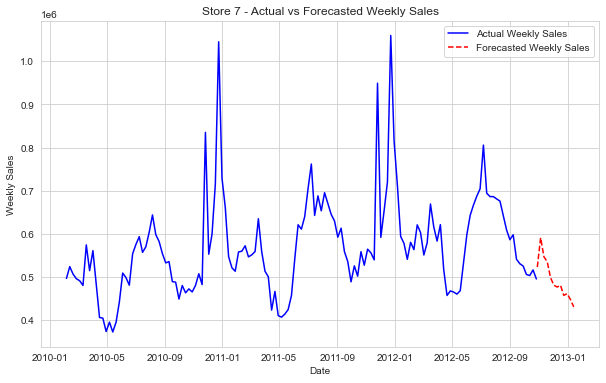

Forecasted Weekly Sales for Store 7:
         Date  Forecasted_Sales
0  2012-10-28         523101.88
1  2012-11-04         590942.30
2  2012-11-11         546990.39
3  2012-11-18         535414.92
4  2012-11-25         498504.07
5  2012-12-02         481069.28
6  2012-12-09         476734.05
7  2012-12-16         480975.32
8  2012-12-23         457477.83
9  2012-12-30         461476.73
10 2013-01-06         448103.89
11 2013-01-13         430780.28
Store 8 - Period of Seasonality: 47.67


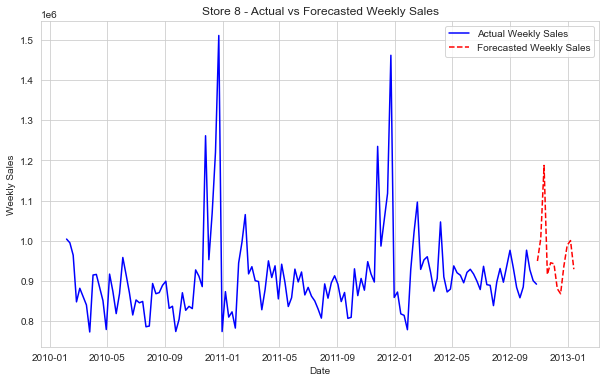

Forecasted Weekly Sales for Store 8:
         Date  Forecasted_Sales
0  2012-10-28         949433.99
1  2012-11-04        1005210.71
2  2012-11-11        1187659.56
3  2012-11-18         915697.38
4  2012-11-25         945108.72
5  2012-12-02         942418.23
6  2012-12-09         880409.47
7  2012-12-16         867762.50
8  2012-12-23         937078.51
9  2012-12-30         988721.18
10 2013-01-06        1000413.99
11 2013-01-13         929027.10
Store 9 - Period of Seasonality: 13.0


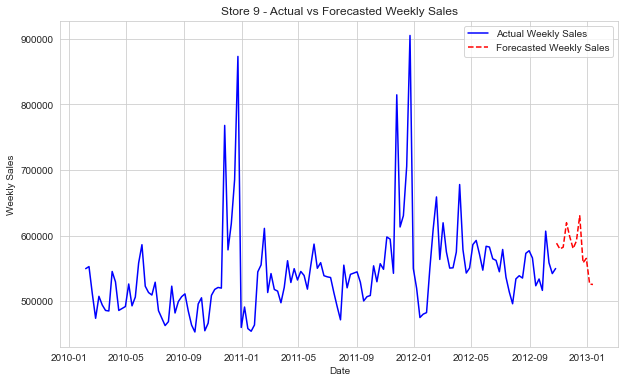

Forecasted Weekly Sales for Store 9:
         Date  Forecasted_Sales
0  2012-10-28         588346.44
1  2012-11-04         579534.03
2  2012-11-11         582291.62
3  2012-11-18         619571.73
4  2012-11-25         598014.80
5  2012-12-02         580199.77
6  2012-12-09         591651.98
7  2012-12-16         630271.98
8  2012-12-23         558522.91
9  2012-12-30         565146.86
10 2013-01-06         525898.37
11 2013-01-13         525419.20
Store 10 - Period of Seasonality: 47.67


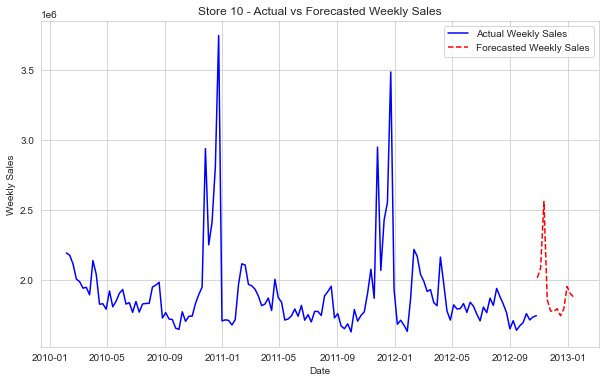

Forecasted Weekly Sales for Store 10:
         Date  Forecasted_Sales
0  2012-10-28        2015012.54
1  2012-11-04        2084671.71
2  2012-11-11        2560130.53
3  2012-11-18        1858415.42
4  2012-11-25        1777845.60
5  2012-12-02        1775978.61
6  2012-12-09        1794023.34
7  2012-12-16        1743844.90
8  2012-12-23        1792699.92
9  2012-12-30        1952675.74
10 2013-01-06        1901354.02
11 2013-01-13        1877631.87
Store 11 - Period of Seasonality: 17.88


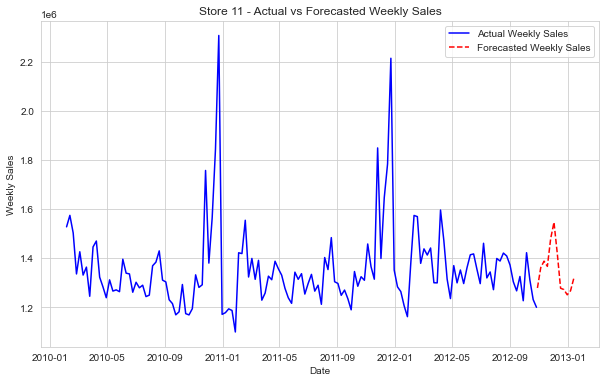

Forecasted Weekly Sales for Store 11:
         Date  Forecasted_Sales
0  2012-10-28        1279379.60
1  2012-11-04        1362089.90
2  2012-11-11        1388500.13
3  2012-11-18        1367175.69
4  2012-11-25        1479853.55
5  2012-12-02        1546608.02
6  2012-12-09        1419216.27
7  2012-12-16        1278324.53
8  2012-12-23        1272879.14
9  2012-12-30        1251574.82
10 2013-01-06        1267950.55
11 2013-01-13        1319208.36
Store 12 - Period of Seasonality: 13.0


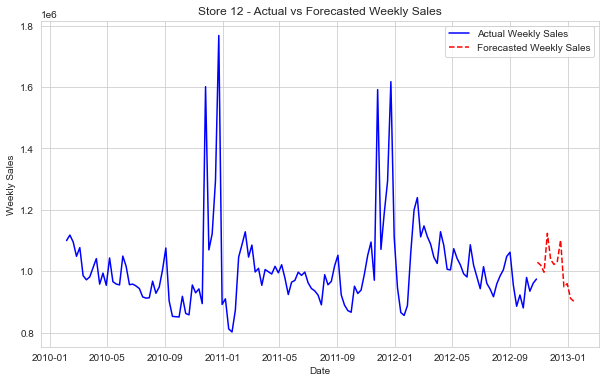

Forecasted Weekly Sales for Store 12:
         Date  Forecasted_Sales
0  2012-10-28        1029364.47
1  2012-11-04        1019641.26
2  2012-11-11         996721.36
3  2012-11-18        1123519.27
4  2012-11-25        1037888.71
5  2012-12-02        1022112.87
6  2012-12-09        1031680.86
7  2012-12-16        1101392.34
8  2012-12-23         949206.65
9  2012-12-30         959455.82
10 2013-01-06         911629.97
11 2013-01-13         901759.86
Store 13 - Period of Seasonality: 17.88


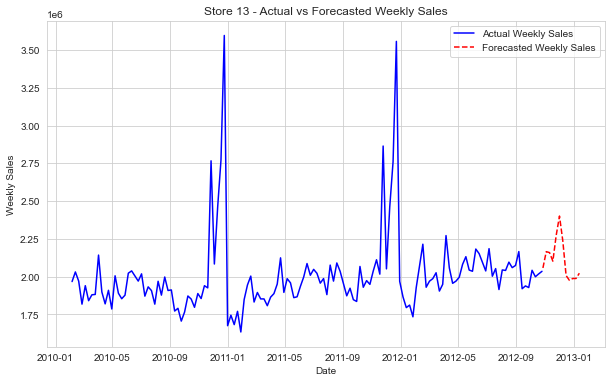

Forecasted Weekly Sales for Store 13:
         Date  Forecasted_Sales
0  2012-10-28        2057311.47
1  2012-11-04        2165120.57
2  2012-11-11        2158923.46
3  2012-11-18        2102259.07
4  2012-11-25        2271783.05
5  2012-12-02        2400878.54
6  2012-12-09        2237534.55
7  2012-12-16        2007200.37
8  2012-12-23        1975462.88
9  2012-12-30        1987636.81
10 2013-01-06        1987562.95
11 2013-01-13        2022437.41
Store 14 - Period of Seasonality: 2.17


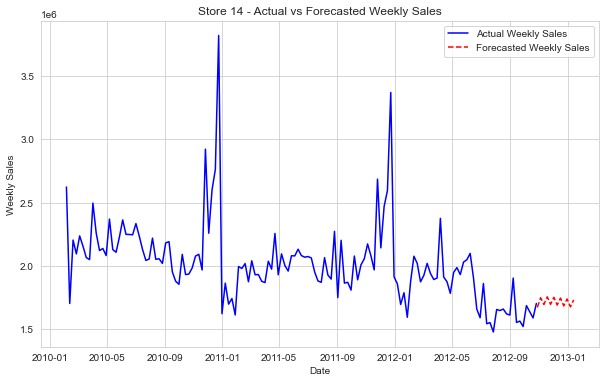

Forecasted Weekly Sales for Store 14:
         Date  Forecasted_Sales
0  2012-10-28        1673332.93
1  2012-11-04        1749368.92
2  2012-11-11        1696653.27
3  2012-11-18        1756841.04
4  2012-11-25        1697191.33
5  2012-12-02        1753200.71
6  2012-12-09        1691809.96
7  2012-12-16        1746818.18
8  2012-12-23        1685015.97
9  2012-12-30        1739790.89
10 2013-01-06        1677893.20
11 2013-01-13        1732614.23
Store 15 - Period of Seasonality: 28.6


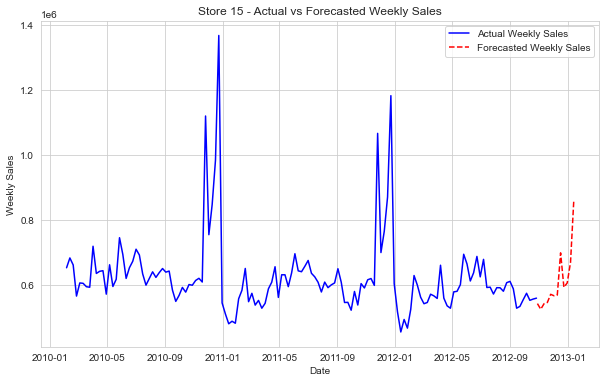

Forecasted Weekly Sales for Store 15:
         Date  Forecasted_Sales
0  2012-10-28         541629.22
1  2012-11-04         524175.56
2  2012-11-11         541379.21
3  2012-11-18         545154.87
4  2012-11-25         570291.30
5  2012-12-02         565827.55
6  2012-12-09         568094.30
7  2012-12-16         698103.42
8  2012-12-23         591777.48
9  2012-12-30         605492.22
10 2013-01-06         669051.41
11 2013-01-13         862472.87
Store 16 - Period of Seasonality: 28.6


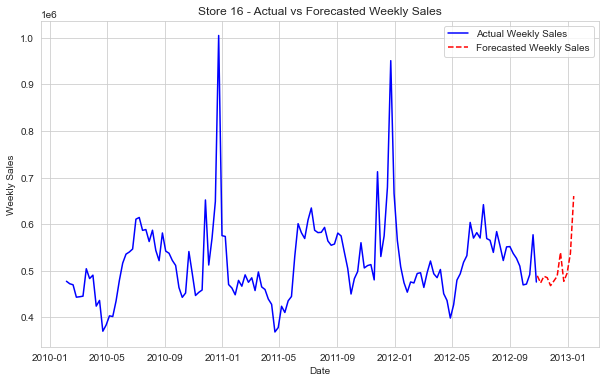

Forecasted Weekly Sales for Store 16:
         Date  Forecasted_Sales
0  2012-10-28         489099.78
1  2012-11-04         473864.07
2  2012-11-11         488129.15
3  2012-11-18         485055.58
4  2012-11-25         467944.93
5  2012-12-02         477982.14
6  2012-12-09         488233.96
7  2012-12-16         539107.34
8  2012-12-23         477325.18
9  2012-12-30         494593.65
10 2013-01-06         537156.76
11 2013-01-13         660250.80
Store 17 - Period of Seasonality: 2.17


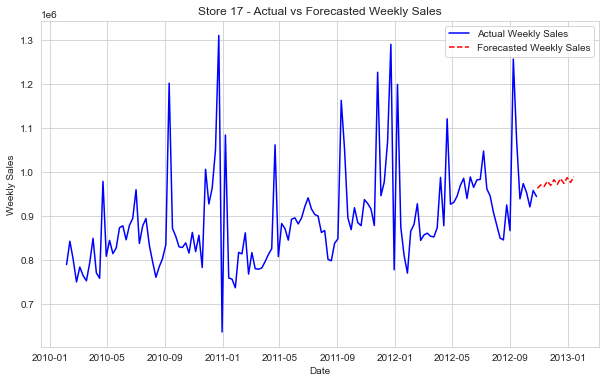

Forecasted Weekly Sales for Store 17:
         Date  Forecasted_Sales
0  2012-10-28         962122.75
1  2012-11-04         969778.45
2  2012-11-11         966104.19
3  2012-11-18         977977.02
4  2012-11-25         968709.90
5  2012-12-02         981621.28
6  2012-12-09         970970.69
7  2012-12-16         984138.90
8  2012-12-23         973146.16
9  2012-12-30         986377.88
10 2013-01-06         975300.53
11 2013-01-13         988547.96
Store 18 - Period of Seasonality: 23.83


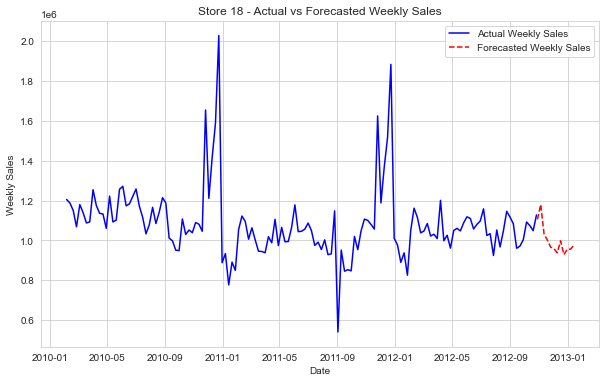

Forecasted Weekly Sales for Store 18:
         Date  Forecasted_Sales
0  2012-10-28        1105276.96
1  2012-11-04        1179937.95
2  2012-11-11        1032468.70
3  2012-11-18        1001478.62
4  2012-11-25         966087.93
5  2012-12-02         958582.34
6  2012-12-09         937951.47
7  2012-12-16         997994.10
8  2012-12-23         928432.27
9  2012-12-30         955287.00
10 2013-01-06         955975.31
11 2013-01-13         975494.45
Store 19 - Period of Seasonality: 13.0


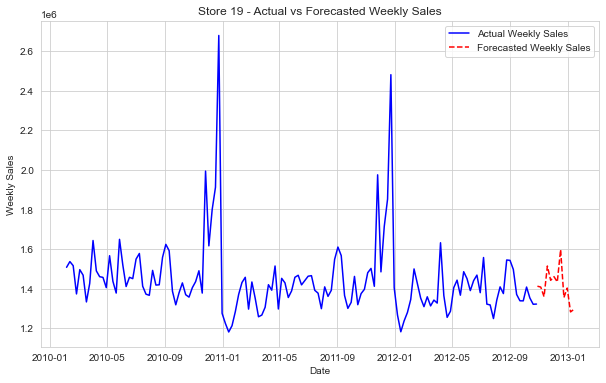

Forecasted Weekly Sales for Store 19:
         Date  Forecasted_Sales
0  2012-10-28        1412248.24
1  2012-11-04        1407978.11
2  2012-11-11        1359203.45
3  2012-11-18        1514142.61
4  2012-11-25        1441986.12
5  2012-12-02        1460580.37
6  2012-12-09        1433811.46
7  2012-12-16        1597050.52
8  2012-12-23        1354947.54
9  2012-12-30        1402891.90
10 2013-01-06        1282379.97
11 2013-01-13        1295261.89
Store 20 - Period of Seasonality: 47.67


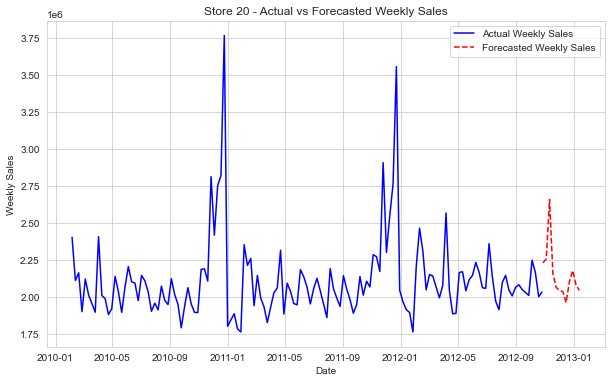

Forecasted Weekly Sales for Store 20:
         Date  Forecasted_Sales
0  2012-10-28        2228137.07
1  2012-11-04        2254824.51
2  2012-11-11        2657529.09
3  2012-11-18        2156809.07
4  2012-11-25        2062362.69
5  2012-12-02        2042579.94
6  2012-12-09        2034104.01
7  2012-12-16        1959999.63
8  2012-12-23        2102581.94
9  2012-12-30        2176462.35
10 2013-01-06        2079571.58
11 2013-01-13        2042496.05
Store 21 - Period of Seasonality: 17.88


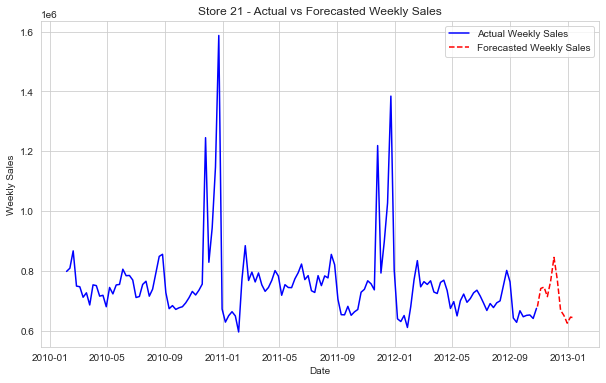

Forecasted Weekly Sales for Store 21:
         Date  Forecasted_Sales
0  2012-10-28         681081.25
1  2012-11-04         741666.15
2  2012-11-11         746267.36
3  2012-11-18         714326.27
4  2012-11-25         766860.78
5  2012-12-02         845490.79
6  2012-12-09         771140.72
7  2012-12-16         668434.04
8  2012-12-23         651506.17
9  2012-12-30         625644.82
10 2013-01-06         645899.25
11 2013-01-13         643553.39
Store 22 - Period of Seasonality: 28.6


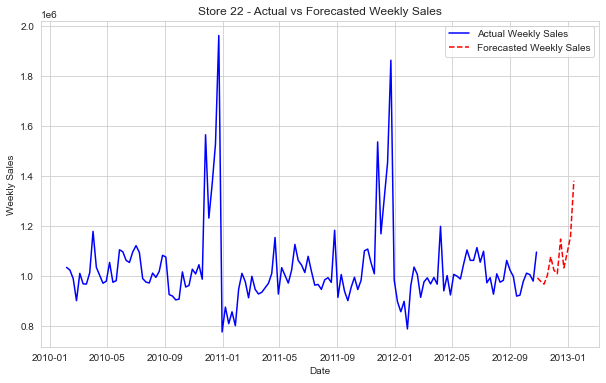

Forecasted Weekly Sales for Store 22:
         Date  Forecasted_Sales
0  2012-10-28         990998.13
1  2012-11-04         976939.14
2  2012-11-11         965827.61
3  2012-11-18        1001068.62
4  2012-11-25        1075492.11
5  2012-12-02        1021447.35
6  2012-12-09        1008013.31
7  2012-12-16        1146247.99
8  2012-12-23        1030954.71
9  2012-12-30        1092479.61
10 2013-01-06        1157387.97
11 2013-01-13        1380208.20
Store 23 - Period of Seasonality: 13.0


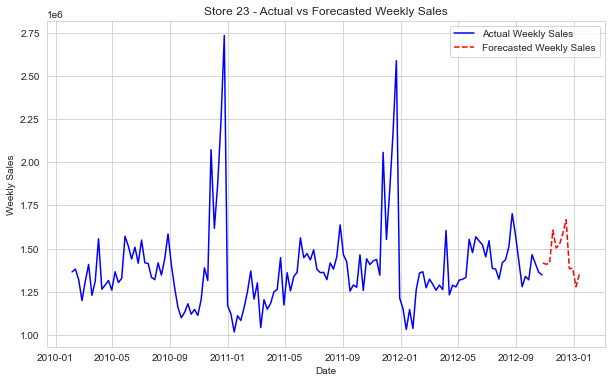

Forecasted Weekly Sales for Store 23:
         Date  Forecasted_Sales
0  2012-10-28        1416310.76
1  2012-11-04        1409010.08
2  2012-11-11        1414674.15
3  2012-11-18        1606207.89
4  2012-11-25        1503780.71
5  2012-12-02        1523090.97
6  2012-12-09        1586220.37
7  2012-12-16        1666844.46
8  2012-12-23        1383111.50
9  2012-12-30        1385691.31
10 2013-01-06        1278881.31
11 2013-01-13        1350529.91
Store 24 - Period of Seasonality: 28.6


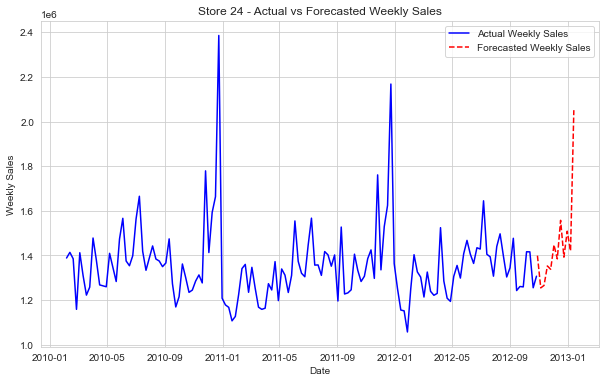

Forecasted Weekly Sales for Store 24:
         Date  Forecasted_Sales
0  2012-10-28        1399342.53
1  2012-11-04        1254729.89
2  2012-11-11        1266012.39
3  2012-11-18        1353118.90
4  2012-11-25        1338089.23
5  2012-12-02        1447475.21
6  2012-12-09        1384863.85
7  2012-12-16        1557671.54
8  2012-12-23        1392569.47
9  2012-12-30        1508868.20
10 2013-01-06        1420279.79
11 2013-01-13        2051261.49
Store 25 - Period of Seasonality: 28.6


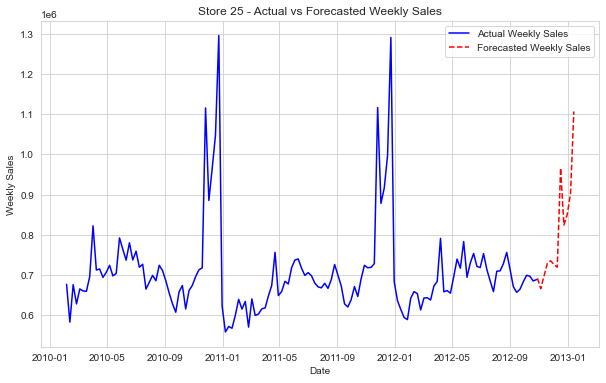

Forecasted Weekly Sales for Store 25:
         Date  Forecasted_Sales
0  2012-10-28         692285.43
1  2012-11-04         666353.31
2  2012-11-11         698045.01
3  2012-11-18         729285.70
4  2012-11-25         735693.01
5  2012-12-02         726114.16
6  2012-12-09         719835.70
7  2012-12-16         965953.53
8  2012-12-23         824329.87
9  2012-12-30         850344.47
10 2013-01-06         902961.55
11 2013-01-13        1106642.92
Store 26 - Period of Seasonality: 47.67


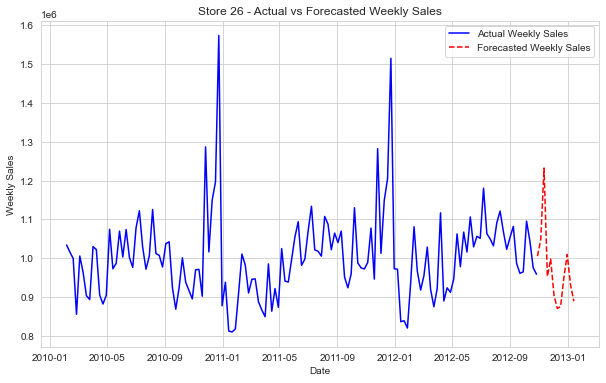

Forecasted Weekly Sales for Store 26:
         Date  Forecasted_Sales
0  2012-10-28        1005139.12
1  2012-11-04        1047828.88
2  2012-11-11        1232407.78
3  2012-11-18         952999.32
4  2012-11-25         997797.62
5  2012-12-02         905083.31
6  2012-12-09         870495.69
7  2012-12-16         875141.30
8  2012-12-23         950374.87
9  2012-12-30        1009600.45
10 2013-01-06         931131.72
11 2013-01-13         889304.83
Store 27 - Period of Seasonality: 28.6


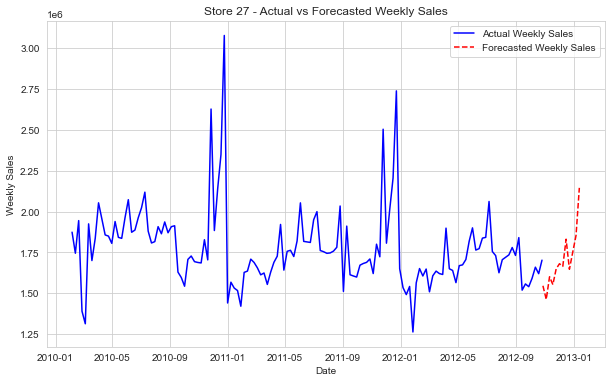

Forecasted Weekly Sales for Store 27:
         Date  Forecasted_Sales
0  2012-10-28        1546321.25
1  2012-11-04        1463193.48
2  2012-11-11        1601371.19
3  2012-11-18        1553436.15
4  2012-11-25        1649848.72
5  2012-12-02        1681229.93
6  2012-12-09        1664954.06
7  2012-12-16        1831367.50
8  2012-12-23        1647465.35
9  2012-12-30        1751143.09
10 2013-01-06        1854154.55
11 2013-01-13        2145549.03
Store 28 - Period of Seasonality: 4.33


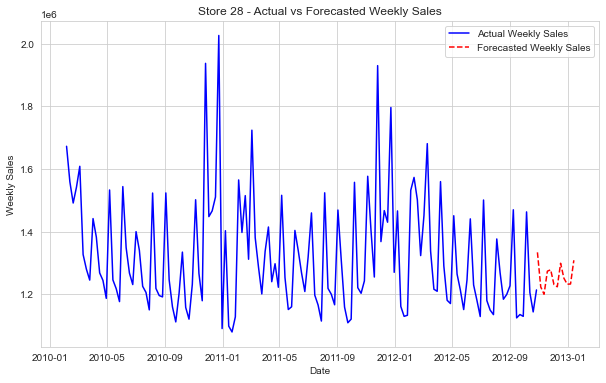

Forecasted Weekly Sales for Store 28:
         Date  Forecasted_Sales
0  2012-10-28        1333791.46
1  2012-11-04        1223449.84
2  2012-11-11        1200011.64
3  2012-11-18        1273674.88
4  2012-11-25        1278246.35
5  2012-12-02        1230706.29
6  2012-12-09        1223857.81
7  2012-12-16        1298951.53
8  2012-12-23        1251186.59
9  2012-12-30        1232111.93
10 2013-01-06        1232783.31
11 2013-01-13        1308525.26
Store 29 - Period of Seasonality: 28.6


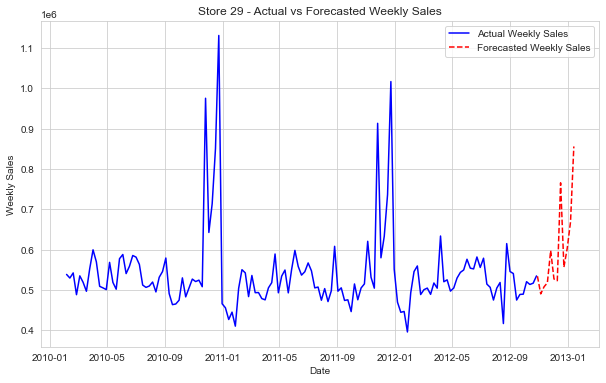

Forecasted Weekly Sales for Store 29:
         Date  Forecasted_Sales
0  2012-10-28         534240.38
1  2012-11-04         490402.19
2  2012-11-11         507936.71
3  2012-11-18         517859.99
4  2012-11-25         597819.93
5  2012-12-02         527209.11
6  2012-12-09         523078.89
7  2012-12-16         765654.32
8  2012-12-23         556615.92
9  2012-12-30         603309.79
10 2013-01-06         668962.75
11 2013-01-13         855832.43
Store 30 - Period of Seasonality: 2.17


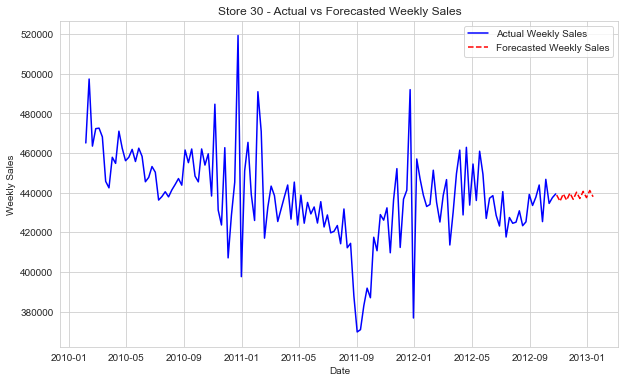

Forecasted Weekly Sales for Store 30:
         Date  Forecasted_Sales
0  2012-10-28         438818.76
1  2012-11-04         435703.77
2  2012-11-11         439392.31
3  2012-11-18         436238.32
4  2012-11-25         439821.33
5  2012-12-02         436668.09
6  2012-12-09         440253.87
7  2012-12-16         437100.61
8  2012-12-23         440686.32
9  2012-12-30         437533.06
10 2013-01-06         441118.77
11 2013-01-13         437965.51
Store 31 - Period of Seasonality: 13.0


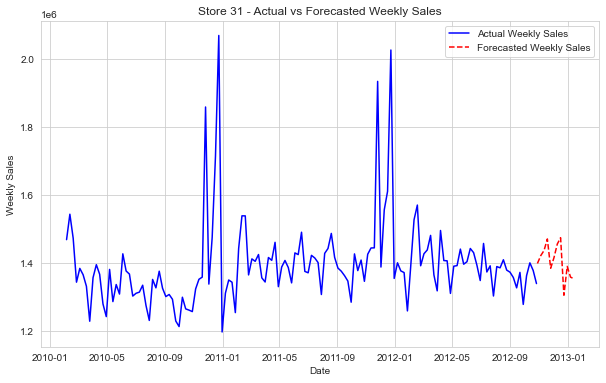

Forecasted Weekly Sales for Store 31:
         Date  Forecasted_Sales
0  2012-10-28        1399316.51
1  2012-11-04        1422236.32
2  2012-11-11        1437468.94
3  2012-11-18        1471311.93
4  2012-11-25        1385265.24
5  2012-12-02        1416426.81
6  2012-12-09        1456335.53
7  2012-12-16        1474872.58
8  2012-12-23        1306001.96
9  2012-12-30        1390727.61
10 2013-01-06        1359222.95
11 2013-01-13        1354440.08
Store 32 - Period of Seasonality: 28.6


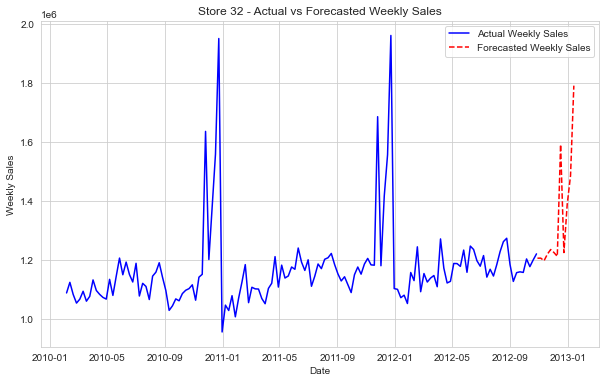

Forecasted Weekly Sales for Store 32:
         Date  Forecasted_Sales
0  2012-10-28        1205289.68
1  2012-11-04        1205533.03
2  2012-11-11        1196604.40
3  2012-11-18        1218873.31
4  2012-11-25        1234708.23
5  2012-12-02        1224411.84
6  2012-12-09        1211462.95
7  2012-12-16        1590153.68
8  2012-12-23        1224354.54
9  2012-12-30        1388190.02
10 2013-01-06        1484768.60
11 2013-01-13        1789575.81
Store 33 - Period of Seasonality: 4.33


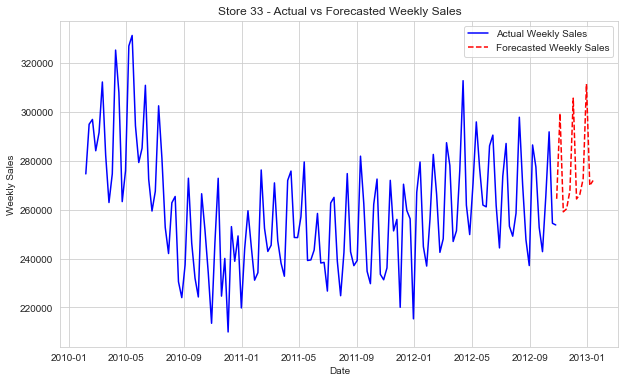

Forecasted Weekly Sales for Store 33:
         Date  Forecasted_Sales
0  2012-10-28         264415.91
1  2012-11-04         299325.60
2  2012-11-11         259099.62
3  2012-11-18         260319.32
4  2012-11-25         267777.84
5  2012-12-02         305552.35
6  2012-12-09         264354.40
7  2012-12-16         266223.89
8  2012-12-23         272578.89
9  2012-12-30         311333.31
10 2013-01-06         269802.90
11 2013-01-13         271894.65
Store 34 - Period of Seasonality: 47.67


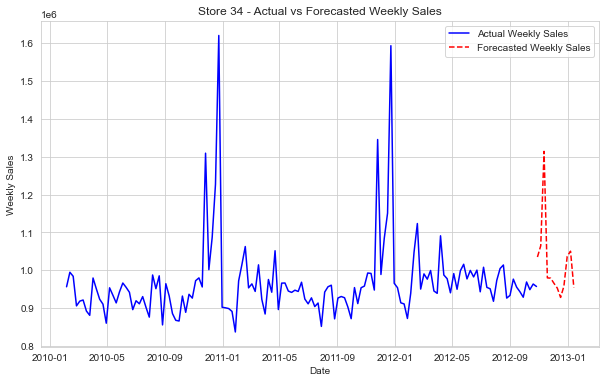

Forecasted Weekly Sales for Store 34:
         Date  Forecasted_Sales
0  2012-10-28        1034924.24
1  2012-11-04        1064668.55
2  2012-11-11        1314277.05
3  2012-11-18         979775.95
4  2012-11-25         979021.52
5  2012-12-02         965284.78
6  2012-12-09         952754.35
7  2012-12-16         928069.63
8  2012-12-23         957900.23
9  2012-12-30        1036753.71
10 2013-01-06        1050300.98
11 2013-01-13         954385.17
Store 35 - Period of Seasonality: 13.0


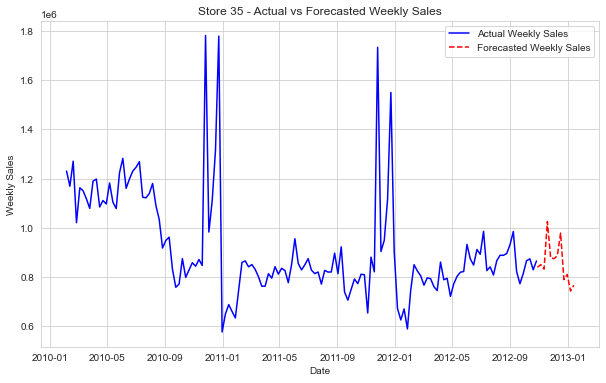

Forecasted Weekly Sales for Store 35:
         Date  Forecasted_Sales
0  2012-10-28         839407.12
1  2012-11-04         850116.38
2  2012-11-11         831881.83
3  2012-11-18        1025312.87
4  2012-11-25         877519.16
5  2012-12-02         874414.54
6  2012-12-09         885908.05
7  2012-12-16         978416.18
8  2012-12-23         789317.23
9  2012-12-30         810209.27
10 2013-01-06         742938.53
11 2013-01-13         766634.21
Store 36 - Period of Seasonality: 4.33


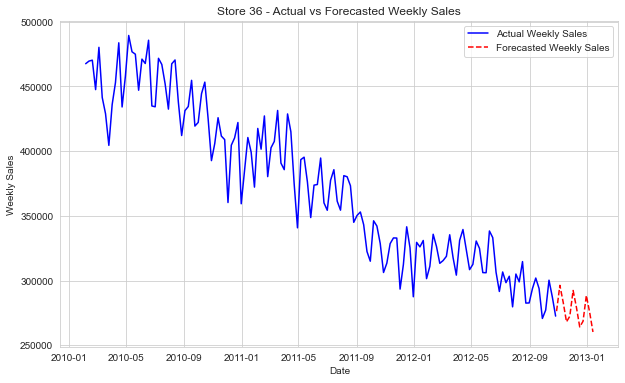

Forecasted Weekly Sales for Store 36:
         Date  Forecasted_Sales
0  2012-10-28         276304.52
1  2012-11-04         296248.02
2  2012-11-11         283241.34
3  2012-11-18         268062.54
4  2012-11-25         272392.34
5  2012-12-02         292308.25
6  2012-12-09         279317.61
7  2012-12-16         264128.64
8  2012-12-23         268483.05
9  2012-12-30         288397.82
10 2013-01-06         275407.95
11 2013-01-13         260218.51
Store 37 - Period of Seasonality: 47.67


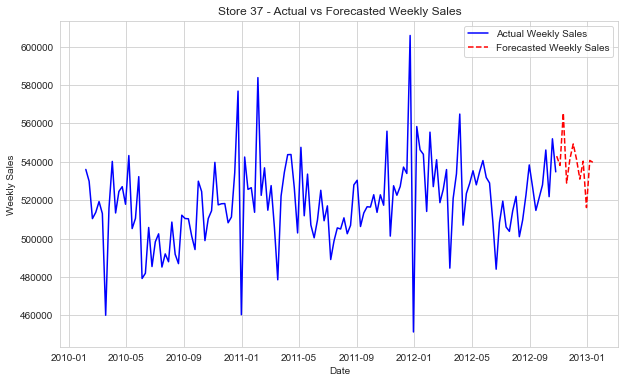

Forecasted Weekly Sales for Store 37:
         Date  Forecasted_Sales
0  2012-10-28         542929.50
1  2012-11-04         538069.50
2  2012-11-11         565375.22
3  2012-11-18         528901.48
4  2012-11-25         541517.43
5  2012-12-02         549277.29
6  2012-12-09         541266.57
7  2012-12-16         530945.46
8  2012-12-23         540291.89
9  2012-12-30         516140.50
10 2013-01-06         540691.09
11 2013-01-13         539618.87
Store 38 - Period of Seasonality: 4.33


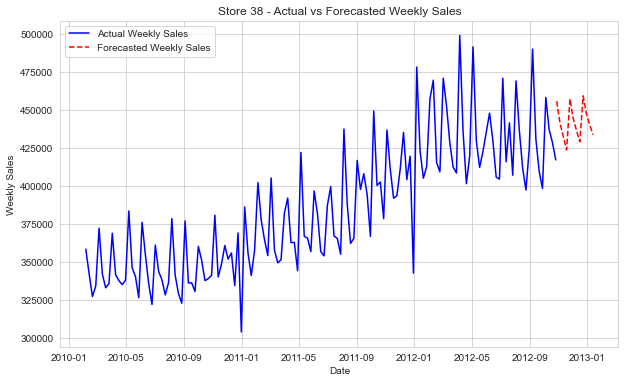

Forecasted Weekly Sales for Store 38:
         Date  Forecasted_Sales
0  2012-10-28         455995.77
1  2012-11-04         441492.55
2  2012-11-11         432698.56
3  2012-11-18         423801.10
4  2012-11-25         457540.36
5  2012-12-02         444487.05
6  2012-12-09         436554.67
7  2012-12-16         429181.09
8  2012-12-23         459492.10
9  2012-12-30         447436.36
10 2013-01-06         440129.33
11 2013-01-13         433837.85
Store 39 - Period of Seasonality: 17.88


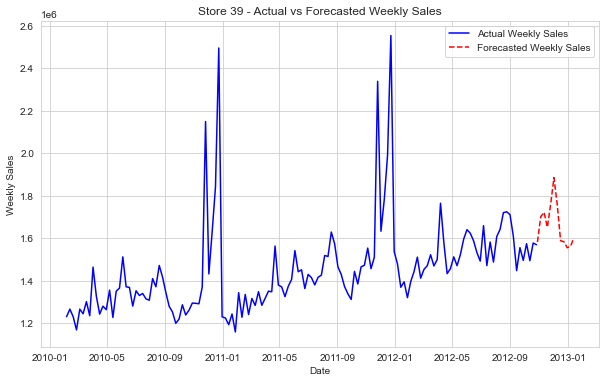

Forecasted Weekly Sales for Store 39:
         Date  Forecasted_Sales
0  2012-10-28        1581889.48
1  2012-11-04        1701049.57
2  2012-11-11        1722349.07
3  2012-11-18        1651661.28
4  2012-11-25        1761358.19
5  2012-12-02        1885325.39
6  2012-12-09        1756243.68
7  2012-12-16        1587990.04
8  2012-12-23        1583951.91
9  2012-12-30        1555464.74
10 2013-01-06        1562377.23
11 2013-01-13        1600890.17
Store 40 - Period of Seasonality: 23.83


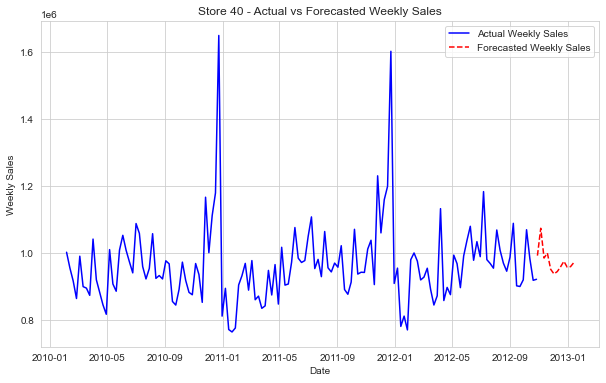

Forecasted Weekly Sales for Store 40:
         Date  Forecasted_Sales
0  2012-10-28         991868.43
1  2012-11-04        1073542.83
2  2012-11-11         984619.98
3  2012-11-18         999557.89
4  2012-11-25         951137.73
5  2012-12-02         937260.31
6  2012-12-09         944310.82
7  2012-12-16         958546.20
8  2012-12-23         974943.20
9  2012-12-30         957340.39
10 2013-01-06         958938.58
11 2013-01-13         971217.67
Store 41 - Period of Seasonality: 17.88


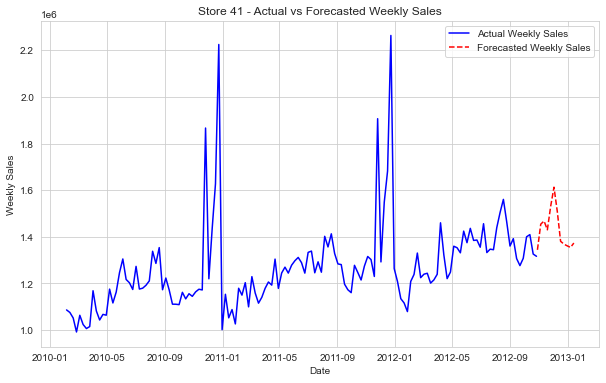

Forecasted Weekly Sales for Store 41:
         Date  Forecasted_Sales
0  2012-10-28        1344236.74
1  2012-11-04        1454240.36
2  2012-11-11        1468110.41
3  2012-11-18        1430165.96
4  2012-11-25        1530920.64
5  2012-12-02        1612952.15
6  2012-12-09        1508976.32
7  2012-12-16        1380839.89
8  2012-12-23        1368739.77
9  2012-12-30        1361406.07
10 2013-01-06        1354542.09
11 2013-01-13        1373437.74
Store 42 - Period of Seasonality: 4.33


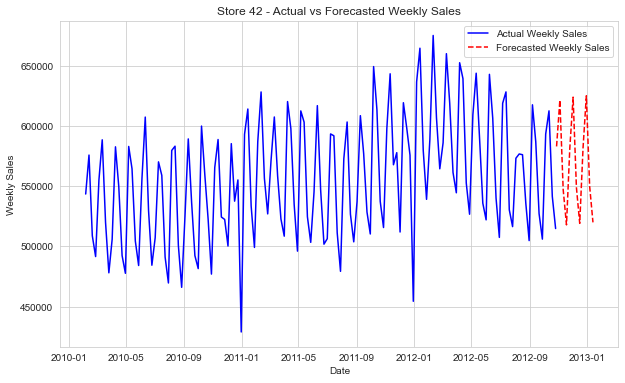

Forecasted Weekly Sales for Store 42:
         Date  Forecasted_Sales
0  2012-10-28         582882.24
1  2012-11-04         621320.67
2  2012-11-11         547073.33
3  2012-11-18         517814.37
4  2012-11-25         581262.27
5  2012-12-02         623768.79
6  2012-12-09         548830.35
7  2012-12-16         519038.06
8  2012-12-23         581523.89
9  2012-12-30         624866.70
10 2013-01-06         549786.19
11 2013-01-13         519884.28
Store 43 - Period of Seasonality: 4.33


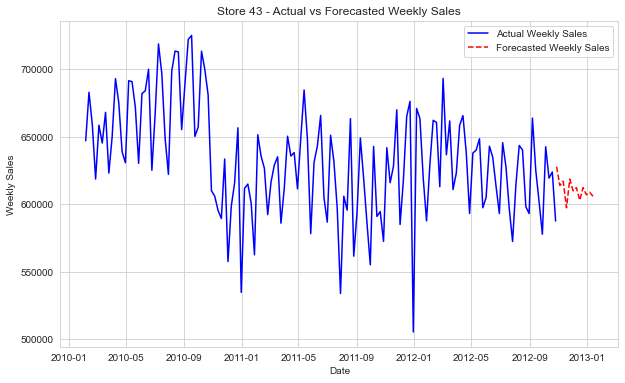

Forecasted Weekly Sales for Store 43:
         Date  Forecasted_Sales
0  2012-10-28         627854.80
1  2012-11-04         613852.13
2  2012-11-11         617086.43
3  2012-11-18         597376.07
4  2012-11-25         618583.61
5  2012-12-02         609962.92
6  2012-12-09         612343.81
7  2012-12-16         602956.27
8  2012-12-23         612320.86
9  2012-12-30         607047.00
10 2013-01-06         608897.18
11 2013-01-13         605929.06
Store 44 - Period of Seasonality: 2.47


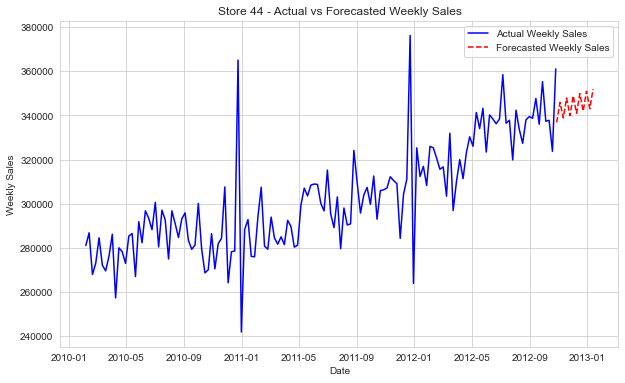

Forecasted Weekly Sales for Store 44:
         Date  Forecasted_Sales
0  2012-10-28         336852.29
1  2012-11-04         345928.17
2  2012-11-11         338916.01
3  2012-11-18         347893.20
4  2012-11-25         339912.13
5  2012-12-02         348859.90
6  2012-12-09         340953.96
7  2012-12-16         349903.25
8  2012-12-23         341991.94
9  2012-12-30         350941.10
10 2013-01-06         343030.18
11 2013-01-13         351979.36
Store 45 - Period of Seasonality: 28.6


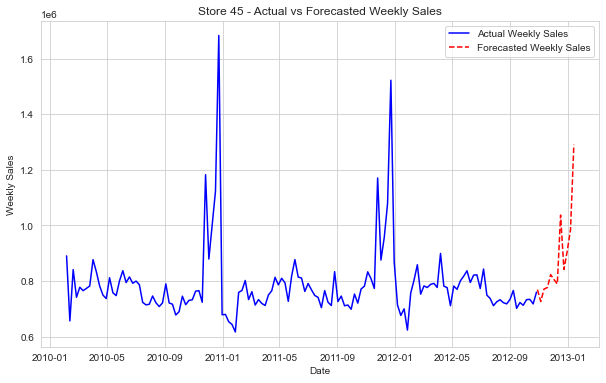

Forecasted Weekly Sales for Store 45:
         Date  Forecasted_Sales
0  2012-10-28         769385.76
1  2012-11-04         726788.47
2  2012-11-11         771706.04
3  2012-11-18         776765.63
4  2012-11-25         823279.97
5  2012-12-02         805632.50
6  2012-12-09         789571.84
7  2012-12-16        1037292.75
8  2012-12-23         841821.35
9  2012-12-30         907474.79
10 2013-01-06         985545.06
11 2013-01-13        1290211.89
Forecasted Weekly Sales for All Stores:


,Date,Store_1_Forecast,Store_2_Forecast,Store_3_Forecast,Store_4_Forecast,Store_5_Forecast,Store_6_Forecast,Store_7_Forecast,Store_8_Forecast,Store_9_Forecast,...,Store_36_Forecast,Store_37_Forecast,Store_38_Forecast,Store_39_Forecast,Store_40_Forecast,Store_41_Forecast,Store_42_Forecast,Store_43_Forecast,Store_44_Forecast,Store_45_Forecast
0,2012-10-28,1700310.54,2044495.52,400185.43,2301830.56,351536.25,1512271.98,523101.88,949433.99,588346.44,...,276304.52,542929.50,455995.77,1581889.48,991868.43,1344236.74,582882.24,627854.80,336852.29,769385.76
1,2012-11-04,1655678.27,2064275.30,397595.13,2407919.38,327354.58,1649341.96,590942.30,1005210.71,579534.03,...,296248.02,538069.50,441492.55,1701049.57,1073542.83,1454240.36,621320.67,613852.13,345928.17,726788.47
2,2012-11-11,1619585.47,2477705.29,420312.67,2817638.90,333660.75,1642659.79,546990.39,1187659.56,582291.62,...,283241.34,565375.22,432698.56,1722349.07,984619.98,1468110.41,547073.33,617086.43,338916.01,771706.04
3,2012-11-18,1644389.67,1877221.89,399920.69,2119330.20,363902.32,1586850.75,535414.92,915697.38,619571.73,...,268062.54,528901.48,423801.10,1651661.28,999557.89,1430165.96,517814.37,597376.07,347893.20,776765.63
4,2012-11-25,1659954.25,1887321.16,390139.95,2159368.95,354657.25,1678323.98,498504.07,945108.72,598014.80,...,272392.34,541517.43,457540.36,1761358.19,951137.73,1530920.64,581262.27,618583.61,339912.13,823279.97
5,2012-12-02,1662441.75,1786917.85,377728.12,2115827.17,338718.14,1760480.13,481069.28,942418.23,580199.77,...,292308.25,549277.29,444487.05,1885325.39,937260.31,1612952.15,623768.79,609962.92,348859.90,805632.50
6,2012-12-09,1679272.82,1796295.70,367746.20,2127069.26,339590.43,1639899.88,476734.05,880409.47,591651.98,...,279317.61,541266.57,436554.67,1756243.68,944310.82,1508976.32,548830.35,612343.81,340953.96,789571.84
7,2012-12-16,1694337.80,1777257.63,380415.45,2060350.30,353942.34,1468736.62,480975.32,867762.50,630271.98,...,264128.64,530945.46,429181.09,1587990.04,958546.20,1380839.89,519038.06,602956.27,349903.25,1037292.75
8,2012-12-23,1560243.65,1864935.72,384755.98,2162463.67,334836.03,1432439.04,457477.83,937078.51,558522.91,...,268483.05,540291.89,459492.10,1583951.91,974943.20,1368739.77,581523.89,612320.86,341991.94,841821.35
9,2012-12-30,1662423.48,1938367.28,394652.66,2266234.12,333508.25,1406052.82,461476.73,988721.18,565146.86,...,288397.82,516140.50,447436.36,1555464.74,957340.39,1361406.07,624866.70,607047.00,350941.10,907474.79


In [152]:
# Function to build SARIMA model for each store and return forecasted values
def build_sarima_model(df, store_num, period):
    # Filter data for the store
    store_data = df[df['Store'] == store_num]['Scaled_Weekly_Sales']
    
    # Convert to NumPy array and reshape
    store_data = np.array(store_data).reshape(-1, 1)
    
    # Build SARIMA model
    model = SARIMAX(store_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, period))
    fitted_model = model.fit()
    
    # Forecast for next 12 weeks
    forecast = fitted_model.forecast(steps=12)
    
    # Reverse MinMax scaling for forecast
    scaler = MinMaxScaler()
    scaler.fit(df['Weekly_Sales'].values.reshape(-1, 1))  # Using the original 'Weekly_Sales' for scaling
    forecast = scaler.inverse_transform(forecast.reshape(-1, 1)).flatten()
    
    # Create date range for forecast starting from the last date in the dataset + 7 days
    last_date = df[df['Store'] == store_num].index[-1]
    forecast_dates = pd.date_range(last_date + pd.DateOffset(days=1), periods=12, freq='W')
    
    # Plot actual weekly sales with forecast
    plt.figure(figsize=(10, 6))
    plt.plot(df[df['Store'] == store_num].index, df[df['Store'] == store_num]['Weekly_Sales'], label='Actual Weekly Sales', color='blue')
    plt.plot(forecast_dates, forecast, label='Forecasted Weekly Sales', color='red', linestyle='dashed')
    plt.xlabel('Date')
    plt.ylabel('Weekly Sales')
    plt.title(f'Store {store_num} - Actual vs Forecasted Weekly Sales')
    plt.legend()
    plt.show()
    
    # Display forecasted values for the store
    print(f"Forecasted Weekly Sales for Store {store_num}:")
    print(pd.DataFrame({'Date': forecast_dates, 'Forecasted_Sales': forecast}))
    print("="*50)
    
    # Create DataFrame for forecasted values
    forecast_df = pd.DataFrame({
        'Date': forecast_dates,
        f'Store_{store_num}_Forecast': forecast
    })
    
    return forecast_df

# Iterate through each store
unique_stores = df['Store'].unique()

forecast_dfs = []
for store_num in unique_stores:
    period = get_period_for_store(store_num)
    print(f"Store {store_num} - Period of Seasonality: {period}")
    
    # Build SARIMA model for the store and get forecasted values
    forecast_df = build_sarima_model(df, store_num, int(period))
    forecast_dfs.append(forecast_df)

# Concatenate all forecast DataFrames
forecast_combined = pd.concat(forecast_dfs, axis=1)

# Get unique date values for the combined forecast
forecast_dates_combined = forecast_combined['Date'].iloc[:, 0]

# Create a new DataFrame with one date column and all store forecasts
final_forecast_combined = pd.DataFrame({'Date': forecast_dates_combined})
for col in forecast_combined.columns[1:]:
    final_forecast_combined[col] = forecast_combined[col].values

# Display forecasted values for all stores with one date column
print("Forecasted Weekly Sales for All Stores:")
final_forecast_combined